# Two separated Models with Augmnetation

⚠️ Warning: Expected 104 columns, got 13. Trying to transpose...
✅ Loaded response matrix of shape: (13, 104)
Reactor Train size: 58, Reactor Test size: 5
Accelerator Train size: 45, Accelerator Test size: 5
✅ After augmentation: Reactor Train size: 174, Accelerator Train size: 495
✅ Power Reactor | Mean Squared Error on Custom Test Set: 0.000054


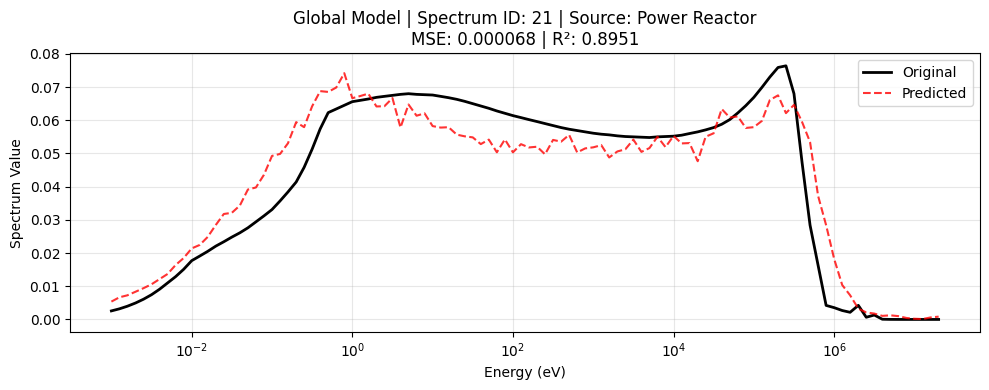

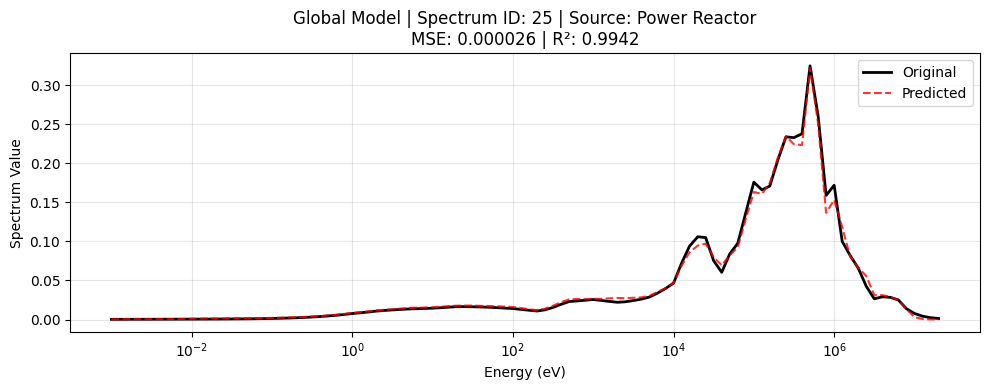

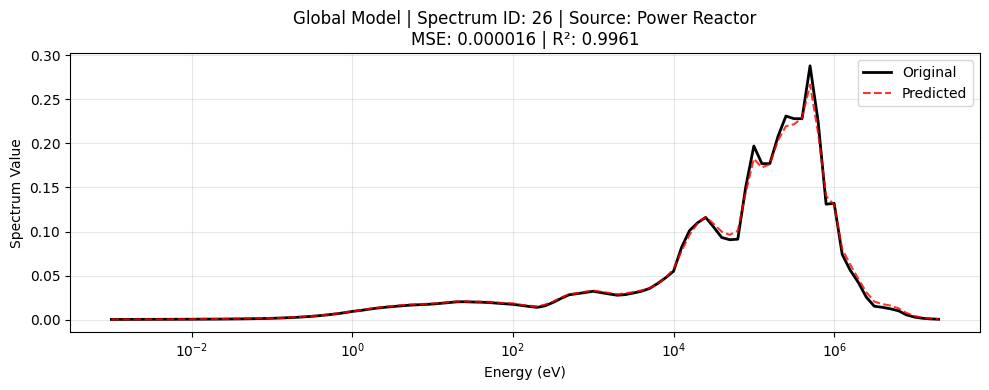

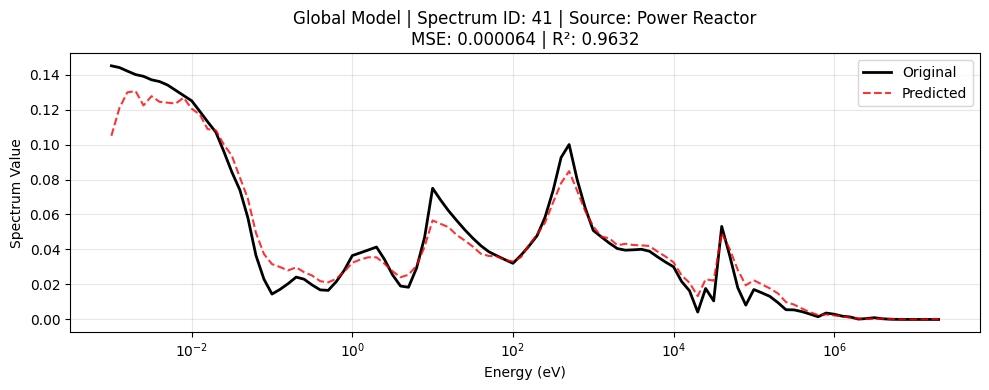

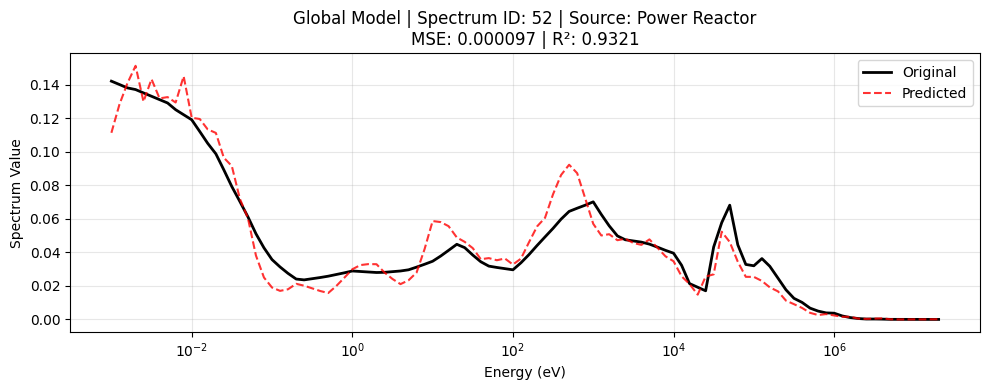

✅ Accelerator | Mean Squared Error on Custom Test Set: 0.000593


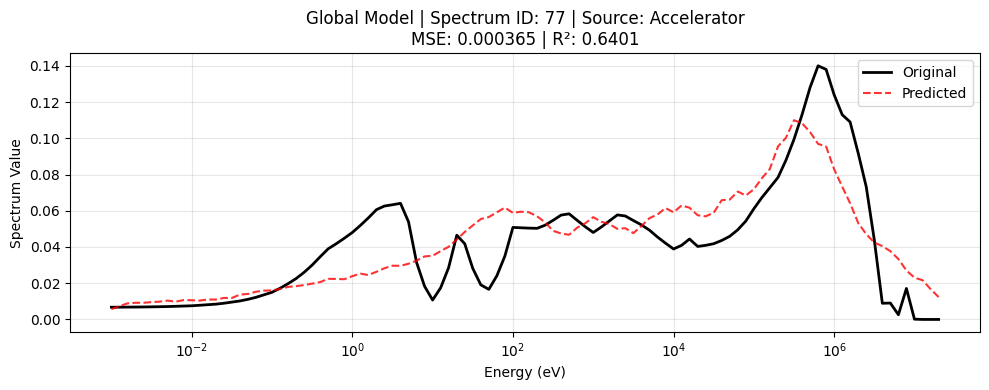

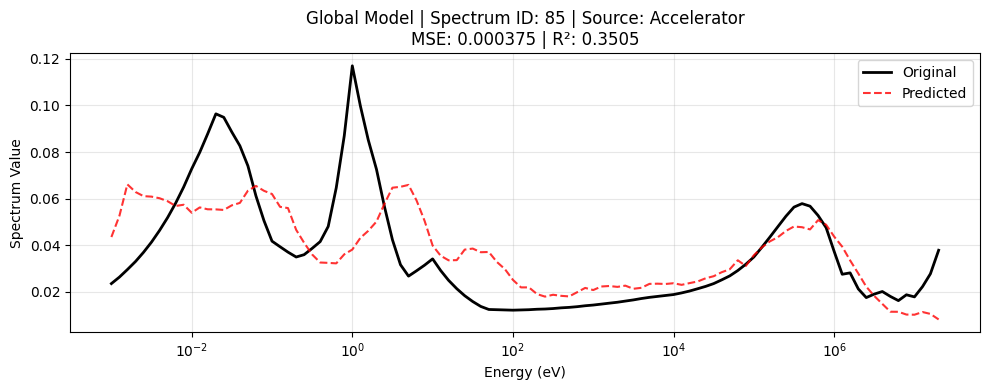

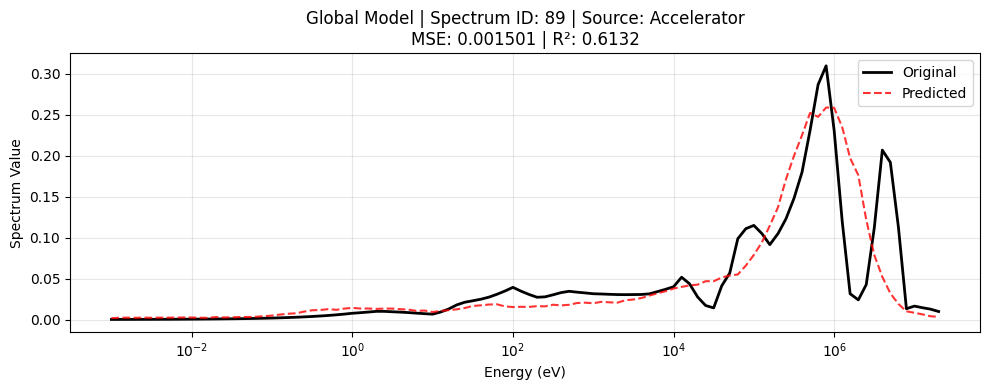

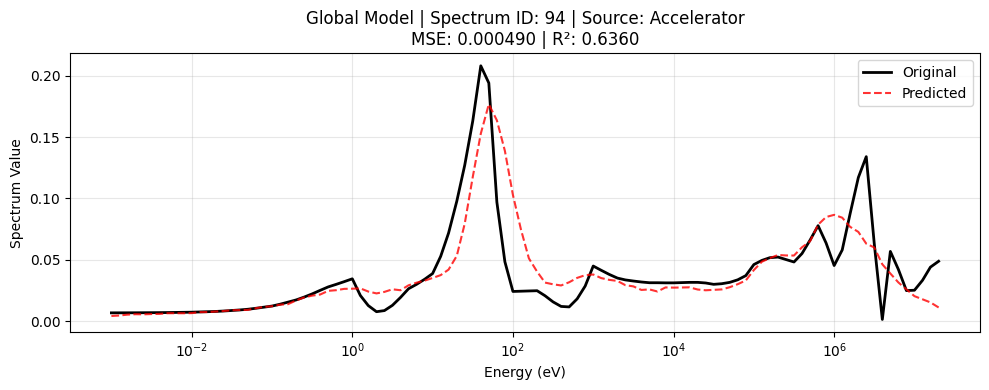

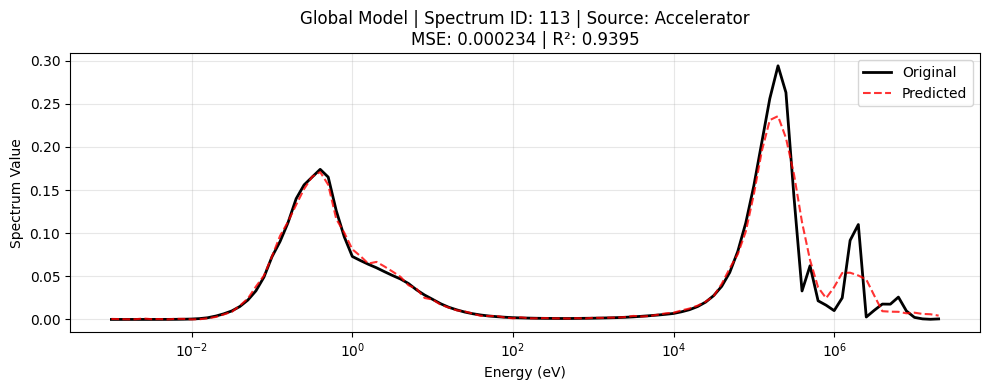

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# --- Load & preprocess dataset ---
df = pd.read_csv("/content/Dataset_with_spectrum_id.csv")

# Detect columns
spectrum_cols = [c for c in df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in df.columns if c.startswith("count_")]

df[spectrum_cols] = df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# --- Load & preprocess response matrix ---
resp_df = pd.read_csv("/content/Response_Matrix.csv")
response_matrix = resp_df.select_dtypes(include=[np.number]).values

# Ensure shape compatibility (transpose if needed)
if response_matrix.shape[1] != len(spectrum_cols):
    print(f"⚠️ Warning: Expected {len(spectrum_cols)} columns, got {response_matrix.shape[1]}. Trying to transpose...")
    response_matrix = response_matrix.T

assert response_matrix.shape[1] == len(spectrum_cols), \
    f"❌ Shape mismatch: response_matrix has {response_matrix.shape[1]} columns, expected {len(spectrum_cols)}"

print(f"✅ Loaded response matrix of shape: {response_matrix.shape}")

# --- Define custom test spectrum IDs ---
reactor_test_ids = {21, 26, 41, 52, 25}
accelerator_test_ids = {113, 94, 89, 85, 77}

# --- Split train/test for reactors ---
reactor_df = df[df["Energy_Source"] == "Power Reactor"]
reactor_train_df = reactor_df[~reactor_df["spectrum_id"].isin(reactor_test_ids)].reset_index(drop=True)
reactor_test_df = reactor_df[reactor_df["spectrum_id"].isin(reactor_test_ids)].reset_index(drop=True)

# --- Split train/test for accelerators ---
accelerator_df = df[df["Energy_Source"] == "Accelerator"]
accelerator_train_df = accelerator_df[~accelerator_df["spectrum_id"].isin(accelerator_test_ids)].reset_index(drop=True)
accelerator_test_df = accelerator_df[accelerator_df["spectrum_id"].isin(accelerator_test_ids)].reset_index(drop=True)

print(f"Reactor Train size: {len(reactor_train_df)}, Reactor Test size: {len(reactor_test_df)}")
print(f"Accelerator Train size: {len(accelerator_train_df)}, Accelerator Test size: {len(accelerator_test_df)}")

# --- Augmentation Techniques ---
def add_gaussian_noise(spectrum, noise_level=0.1):
    noise = np.random.normal(loc=0, scale=noise_level * np.maximum(spectrum, 0.01), size=spectrum.shape)
    return np.clip(spectrum + noise, 0, None)

def multiplicative_noise(spectrum, scale_range=(0.95, 1.05)):
    scale = np.random.uniform(*scale_range)
    return spectrum * scale

def smooth_spectrum(spectrum, window_size=5):
    kernel = np.ones(window_size) / window_size
    smoothed = np.convolve(spectrum, kernel, mode="same")
    return smoothed

def random_peak_scaling(spectrum, prominence=0.05, scale_range=(0.8, 1.3)):
    peaks, _ = find_peaks(spectrum, prominence=prominence * np.max(spectrum))
    if len(peaks) == 0:
        return spectrum

    aug = spectrum.copy()
    n_peaks_to_modify = np.random.randint(1, min(len(peaks), 3) + 1)
    selected_peaks = np.random.choice(peaks, size=n_peaks_to_modify, replace=False)

    for p in selected_peaks:
        scale = np.random.uniform(*scale_range)
        aug[p] *= scale
        if p > 0: aug[p-1] *= (scale + 1)/2
        if p < len(aug)-1: aug[p+1] *= (scale + 1)/2

    return np.clip(aug, 0, None)

def augment_sequentially(spectrum):
    aug = random_peak_scaling(spectrum)
    aug = smooth_spectrum(aug)
    aug = multiplicative_noise(aug)
    aug = add_gaussian_noise(aug)
    return np.clip(aug, 0, None)

# --- Augment training dataset & recompute counts ---
def augment_training_data(train_df, n_augments=1):
    augmented_rows = []
    for _, row in train_df.iterrows():
        spectrum = row[spectrum_cols].values.astype(float)
        for _ in range(n_augments):
            augmented_row = row.copy()
            new_spectrum = augment_sequentially(spectrum)
            augmented_row[spectrum_cols] = new_spectrum

            # ✅ Recompute counts using response matrix
            new_counts = response_matrix @ new_spectrum
            augmented_row[count_cols] = new_counts

            augmented_rows.append(augmented_row)

    if augmented_rows:
        return pd.concat([train_df, pd.DataFrame(augmented_rows)], ignore_index=True)
    return train_df

# --- Apply augmentation ---
reactor_train_df = augment_training_data(reactor_train_df, n_augments=2)
accelerator_train_df = augment_training_data(accelerator_train_df, n_augments=10)

print(f"✅ After augmentation: Reactor Train size: {len(reactor_train_df)}, Accelerator Train size: {len(accelerator_train_df)}")

# --- Helper function to train & evaluate ---
def train_and_evaluate(train_df, test_df, title_prefix):
    X_train = train_df[count_cols].copy()
    y_train = train_df[spectrum_cols].values

    X_test = test_df[count_cols].copy()
    y_test = test_df[spectrum_cols].values

    model = ExtraTreesRegressor(
        n_estimators=1000,
        random_state=42,
        n_jobs=-1
    )
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    print(f"✅ {title_prefix} | Mean Squared Error on Custom Test Set: {mse:.6f}")

    # --- Energy bins for plotting ---
    energy_bins = np.array([
        0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
        0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
        0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
        1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
        10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
        100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
        1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
        10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
        100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
        1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
        10000000, 12600000, 15800000, 20000000
    ])

    for idx in range(len(test_df)):
        spectrum_id = test_df.iloc[idx]["spectrum_id"]
        energy_source = test_df.iloc[idx]["Energy_Source"]
        mse_sample = mean_squared_error(y_test[idx], y_pred[idx])
        r2_sample = r2_score(y_test[idx], y_pred[idx])

        plt.figure(figsize=(10, 4))
        plt.semilogx(energy_bins, y_test[idx], label="Original", color="black", linewidth=2)
        plt.semilogx(energy_bins, y_pred[idx], label="Predicted", color="red", linestyle="--", alpha=0.8)

        plt.title(f"Global Model | Spectrum ID: {spectrum_id} | Source: {energy_source}\nMSE: {mse_sample:.6f} | R²: {r2_sample:.4f}")
        plt.xlabel("Energy (eV)")
        plt.ylabel("Spectrum Value")
        plt.xscale("log")
        plt.legend()
        plt.grid(alpha=0.3, which="both")
        plt.tight_layout()
        plt.show()

# --- Train & Evaluate ---
train_and_evaluate(reactor_train_df, reactor_test_df, "Power Reactor")
train_and_evaluate(accelerator_train_df, accelerator_test_df, "Accelerator")


# Two Separate Models without augmentation

Reactor Train size: 58, Reactor Test size: 5
Accelerator Train size: 45, Accelerator Test size: 5
✅ Power Reactor | Mean Squared Error on Custom Test Set: 0.000044


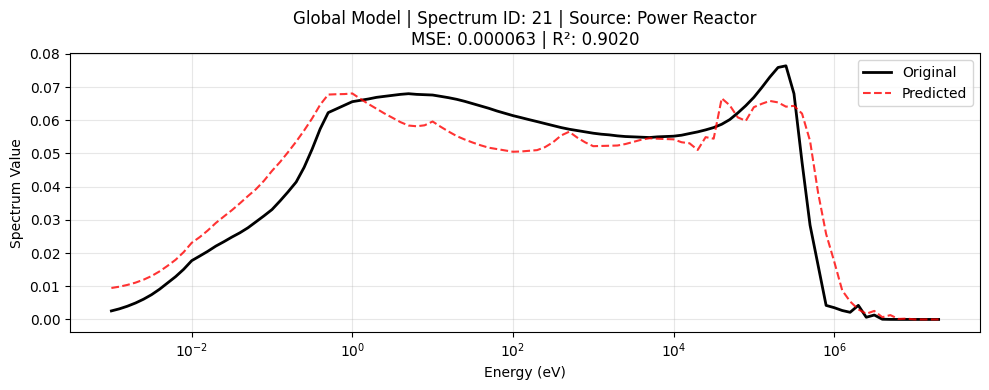

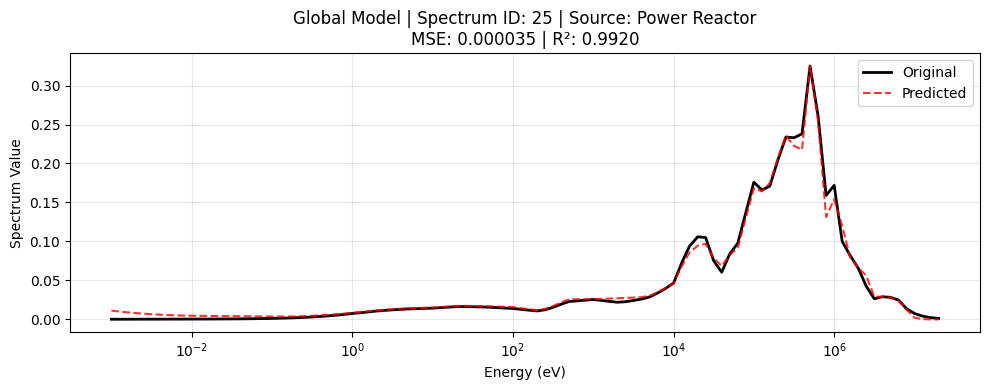

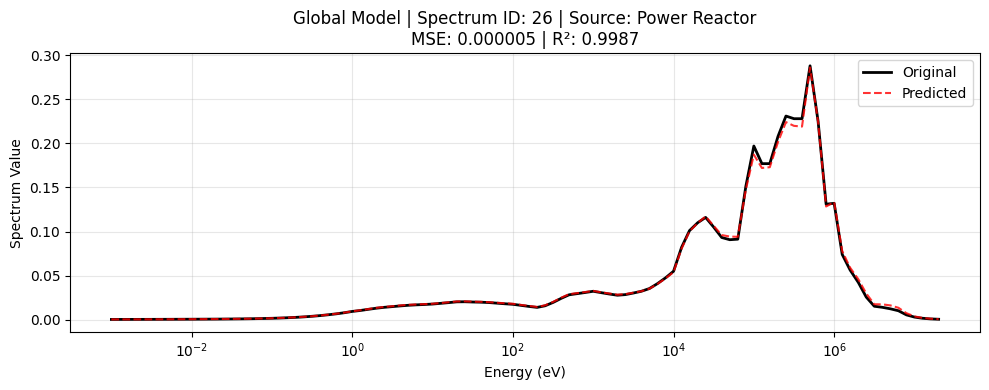

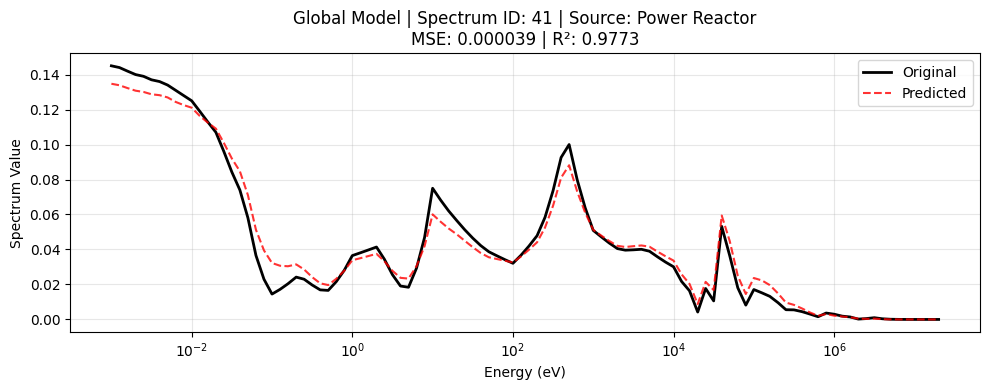

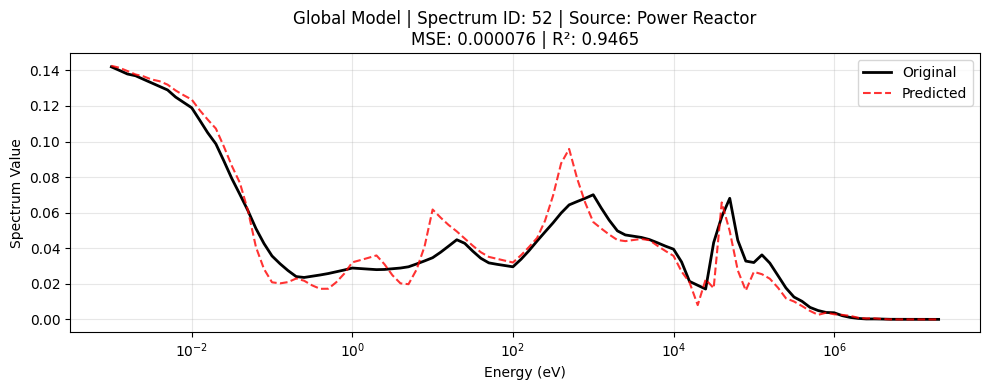

✅ Accelerator | Mean Squared Error on Custom Test Set: 0.000609


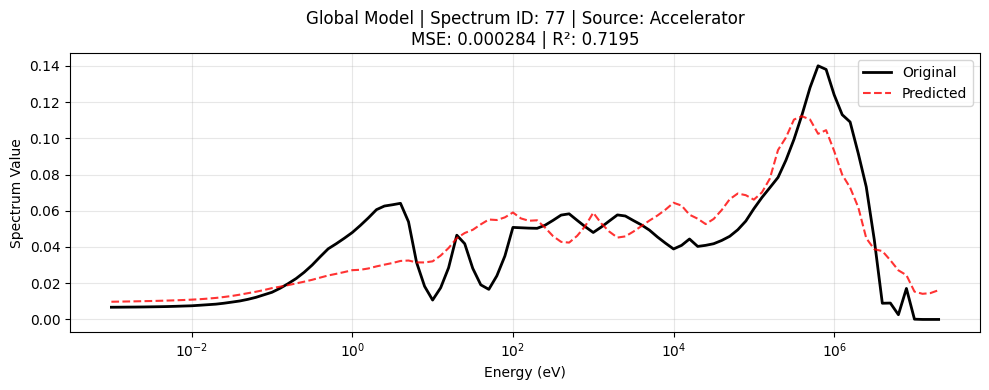

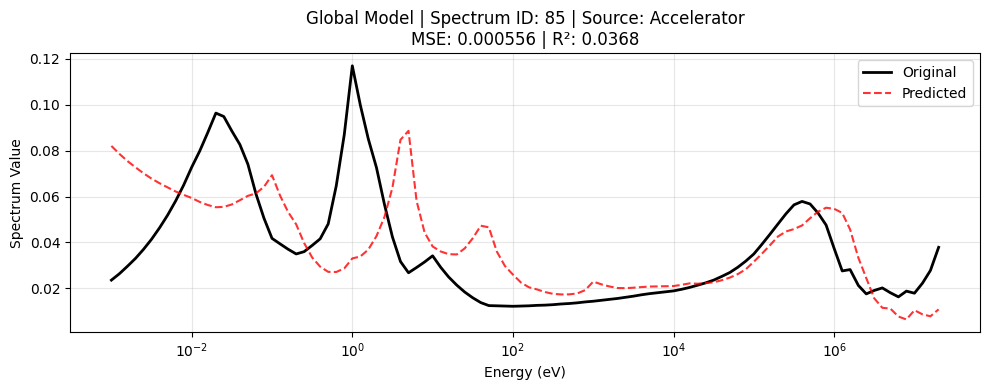

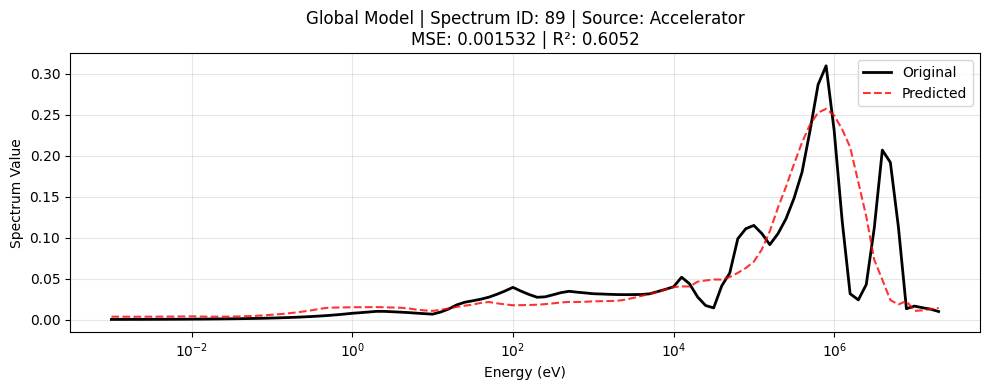

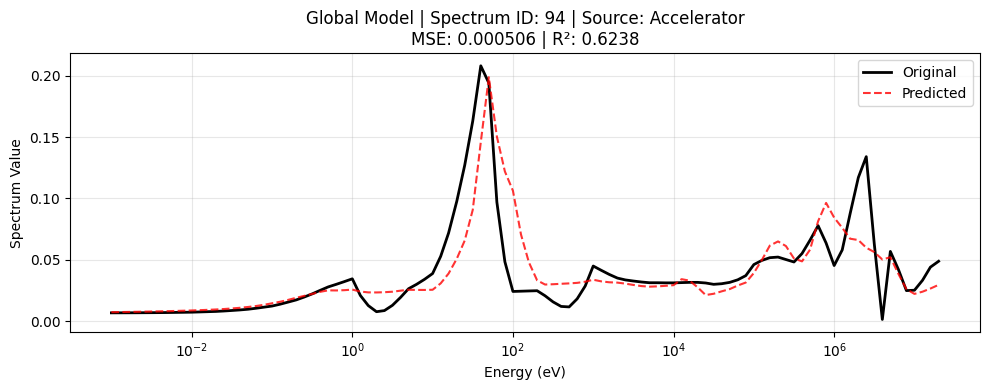

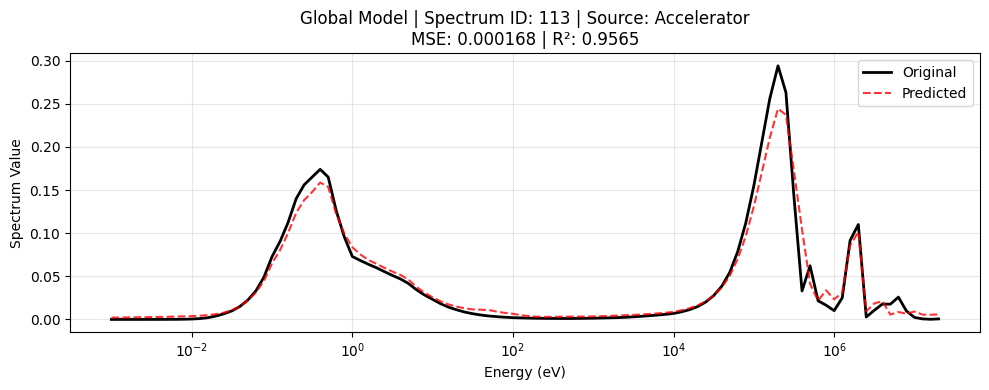

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# --- Load & preprocess dataset ---
df = pd.read_csv("/content/Dataset_with_spectrum_id.csv")

# Detect columns
spectrum_cols = [c for c in df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in df.columns if c.startswith("count_")]

df[spectrum_cols] = df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# --- Define custom test spectrum IDs ---
reactor_test_ids = {21, 26, 41, 52, 25}
accelerator_test_ids = {113, 94, 89, 85, 77}


# --- Split train/test for reactors ---
reactor_df = df[df["Energy_Source"] == "Power Reactor"]
reactor_train_df = reactor_df[~reactor_df["spectrum_id"].isin(reactor_test_ids)].reset_index(drop=True)
reactor_test_df = reactor_df[reactor_df["spectrum_id"].isin(reactor_test_ids)].reset_index(drop=True)

# --- Split train/test for accelerators ---
accelerator_df = df[df["Energy_Source"] == "Accelerator"]
accelerator_train_df = accelerator_df[~accelerator_df["spectrum_id"].isin(accelerator_test_ids)].reset_index(drop=True)
accelerator_test_df = accelerator_df[accelerator_df["spectrum_id"].isin(accelerator_test_ids)].reset_index(drop=True)

print(f"Reactor Train size: {len(reactor_train_df)}, Reactor Test size: {len(reactor_test_df)}")
print(f"Accelerator Train size: {len(accelerator_train_df)}, Accelerator Test size: {len(accelerator_test_df)}")



# --- Helper function to train & evaluate ---
def train_and_evaluate(train_df, test_df, title_prefix):
    X_train = train_df[count_cols].copy()
    y_train = train_df[spectrum_cols].values

    X_test = test_df[count_cols].copy()
    y_test = test_df[spectrum_cols].values

    model = ExtraTreesRegressor(
        n_estimators=1000,
        random_state=42,
        n_jobs=-1
    )
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    print(f"✅ {title_prefix} | Mean Squared Error on Custom Test Set: {mse:.6f}")

    # --- Plot results ---
    x = np.arange(len(spectrum_cols))
    # --- Define energy bins (as given by you) ---
    energy_bins = np.array([
        0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
        0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
        0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
        1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
        10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
        100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
        1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
        10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
        100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
        1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
        10000000, 12600000, 15800000, 20000000
    ])

    # --- In the plotting section, use energy_bins instead of np.arange ---
    for idx in range(len(test_df)):
        spectrum_id = test_df.iloc[idx]["spectrum_id"]
        energy_source = test_df.iloc[idx]["Energy_Source"]
        mse_sample = mean_squared_error(y_test[idx], y_pred[idx])
        r2_sample = r2_score(y_test[idx], y_pred[idx])

        plt.figure(figsize=(10, 4))
        plt.semilogx(energy_bins, y_test[idx], label="Original", color="black", linewidth=2)
        plt.semilogx(energy_bins, y_pred[idx], label="Predicted", color="red", linestyle="--", alpha=0.8)

        plt.title(f"Global Model | Spectrum ID: {spectrum_id} | Source: {energy_source}\nMSE: {mse_sample:.6f} | R²: {r2_sample:.4f}")
        plt.xlabel("Energy (eV)")
        plt.xscale("log")

        plt.ylabel("Spectrum Value")
        plt.legend()
        plt.grid(alpha=0.3, which="both")
        plt.tight_layout()
        plt.show()


# --- Train & Evaluate ---
train_and_evaluate(reactor_train_df, reactor_test_df, "Power Reactor")
train_and_evaluate(accelerator_train_df, accelerator_test_df, "Accelerator")


# One Model Without Augmnetation

/tmp/ipython-input-2142439248.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["Energy_Source_Code"] = df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


Combined Train size: 103, Test size: 10
✅ Global Model | Mean Squared Error on Test Set: 0.000333


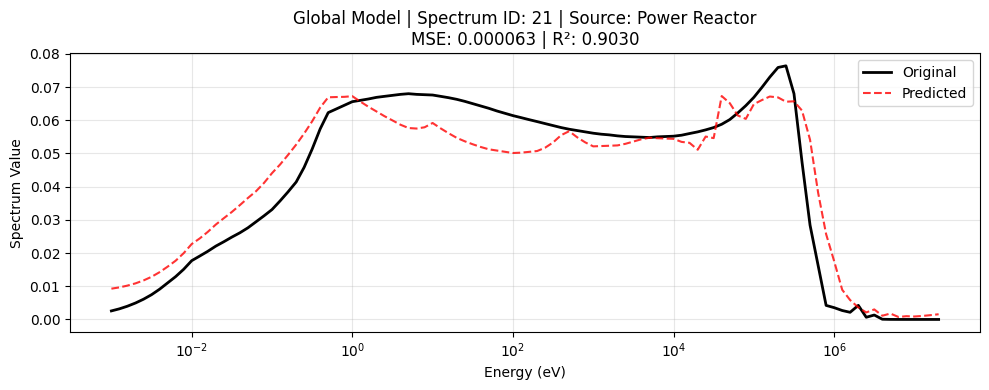

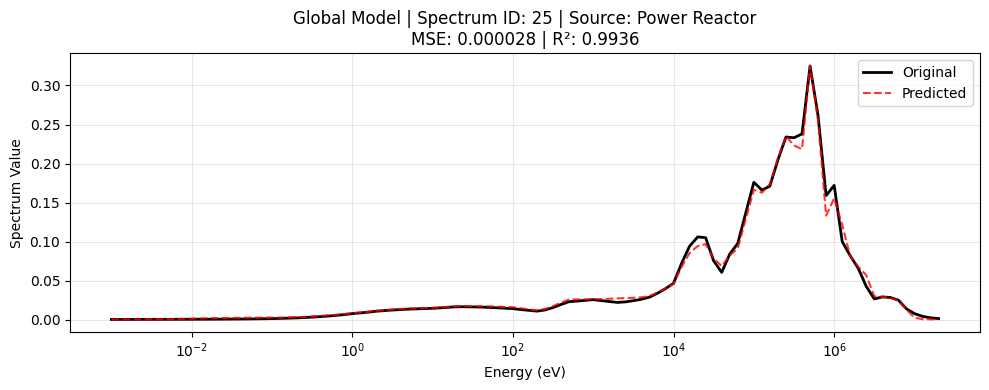

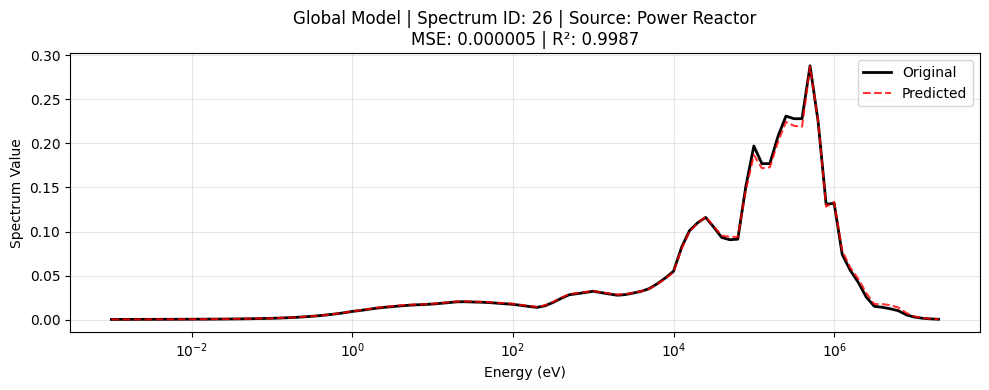

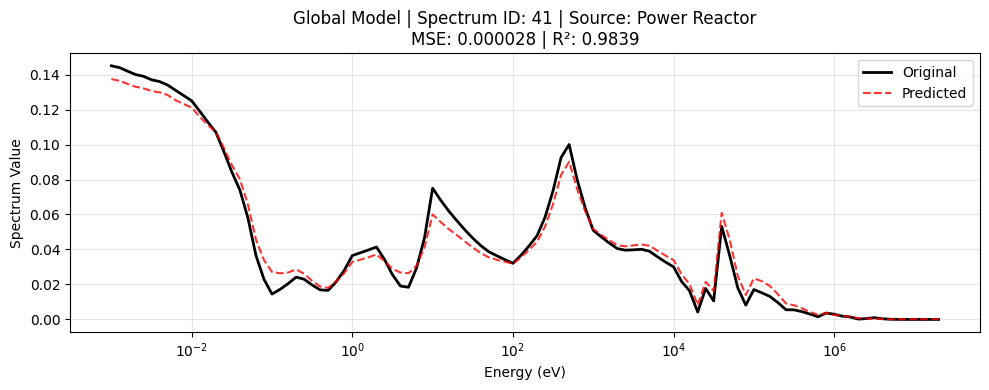

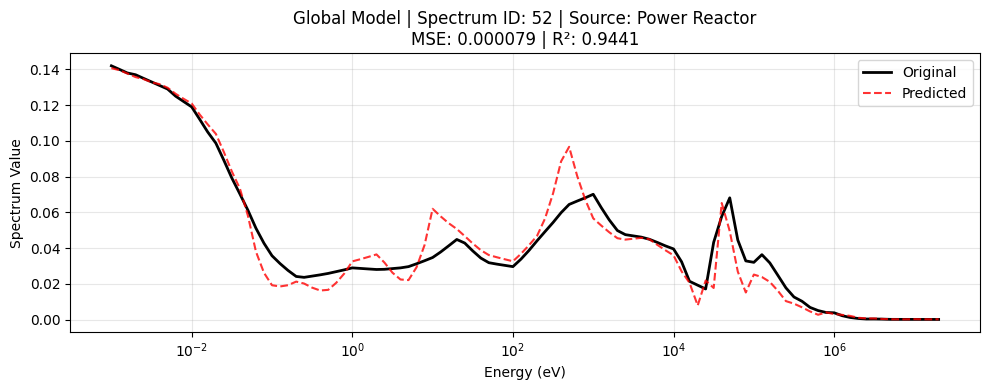

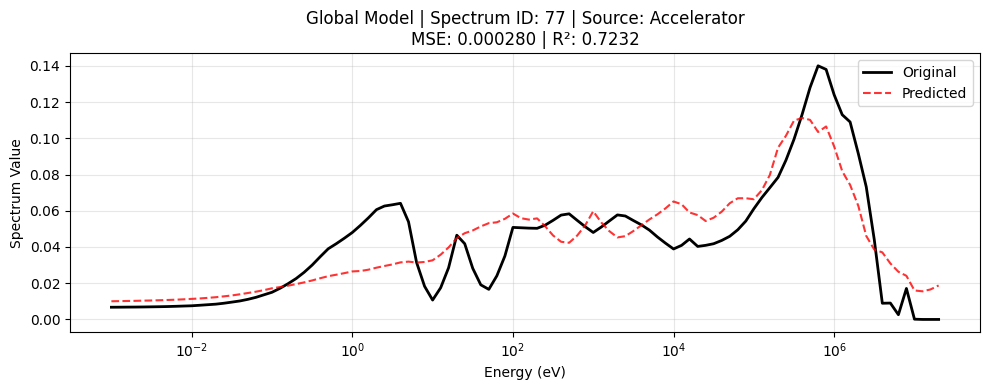

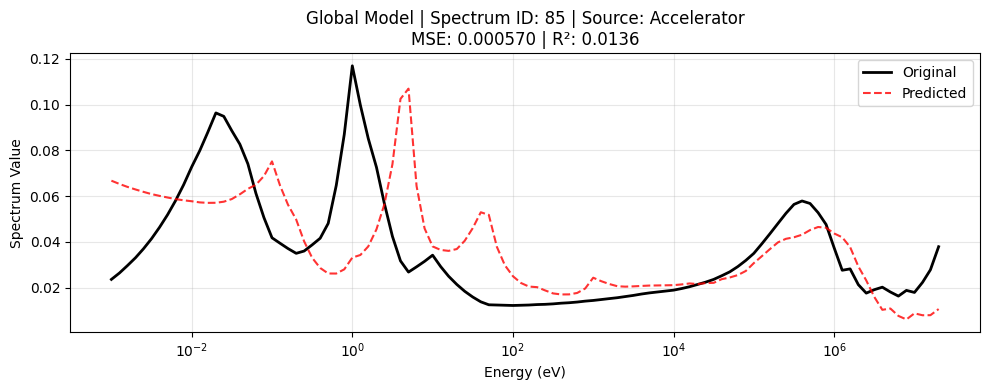

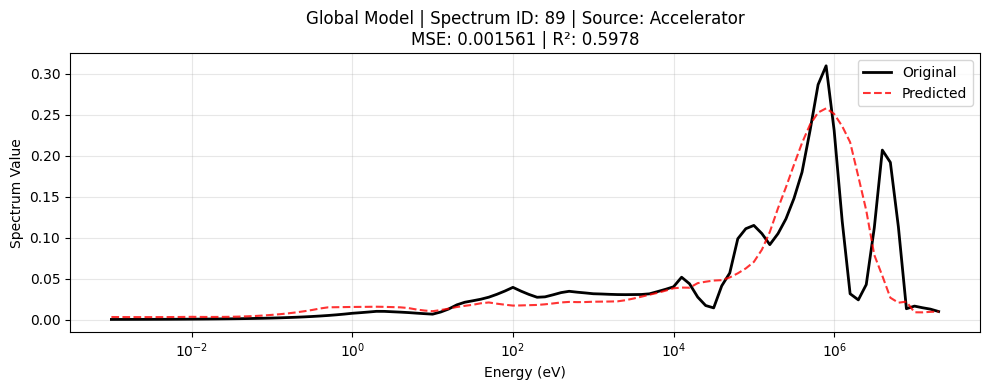

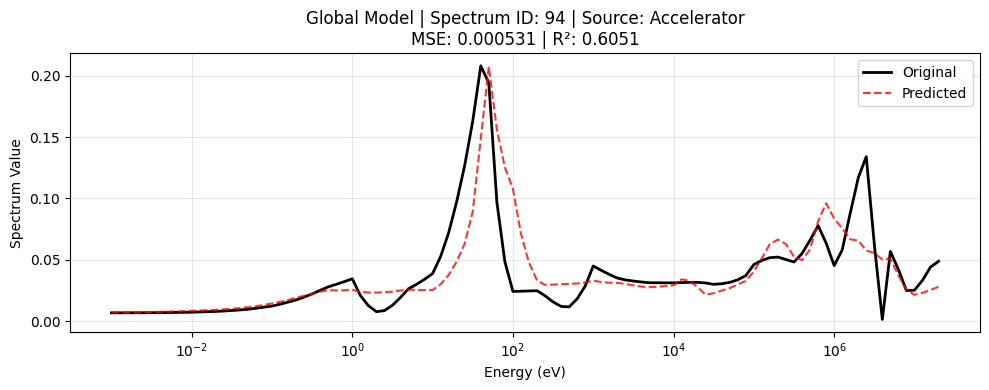

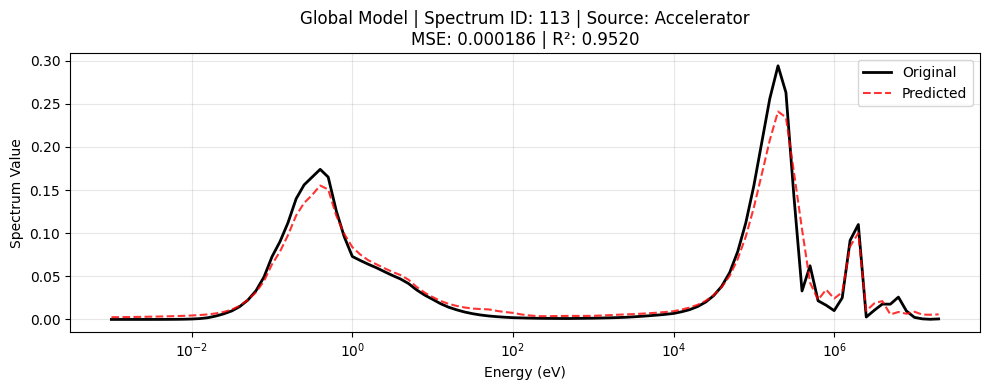

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- Load & preprocess dataset ---
df = pd.read_csv("/content/Dataset_with_spectrum_id.csv")

# Detect columns
spectrum_cols = [c for c in df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in df.columns if c.startswith("count_")]

df[spectrum_cols] = df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Encode Energy_Source (Power Reactor=0, Accelerator=1)
df["Energy_Source_Code"] = df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --- Define custom test spectrum IDs ---
test_ids = {21, 26, 41, 52, 25, 113, 94, 89, 85, 77}

# Split train/test (combined)
train_df = df[~df["spectrum_id"].isin(test_ids)].reset_index(drop=True)
test_df = df[df["spectrum_id"].isin(test_ids)].reset_index(drop=True)

print(f"Combined Train size: {len(train_df)}, Test size: {len(test_df)}")

# --- Train one model ---
X_train = train_df[count_cols + ["Energy_Source_Code"]]
y_train = train_df[spectrum_cols].values

X_test = test_df[count_cols + ["Energy_Source_Code"]]
y_test = test_df[spectrum_cols].values

model = ExtraTreesRegressor(
    n_estimators=1000,
    random_state=42,
    n_jobs=-1
)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# Global performance
mse = mean_squared_error(y_test, y_pred)
print(f"✅ Global Model | Mean Squared Error on Test Set: {mse:.6f}")

# --- Plot results ---
x = np.arange(len(spectrum_cols))
# --- Define energy bins (as given by you) ---
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

# --- In the plotting section, use energy_bins instead of np.arange ---
for idx in range(len(test_df)):
    spectrum_id = test_df.iloc[idx]["spectrum_id"]
    energy_source = test_df.iloc[idx]["Energy_Source"]
    mse_sample = mean_squared_error(y_test[idx], y_pred[idx])
    r2_sample = r2_score(y_test[idx], y_pred[idx])

    plt.figure(figsize=(10, 4))
    plt.semilogx(energy_bins, y_test[idx], label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred[idx], label="Predicted", color="red", linestyle="--", alpha=0.8)

    plt.title(f"Global Model | Spectrum ID: {spectrum_id} | Source: {energy_source}\nMSE: {mse_sample:.6f} | R²: {r2_sample:.4f}")
    plt.xlabel("Energy (eV)")
    plt.xscale("log")

    plt.ylabel("Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


# One Model with Augmnetation

Combined Train size: 103, Test size: 10
✅ After augmentation: Combined Train size: 1133
✅ Global Model | Mean Squared Error on Test Set: 0.000329


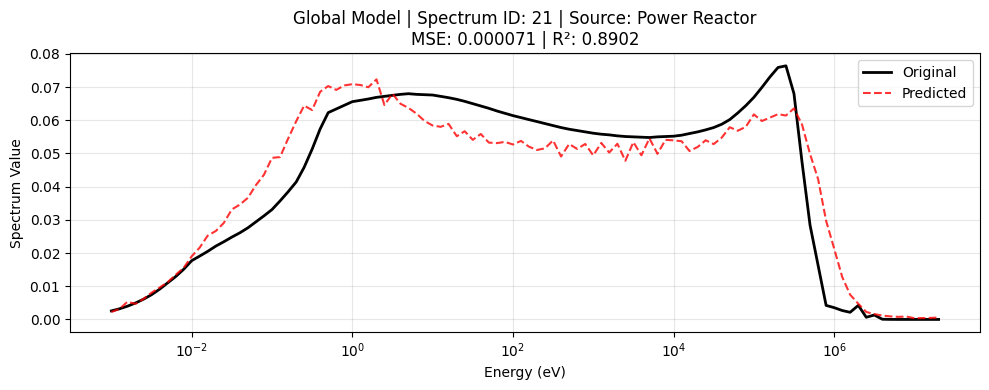

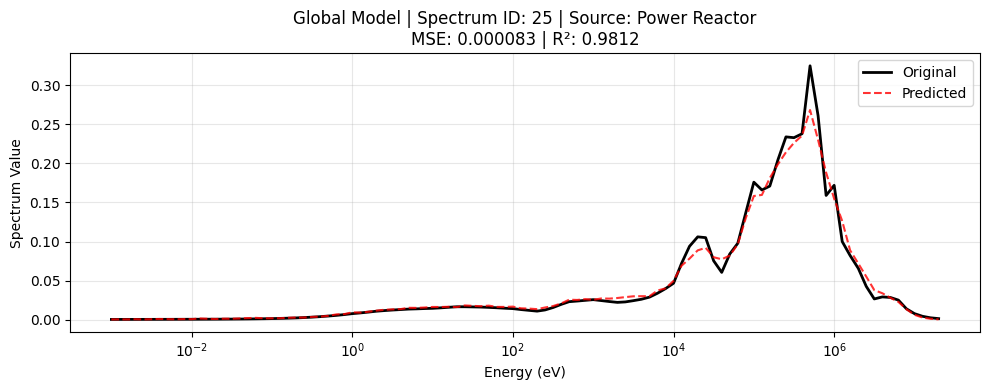

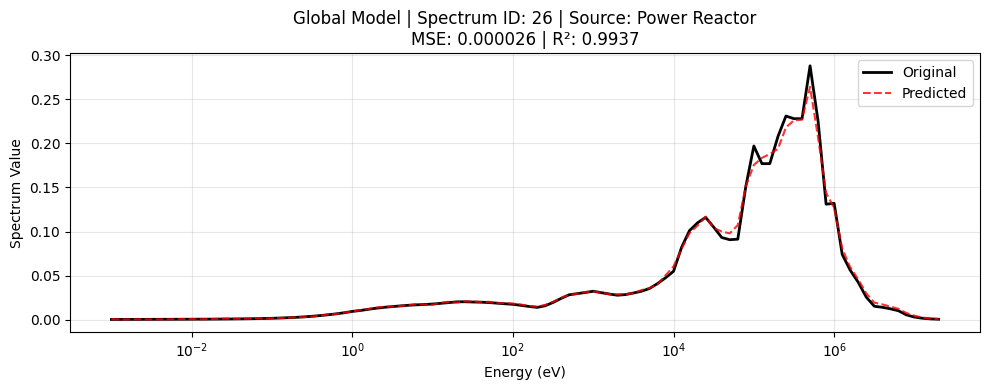

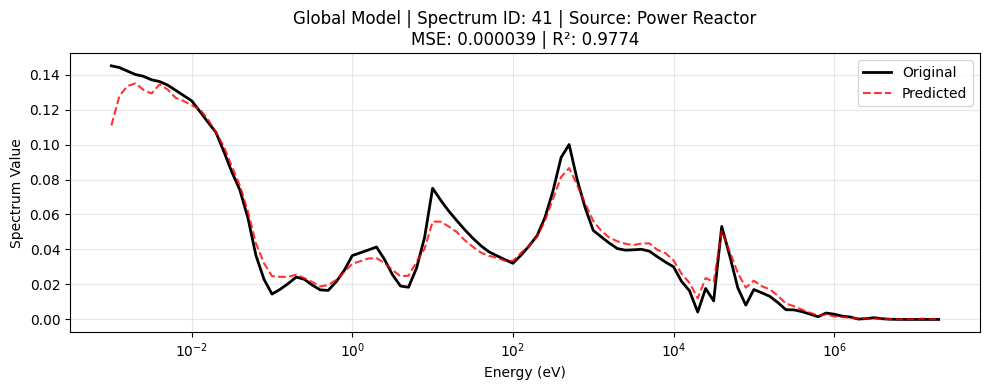

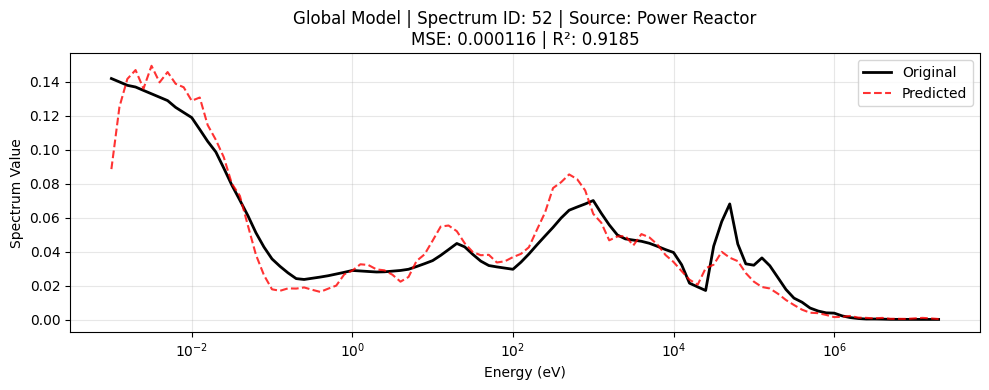

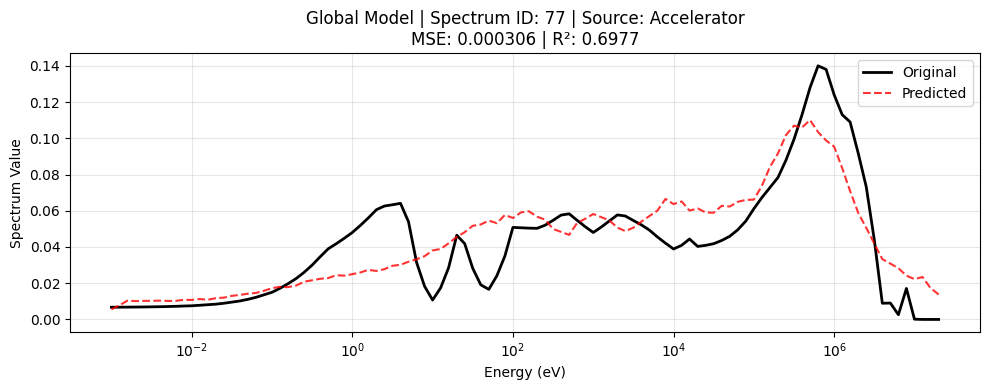

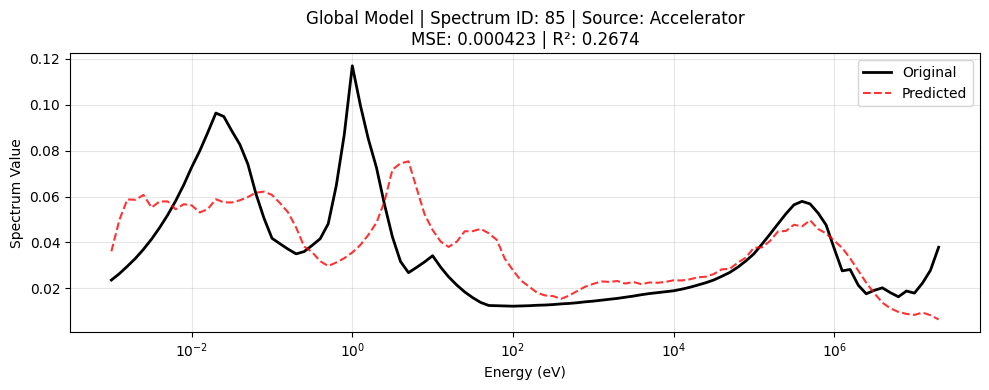

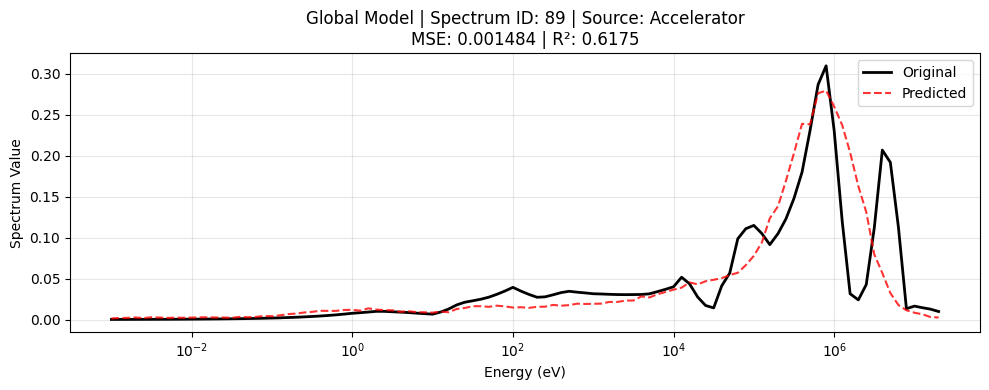

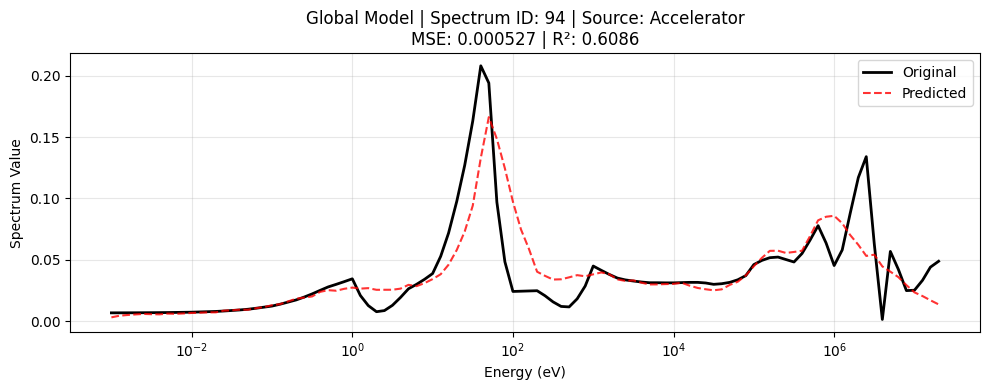

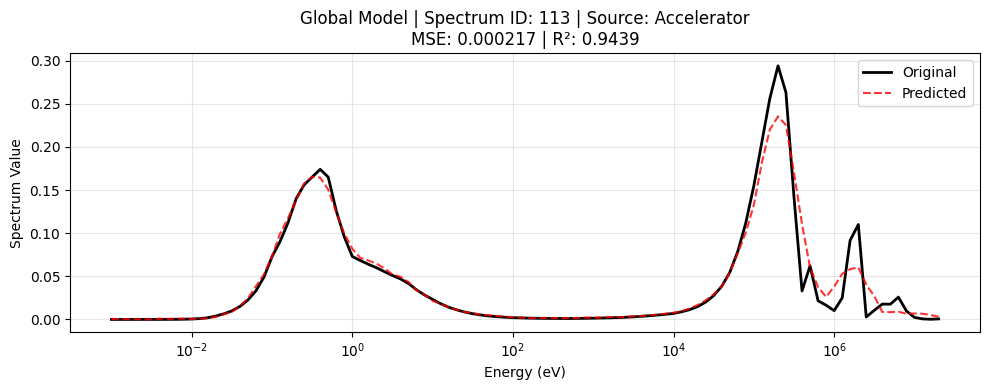

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# --- Load & preprocess dataset ---
df = pd.read_csv("/content/Dataset_with_spectrum_id.csv")

# Detect columns
spectrum_cols = [c for c in df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in df.columns if c.startswith("count_")]

df[spectrum_cols] = df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# --- Define custom test spectrum IDs ---
reactor_test_ids = {21, 26, 41, 52, 25}
accelerator_test_ids = {113, 94, 89, 85, 77}
test_ids = reactor_test_ids.union(accelerator_test_ids)

# --- Split global train/test ---
train_df = df[~df["spectrum_id"].isin(test_ids)].reset_index(drop=True)
test_df = df[df["spectrum_id"].isin(test_ids)].reset_index(drop=True)

print(f"Combined Train size: {len(train_df)}, Test size: {len(test_df)}")

# --- Encode Energy_Source as numeric feature ---
train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})
test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --- Load response matrix ---
response_matrix_df = pd.read_csv("/content/Response_Matrix.csv")
response_matrix = response_matrix_df.values  # shape: (n_bins, n_detectors)

# --- Augmentation functions ---
def add_gaussian_noise(spectrum, noise_level=0.1):
    noise = np.random.normal(loc=0, scale=noise_level * np.maximum(spectrum, 0.01), size=spectrum.shape)
    return np.clip(spectrum + noise, 0, None)

def multiplicative_noise(spectrum, scale_range=(0.95, 1.05)):
    return spectrum * np.random.uniform(*scale_range)

def smooth_spectrum(spectrum, window_size=5):
    kernel = np.ones(window_size) / window_size
    return np.convolve(spectrum, kernel, mode="same")

def random_peak_scaling(spectrum, prominence=0.05, scale_range=(0.8, 1.3)):
    peaks, _ = find_peaks(spectrum, prominence=prominence * np.max(spectrum))
    if len(peaks) == 0:
        return spectrum

    aug = spectrum.copy()
    n_peaks_to_modify = np.random.randint(1, min(len(peaks), 3) + 1)
    selected_peaks = np.random.choice(peaks, size=n_peaks_to_modify, replace=False)

    for p in selected_peaks:
        scale = np.random.uniform(*scale_range)
        aug[p] *= scale
        if p > 0: aug[p-1] *= (scale + 1)/2
        if p < len(aug)-1: aug[p+1] *= (scale + 1)/2

    return np.clip(aug, 0, None)

def augment_sequentially(spectrum):
    aug = random_peak_scaling(spectrum)
    aug = smooth_spectrum(aug)
    aug = multiplicative_noise(aug)
    aug = add_gaussian_noise(aug)
    return np.clip(aug, 0, None)

def augment_training_data(train_df, n_augments=3):
    augmented_rows = []
    for _, row in train_df.iterrows():
        spectrum = row[spectrum_cols].values.astype(float)
        for _ in range(n_augments):
            augmented_row = row.copy()

            # --- Augment spectrum ---
            new_spectrum = augment_sequentially(spectrum)
            augmented_row[spectrum_cols] = new_spectrum

            # --- Compute new counts from response matrix ---
            new_counts = new_spectrum @ response_matrix  # (104,) @ (104, n_detectors) -> (n_detectors,)
            for col, val in zip(count_cols, new_counts):
                augmented_row[col] = val

            augmented_rows.append(augmented_row)

    if augmented_rows:
        return pd.concat([train_df, pd.DataFrame(augmented_rows)], ignore_index=True)
    return train_df

# --- Apply augmentation ---
train_df = augment_training_data(train_df, n_augments=10)
print(f"✅ After augmentation: Combined Train size: {len(train_df)}")

# --- Train & Evaluate ---
X_train = train_df[count_cols + ["Energy_Source_Code"]]
y_train = train_df[spectrum_cols].values

X_test = test_df[count_cols + ["Energy_Source_Code"]]
y_test = test_df[spectrum_cols].values

model = ExtraTreesRegressor(
    n_estimators=1000,
    random_state=42,
    n_jobs=-1
)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print(f"✅ Global Model | Mean Squared Error on Test Set: {mse:.6f}")

# --- Define energy bins (for plotting) ---
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

# --- Plot results ---
for idx in range(len(test_df)):
    spectrum_id = test_df.iloc[idx]["spectrum_id"]
    energy_source = test_df.iloc[idx]["Energy_Source"]
    mse_sample = mean_squared_error(y_test[idx], y_pred[idx])
    r2_sample = r2_score(y_test[idx], y_pred[idx])

    plt.figure(figsize=(10, 4))
    plt.semilogx(energy_bins, y_test[idx], label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred[idx], label="Predicted", color="red", linestyle="--", alpha=0.8)

    plt.title(f"Global Model | Spectrum ID: {spectrum_id} | Source: {energy_source}\nMSE: {mse_sample:.6f} | R²: {r2_sample:.4f}")
    plt.xlabel("Energy (eV)")
    plt.xscale("log")
    plt.ylabel("Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


#All The Methods in One plot

/tmp/ipython-input-290904927.py:118: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["Energy_Source_Code"] = df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/loc

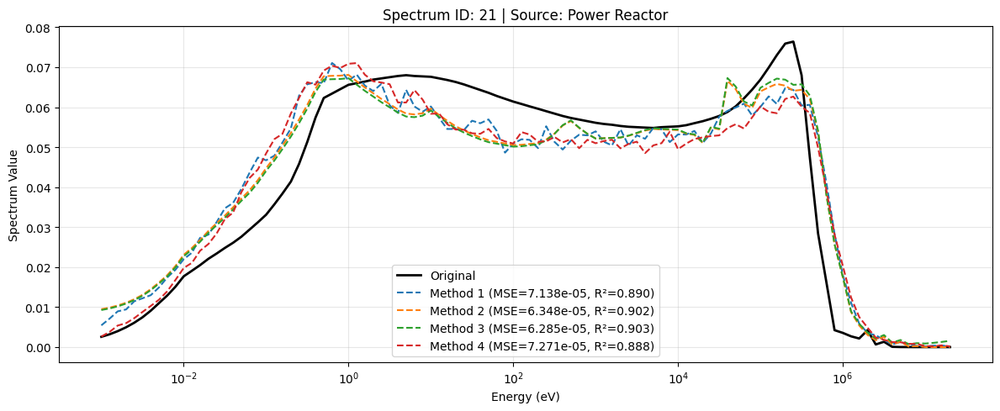

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


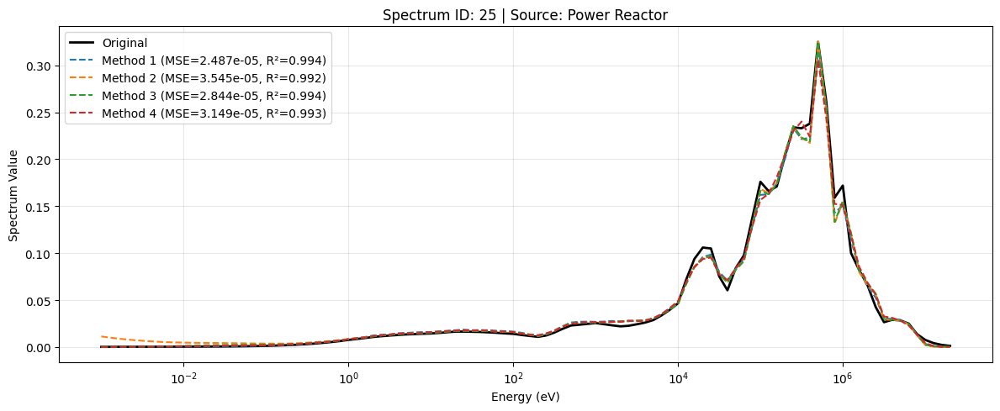

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


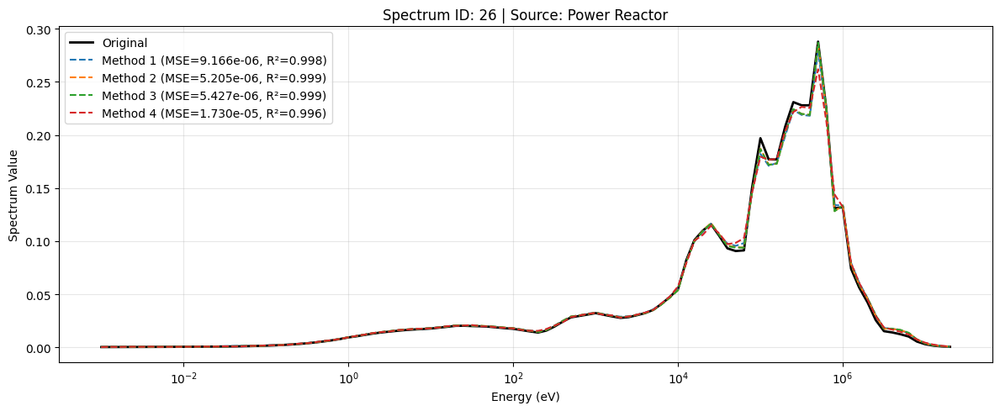

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


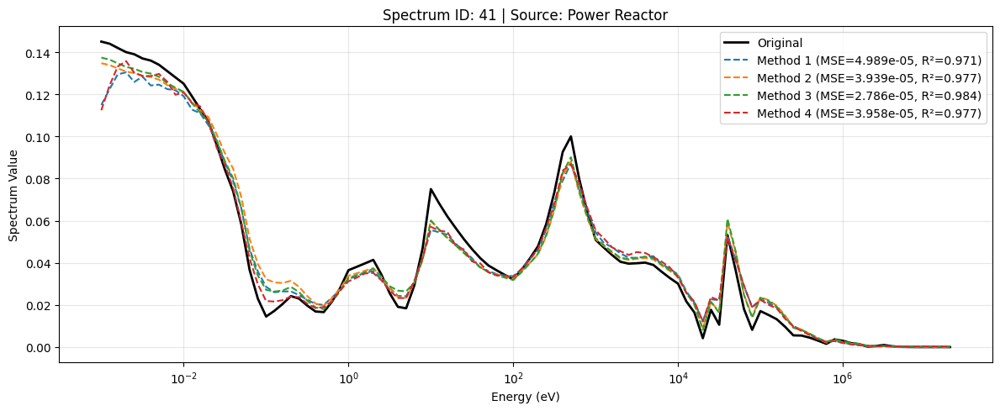

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


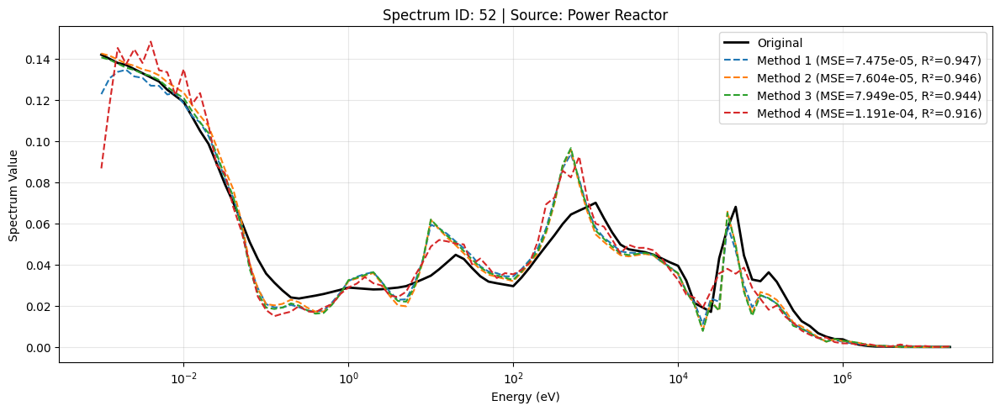

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


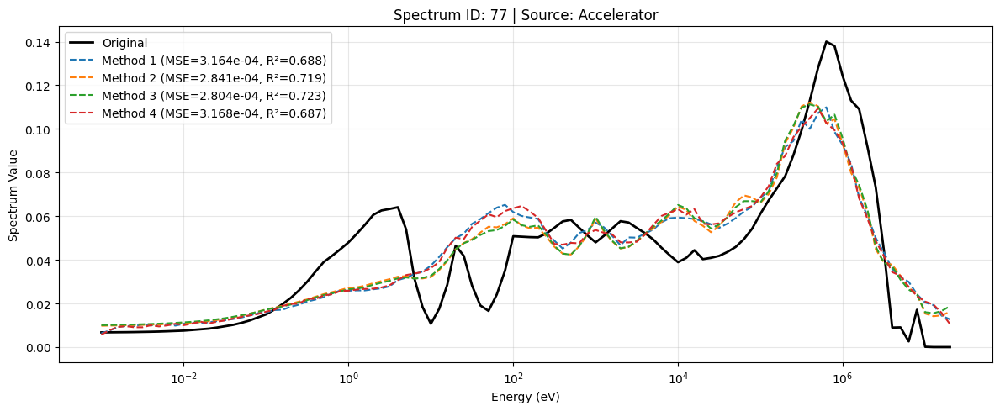

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


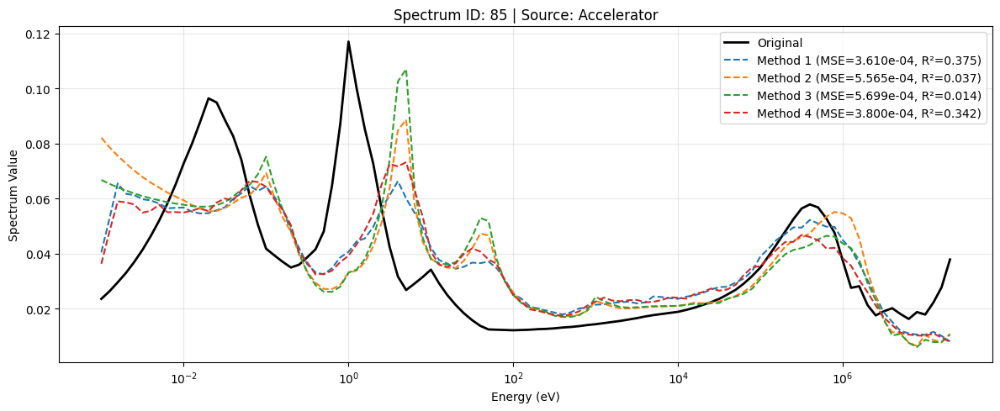

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


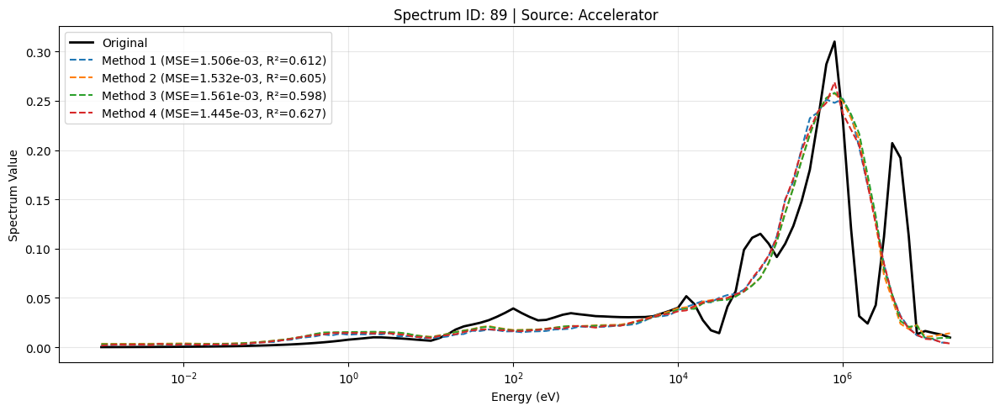

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


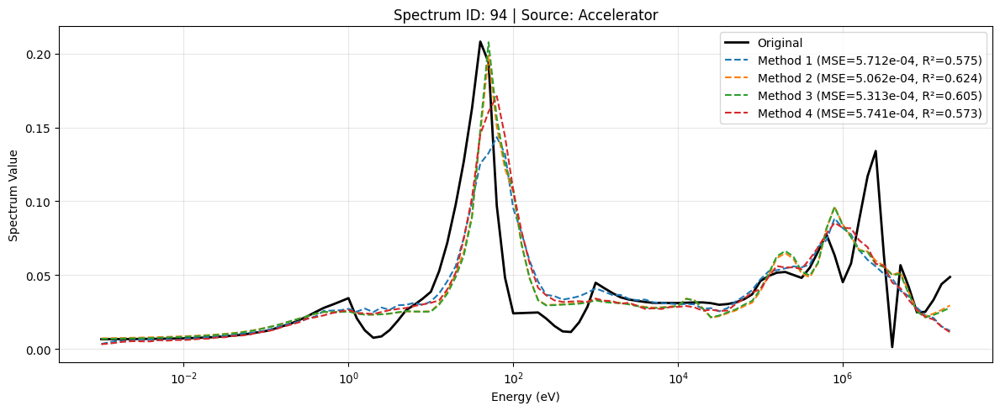

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


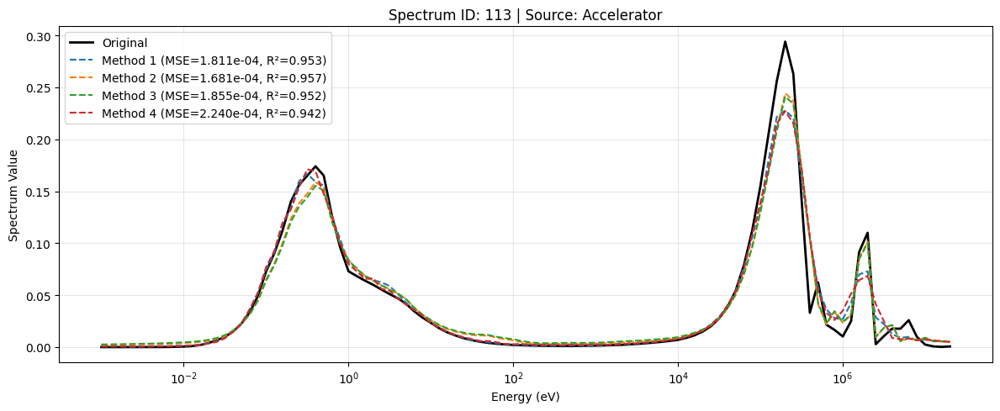

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
from scipy.signal import find_peaks

# --------------------------
# 1) LOAD DATA
# --------------------------
df = pd.read_csv("/content/Dataset_with_spectrum_id.csv")
spectrum_cols = [c for c in df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in df.columns if c.startswith("count_")]
df[spectrum_cols] = df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Load response matrix (used by methods with augmentation)
resp_df = pd.read_csv("/content/Response_Matrix.csv")
response_matrix = resp_df.select_dtypes(include=[np.number]).values
if response_matrix.shape[1] != len(spectrum_cols):
    response_matrix = response_matrix.T

# Test IDs
reactor_test_ids = {21, 26, 41, 52, 25}
accelerator_test_ids = {113, 94, 89, 85, 77}
test_ids = reactor_test_ids.union(accelerator_test_ids)

# Energy bins (for plotting)
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

# --------------------------
# 2) AUGMENTATION HELPERS (for methods 1 & 4)
# --------------------------
def add_gaussian_noise(spectrum, noise_level=0.1):
    noise = np.random.normal(0, noise_level * np.maximum(spectrum, 0.01), size=spectrum.shape)
    return np.clip(spectrum + noise, 0, None)

def multiplicative_noise(spectrum, scale_range=(0.95, 1.05)):
    return spectrum * np.random.uniform(*scale_range)

def smooth_spectrum(spectrum, window_size=5):
    kernel = np.ones(window_size) / window_size
    return np.convolve(spectrum, kernel, mode="same")

def random_peak_scaling(spectrum, prominence=0.05, scale_range=(0.8, 1.3)):
    peaks, _ = find_peaks(spectrum, prominence=prominence * np.max(spectrum))
    if len(peaks) == 0: return spectrum
    aug = spectrum.copy()
    selected_peaks = np.random.choice(peaks, size=np.random.randint(1, min(len(peaks), 3)+1), replace=False)
    for p in selected_peaks:
        scale = np.random.uniform(*scale_range)
        aug[p] *= scale
        if p > 0: aug[p-1] *= (scale+1)/2
        if p < len(aug)-1: aug[p+1] *= (scale+1)/2
    return np.clip(aug, 0, None)

def augment_sequentially(spectrum):
    aug = random_peak_scaling(spectrum)
    aug = smooth_spectrum(aug)
    aug = multiplicative_noise(aug)
    aug = add_gaussian_noise(aug)
    return np.clip(aug, 0, None)

def augment_training_data(train_df, n_augments=3):
    augmented_rows = []
    for _, row in train_df.iterrows():
        spectrum = row[spectrum_cols].values.astype(float)
        for _ in range(n_augments):
            augmented_row = row.copy()
            new_spectrum = augment_sequentially(spectrum)
            augmented_row[spectrum_cols] = new_spectrum
            new_counts = response_matrix @ new_spectrum
            augmented_row[count_cols] = new_counts
            augmented_rows.append(augmented_row)
    return pd.concat([train_df, pd.DataFrame(augmented_rows)], ignore_index=True)

# --------------------------
# 3) TRAIN MODELS FOR 4 METHODS
# --------------------------
# Method 1: separate reactor/accelerator + augmentation
reactor_df = df[df["Energy_Source"] == "Power Reactor"]
reactor_train = augment_training_data(reactor_df[~reactor_df["spectrum_id"].isin(reactor_test_ids)], n_augments=2)
reactor_test = reactor_df[reactor_df["spectrum_id"].isin(reactor_test_ids)]

accelerator_df = df[df["Energy_Source"] == "Accelerator"]
accelerator_train = augment_training_data(accelerator_df[~accelerator_df["spectrum_id"].isin(accelerator_test_ids)], n_augments=10)
accelerator_test = accelerator_df[accelerator_df["spectrum_id"].isin(accelerator_test_ids)]

model1_reactor = ExtraTreesRegressor(n_estimators=1000, random_state=42, n_jobs=-1).fit(
    reactor_train[count_cols], reactor_train[spectrum_cols]
)
model1_acc = ExtraTreesRegressor(n_estimators=1000, random_state=42, n_jobs=-1).fit(
    accelerator_train[count_cols], accelerator_train[spectrum_cols]
)

# Method 2: separate reactor/accelerator no augmentation
model2_reactor = ExtraTreesRegressor(n_estimators=1000, random_state=42, n_jobs=-1).fit(
    reactor_df[~reactor_df["spectrum_id"].isin(reactor_test_ids)][count_cols],
    reactor_df[~reactor_df["spectrum_id"].isin(reactor_test_ids)][spectrum_cols]
)
model2_acc = ExtraTreesRegressor(n_estimators=1000, random_state=42, n_jobs=-1).fit(
    accelerator_df[~accelerator_df["spectrum_id"].isin(accelerator_test_ids)][count_cols],
    accelerator_df[~accelerator_df["spectrum_id"].isin(accelerator_test_ids)][spectrum_cols]
)

# Method 3: combined dataset + Energy_Source_Code (no augmentation)
df["Energy_Source_Code"] = df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})
train_df = df[~df["spectrum_id"].isin(test_ids)]
test_df = df[df["spectrum_id"].isin(test_ids)]
model3 = ExtraTreesRegressor(n_estimators=1000, random_state=42, n_jobs=-1).fit(
    train_df[count_cols+["Energy_Source_Code"]], train_df[spectrum_cols]
)

# Method 4: combined + augmentation + Energy_Source_Code
train_aug = augment_training_data(train_df, n_augments=10)
model4 = ExtraTreesRegressor(n_estimators=1000, random_state=42, n_jobs=-1).fit(
    train_aug[count_cols+["Energy_Source_Code"]], train_aug[spectrum_cols]
)

# --------------------------
# 4) PREDICT + PLOT
# --------------------------
for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    x_test_with_source = np.append(x_test, row["Energy_Source_Code"]).reshape(1, -1)

    y_true = row[spectrum_cols].values
    y_pred1 = (model1_reactor if row["Energy_Source"]=="Power Reactor" else model1_acc).predict(x_test)[0]
    y_pred2 = (model2_reactor if row["Energy_Source"]=="Power Reactor" else model2_acc).predict(x_test)[0]
    y_pred3 = model3.predict(x_test_with_source)[0]
    y_pred4 = model4.predict(x_test_with_source)[0]

    mse_vals = [mean_squared_error(y_true, y_pred1),
                mean_squared_error(y_true, y_pred2),
                mean_squared_error(y_true, y_pred3),
                mean_squared_error(y_true, y_pred4)]
    r2_vals = [r2_score(y_true, y_pred1),
               r2_score(y_true, y_pred2),
               r2_score(y_true, y_pred3),
               r2_score(y_true, y_pred4)]

    plt.figure(figsize=(12,5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred1, label=f"Method 1 (MSE={mse_vals[0]:.3e}, R²={r2_vals[0]:.3f})",linestyle="--")
    plt.semilogx(energy_bins, y_pred2, label=f"Method 2 (MSE={mse_vals[1]:.3e}, R²={r2_vals[1]:.3f})",linestyle="--")
    plt.semilogx(energy_bins, y_pred3, label=f"Method 3 (MSE={mse_vals[2]:.3e}, R²={r2_vals[2]:.3f})",linestyle="--")
    plt.semilogx(energy_bins, y_pred4, label=f"Method 4 (MSE={mse_vals[3]:.3e}, R²={r2_vals[3]:.3f})",linestyle="--")

    plt.title(f"Spectrum ID: {row['spectrum_id']} | Source: {row['Energy_Source']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


#Normalization Per Sample

/tmp/ipython-input-3821272593.py:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


Training on entire dataset: 113 samples
✅ Model trained on entire dataset.
Testing on external dataset: 2 samples


/tmp/ipython-input-3821272593.py:48: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


✅ External Test Set | Mean Squared Error: 15470076303.028212


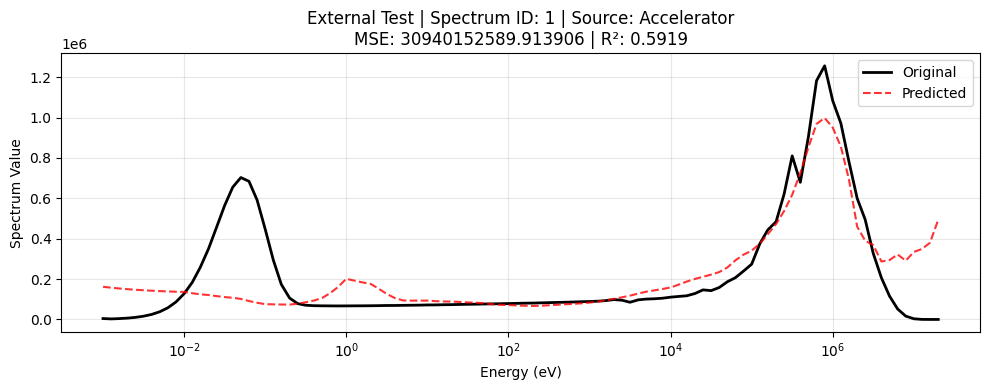

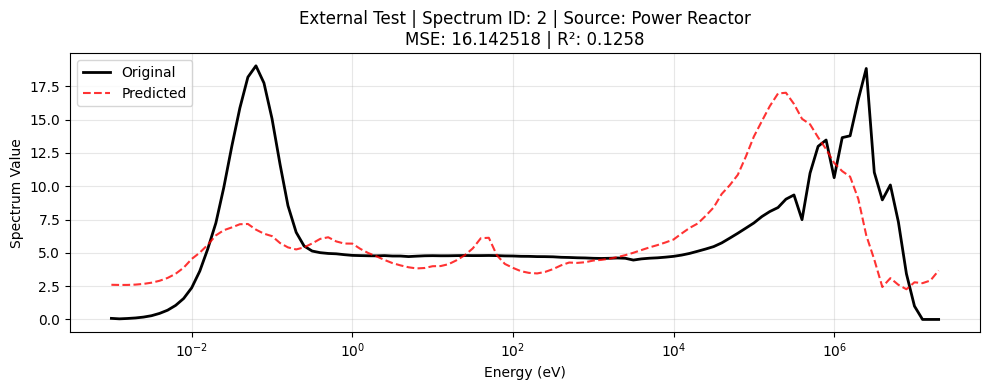

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- Load & preprocess training dataset ---
train_df = pd.read_csv("/content/Dataset_with_spectrum_id.csv")

# Detect columns
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]

train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")
train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

print(f"Training on entire dataset: {len(train_df)} samples")

# --- Extract raw counts and spectrum ---
X_train_raw = train_df[count_cols].values
y_train_raw = train_df[spectrum_cols].values

# Compute per-sample totals (for normalization)
train_counts_total = X_train_raw.sum(axis=1, keepdims=True)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = y_train_raw.sum(axis=1, keepdims=True)
train_spectrum_total[train_spectrum_total == 0] = 1

# Normalize
X_train_norm = X_train_raw / train_counts_total
y_train_norm = y_train_raw / train_spectrum_total

X_train = np.hstack([X_train_norm, train_df[["Energy_Source_Code"]].values])

# --- Train model ---
model = ExtraTreesRegressor(
    n_estimators=1000,
    random_state=42,
    n_jobs=-1
)
model.fit(X_train, y_train_norm)

print("✅ Model trained on entire dataset.")

# --- Load external test dataset ---
test_df = pd.read_csv("/content/Test_Dataset.csv")  # change path to your test file
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")
test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

print(f"Testing on external dataset: {len(test_df)} samples")

X_test_raw = test_df[count_cols].values
y_test_raw = test_df[spectrum_cols].values

# Compute per-sample totals for test
test_counts_total = X_test_raw.sum(axis=1, keepdims=True)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = y_test_raw.sum(axis=1, keepdims=True)
test_spectrum_total[test_spectrum_total == 0] = 1

# Normalize
X_test_norm = X_test_raw / test_counts_total
y_test_norm = y_test_raw / test_spectrum_total

X_test = np.hstack([X_test_norm, test_df[["Energy_Source_Code"]].values])

# --- Predict and denormalize ---
y_pred_norm = model.predict(X_test)
y_pred = y_pred_norm * test_spectrum_total

# --- Global performance ---
mse = mean_squared_error(y_test_raw, y_pred)
print(f"✅ External Test Set | Mean Squared Error: {mse:.6f}")

# --- Plot results ---
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx in range(len(test_df)):
    spectrum_id = test_df.iloc[idx]["spectrum_id"]
    energy_source = test_df.iloc[idx]["Energy_Source"]
    mse_sample = mean_squared_error(y_test_raw[idx], y_pred[idx])
    r2_sample = r2_score(y_test_raw[idx], y_pred[idx])

    plt.figure(figsize=(10, 4))
    plt.semilogx(energy_bins, y_test_raw[idx], label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred[idx], label="Predicted", color="red", linestyle="--", alpha=0.8)

    plt.title(f"External Test | Spectrum ID: {spectrum_id} | Source: {energy_source}\nMSE: {mse_sample:.6f} | R²: {r2_sample:.4f}")
    plt.xlabel("Energy (eV)")
    plt.xscale("log")
    plt.ylabel("Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-1792071066.py:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


✅ All 4 models trained successfully on normalized data.


/tmp/ipython-input-1792071066.py:130: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.war

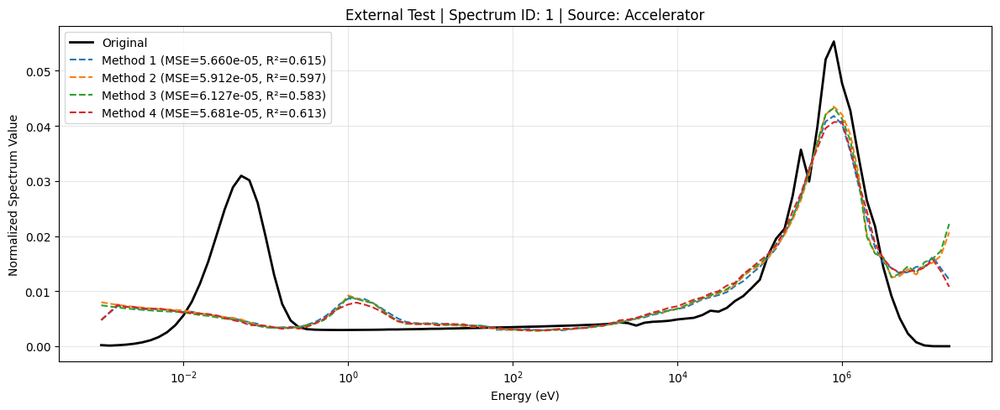

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


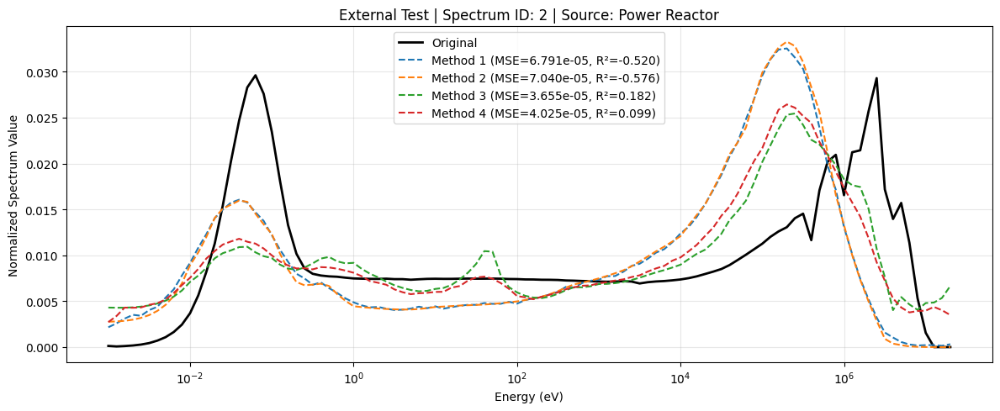

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
from scipy.signal import find_peaks

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/Dataset_with_spectrum_id.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Response matrix for augmentation
resp_df = pd.read_csv("/content/Response_Matrix.csv")
response_matrix = resp_df.select_dtypes(include=[np.number]).values
if response_matrix.shape[1] != len(spectrum_cols):
    response_matrix = response_matrix.T

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --------------------------
# 2) DATA AUGMENTATION
# --------------------------
def add_gaussian_noise(spectrum, noise_level=0.05):
    noise = np.random.normal(0, noise_level * np.maximum(spectrum, 0.01), size=spectrum.shape)
    return np.clip(spectrum + noise, 0, None)

def multiplicative_noise(spectrum, scale_range=(0.95, 1.05)):
    return spectrum * np.random.uniform(*scale_range)

def smooth_spectrum(spectrum, window_size=5):
    kernel = np.ones(window_size) / window_size
    return np.convolve(spectrum, kernel, mode="same")

def random_peak_scaling(spectrum, prominence=0.05, scale_range=(0.8, 1.3)):
    peaks, _ = find_peaks(spectrum, prominence=prominence * np.max(spectrum))
    if len(peaks) == 0: return spectrum
    aug = spectrum.copy()
    selected_peaks = np.random.choice(peaks, size=np.random.randint(1, min(len(peaks), 3)+1), replace=False)
    for p in selected_peaks:
        scale = np.random.uniform(*scale_range)
        aug[p] *= scale
        if p > 0: aug[p-1] *= (scale+1)/2
        if p < len(aug)-1: aug[p+1] *= (scale+1)/2
    return np.clip(aug, 0, None)

def augment_sequentially(spectrum):
    aug = random_peak_scaling(spectrum)
    aug = smooth_spectrum(aug)
    aug = multiplicative_noise(aug)
    aug = add_gaussian_noise(aug)
    return np.clip(aug, 0, None)

def augment_training_data(train_df, n_augments=3):
    augmented_rows = []
    for _, row in train_df.iterrows():
        spectrum = row[spectrum_cols].values.astype(float)
        for _ in range(n_augments):
            augmented_row = row.copy()
            new_spectrum = augment_sequentially(spectrum)
            augmented_row[spectrum_cols] = new_spectrum
            new_counts = response_matrix @ new_spectrum
            new_counts /= new_counts.sum() if new_counts.sum() != 0 else 1
            augmented_row[count_cols] = new_counts
            augmented_rows.append(augmented_row)
    return pd.concat([train_df, pd.DataFrame(augmented_rows)], ignore_index=True)

# --------------------------
# 3) TRAIN MODELS (4 METHODS)
# --------------------------
reactor_df = train_df[train_df["Energy_Source"] == "Power Reactor"]
accelerator_df = train_df[train_df["Energy_Source"] == "Accelerator"]

# Method 1 (Separate + Augmentation)
reactor_train_aug = augment_training_data(reactor_df, n_augments=2)
accelerator_train_aug = augment_training_data(accelerator_df, n_augments=10)
model1_reactor = ExtraTreesRegressor(n_estimators=500, random_state=42, n_jobs=-1).fit(
    reactor_train_aug[count_cols], reactor_train_aug[spectrum_cols]
)
model1_acc = ExtraTreesRegressor(n_estimators=500, random_state=42, n_jobs=-1).fit(
    accelerator_train_aug[count_cols], accelerator_train_aug[spectrum_cols]
)

# Method 2 (Separate, No Augmentation)
model2_reactor = ExtraTreesRegressor(n_estimators=500, random_state=42, n_jobs=-1).fit(
    reactor_df[count_cols], reactor_df[spectrum_cols]
)
model2_acc = ExtraTreesRegressor(n_estimators=500, random_state=42, n_jobs=-1).fit(
    accelerator_df[count_cols], accelerator_df[spectrum_cols]
)

# Method 3 (Combined, No Augmentation)
model3 = ExtraTreesRegressor(n_estimators=500, random_state=42, n_jobs=-1).fit(
    train_df[count_cols+["Energy_Source_Code"]], train_df[spectrum_cols]
)

# Method 4 (Combined + Augmentation)
train_aug = augment_training_data(train_df, n_augments=5)
model4 = ExtraTreesRegressor(n_estimators=500, random_state=42, n_jobs=-1).fit(
    train_aug[count_cols+["Energy_Source_Code"]], train_aug[spectrum_cols]
)

print("✅ All 4 models trained successfully on normalized data.")

# --------------------------
# 4) LOAD TEST DATA (EXTERNAL CSV) + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)
test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --------------------------
# 5) PREDICT + PLOT
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    x_test_with_source = np.append(x_test, row["Energy_Source_Code"]).reshape(1, -1)
    y_true = row[spectrum_cols].values

    y_pred1 = (model1_reactor if row["Energy_Source"]=="Power Reactor" else model1_acc).predict(x_test)[0]
    y_pred2 = (model2_reactor if row["Energy_Source"]=="Power Reactor" else model2_acc).predict(x_test)[0]
    y_pred3 = model3.predict(x_test_with_source)[0]
    y_pred4 = model4.predict(x_test_with_source)[0]

    mse_vals = [mean_squared_error(y_true, y_pred1),
                mean_squared_error(y_true, y_pred2),
                mean_squared_error(y_true, y_pred3),
                mean_squared_error(y_true, y_pred4)]
    r2_vals = [r2_score(y_true, y_pred1),
               r2_score(y_true, y_pred2),
               r2_score(y_true, y_pred3),
               r2_score(y_true, y_pred4)]

    plt.figure(figsize=(12,5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred1, label=f"Method 1 (MSE={mse_vals[0]:.3e}, R²={r2_vals[0]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred2, label=f"Method 2 (MSE={mse_vals[1]:.3e}, R²={r2_vals[1]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred3, label=f"Method 3 (MSE={mse_vals[2]:.3e}, R²={r2_vals[2]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred4, label=f"Method 4 (MSE={mse_vals[3]:.3e}, R²={r2_vals[3]:.3f})", linestyle="--")

    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']} | Source: {row['Energy_Source']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


#Euradose Test

/tmp/ipython-input-4107196485.py:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


✅ All 4 XGBoost-based models trained successfully.


/tmp/ipython-input-4107196485.py:133: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


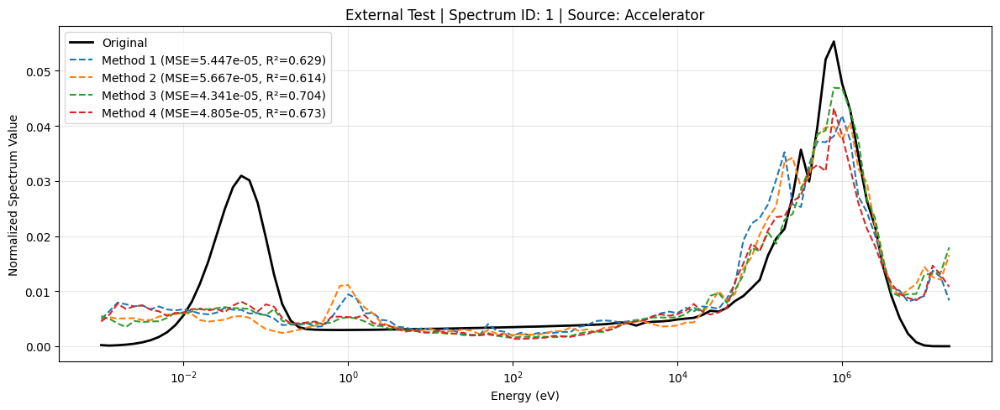

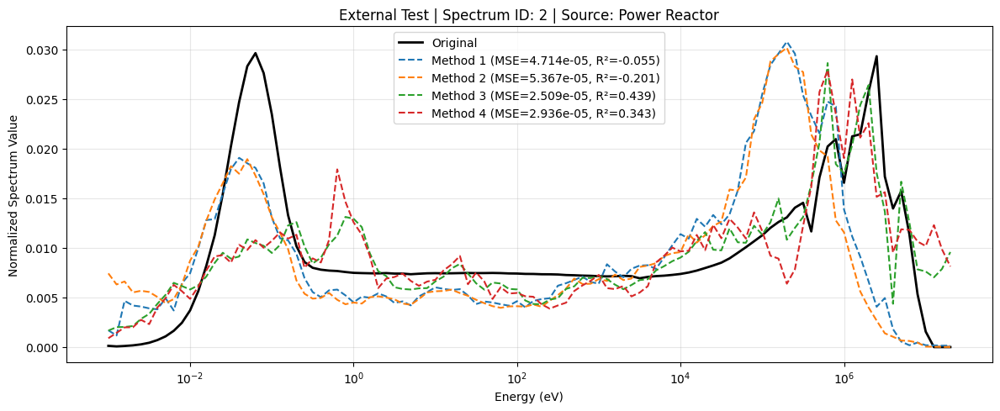

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
from scipy.signal import find_peaks

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/Dataset_with_spectrum_id.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Response matrix for augmentation
resp_df = pd.read_csv("/content/Response_Matrix.csv")
response_matrix = resp_df.select_dtypes(include=[np.number]).values
if response_matrix.shape[1] != len(spectrum_cols):
    response_matrix = response_matrix.T

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --------------------------
# 2) DATA AUGMENTATION
# --------------------------
def add_gaussian_noise(spectrum, noise_level=0.05):
    noise = np.random.normal(0, noise_level * np.maximum(spectrum, 0.01), size=spectrum.shape)
    return np.clip(spectrum + noise, 0, None)

def multiplicative_noise(spectrum, scale_range=(0.95, 1.05)):
    return spectrum * np.random.uniform(*scale_range)

def smooth_spectrum(spectrum, window_size=5):
    kernel = np.ones(window_size) / window_size
    return np.convolve(spectrum, kernel, mode="same")

def random_peak_scaling(spectrum, prominence=0.05, scale_range=(0.8, 1.3)):
    peaks, _ = find_peaks(spectrum, prominence=prominence * np.max(spectrum))
    if len(peaks) == 0: return spectrum
    aug = spectrum.copy()
    selected_peaks = np.random.choice(peaks, size=np.random.randint(1, min(len(peaks), 3)+1), replace=False)
    for p in selected_peaks:
        scale = np.random.uniform(*scale_range)
        aug[p] *= scale
        if p > 0: aug[p-1] *= (scale+1)/2
        if p < len(aug)-1: aug[p+1] *= (scale+1)/2
    return np.clip(aug, 0, None)

def augment_sequentially(spectrum):
    aug = random_peak_scaling(spectrum)
    aug = smooth_spectrum(aug)
    aug = multiplicative_noise(aug)
    aug = add_gaussian_noise(aug)
    return np.clip(aug, 0, None)

def augment_training_data(train_df, n_augments=3):
    augmented_rows = []
    for _, row in train_df.iterrows():
        spectrum = row[spectrum_cols].values.astype(float)
        for _ in range(n_augments):
            augmented_row = row.copy()
            new_spectrum = augment_sequentially(spectrum)
            augmented_row[spectrum_cols] = new_spectrum
            new_counts = response_matrix @ new_spectrum
            new_counts /= new_counts.sum() if new_counts.sum() != 0 else 1
            augmented_row[count_cols] = new_counts
            augmented_rows.append(augmented_row)
    return pd.concat([train_df, pd.DataFrame(augmented_rows)], ignore_index=True)

# --------------------------
# 3) TRAIN MODELS (4 METHODS) - Using XGBoost
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, tree_method="hist", n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

reactor_df = train_df[train_df["Energy_Source"] == "Power Reactor"]
accelerator_df = train_df[train_df["Energy_Source"] == "Accelerator"]

# Method 1 (Separate + Augmentation)
reactor_train_aug = augment_training_data(reactor_df, n_augments=2)
accelerator_train_aug = augment_training_data(accelerator_df, n_augments=10)
model1_reactor = train_xgb_multioutput(reactor_train_aug[count_cols].values, reactor_train_aug[spectrum_cols].values)
model1_acc = train_xgb_multioutput(accelerator_train_aug[count_cols].values, accelerator_train_aug[spectrum_cols].values)

# Method 2 (Separate, No Augmentation)
model2_reactor = train_xgb_multioutput(reactor_df[count_cols].values, reactor_df[spectrum_cols].values)
model2_acc = train_xgb_multioutput(accelerator_df[count_cols].values, accelerator_df[spectrum_cols].values)

# Method 3 (Combined, No Augmentation)
model3 = train_xgb_multioutput(train_df[count_cols+["Energy_Source_Code"]].values, train_df[spectrum_cols].values)

# Method 4 (Combined + Augmentation)
train_aug = augment_training_data(train_df, n_augments=5)
model4 = train_xgb_multioutput(train_aug[count_cols+["Energy_Source_Code"]].values, train_aug[spectrum_cols].values)

print("✅ All 4 XGBoost-based models trained successfully.")

# --------------------------
# 4) LOAD TEST DATA + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)
test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --------------------------
# 5) PREDICT + PLOT
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    x_test_with_source = np.append(x_test, row["Energy_Source_Code"]).reshape(1, -1)
    y_true = row[spectrum_cols].values

    y_pred1 = predict_xgb_multioutput(model1_reactor if row["Energy_Source"]=="Power Reactor" else model1_acc, x_test)[0]
    y_pred2 = predict_xgb_multioutput(model2_reactor if row["Energy_Source"]=="Power Reactor" else model2_acc, x_test)[0]
    y_pred3 = predict_xgb_multioutput(model3, x_test_with_source)[0]
    y_pred4 = predict_xgb_multioutput(model4, x_test_with_source)[0]

    mse_vals = [mean_squared_error(y_true, y_pred1),
                mean_squared_error(y_true, y_pred2),
                mean_squared_error(y_true, y_pred3),
                mean_squared_error(y_true, y_pred4)]
    r2_vals = [r2_score(y_true, y_pred1),
               r2_score(y_true, y_pred2),
               r2_score(y_true, y_pred3),
               r2_score(y_true, y_pred4)]

    plt.figure(figsize=(12,5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred1, label=f"Method 1 (MSE={mse_vals[0]:.3e}, R²={r2_vals[0]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred2, label=f"Method 2 (MSE={mse_vals[1]:.3e}, R²={r2_vals[1]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred3, label=f"Method 3 (MSE={mse_vals[2]:.3e}, R²={r2_vals[2]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred4, label=f"Method 4 (MSE={mse_vals[3]:.3e}, R²={r2_vals[3]:.3f})", linestyle="--")

    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']} | Source: {row['Energy_Source']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


#Testing With the new dataset

/tmp/ipython-input-358518384.py:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


✅ All 4 XGBoost-based models trained successfully.


/tmp/ipython-input-358518384.py:133: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


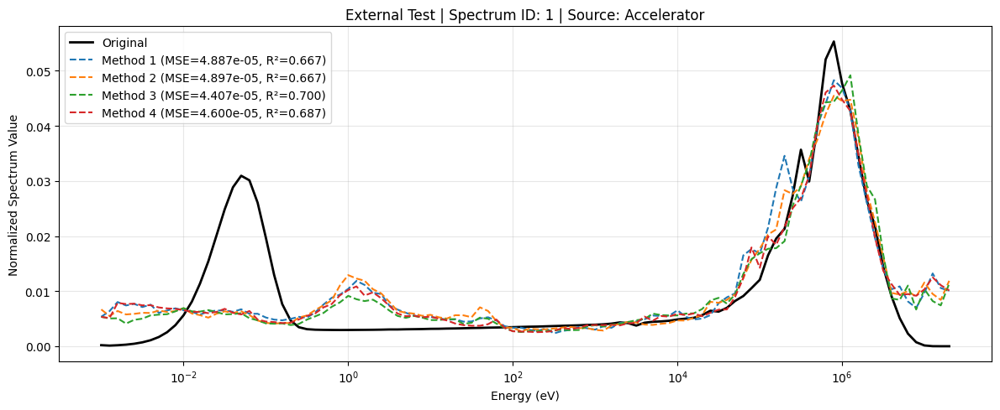

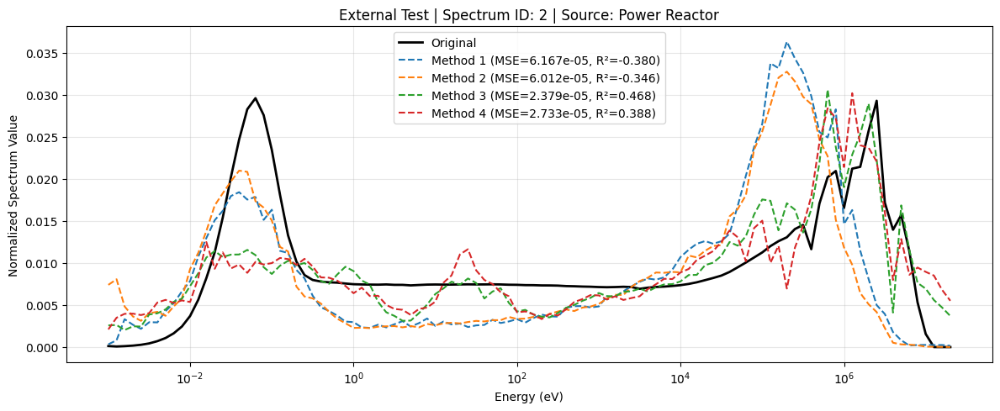

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
from scipy.signal import find_peaks

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/Dataset_modified.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Response matrix for augmentation
resp_df = pd.read_csv("/content/response_matrix_modified.csv")
response_matrix = resp_df.select_dtypes(include=[np.number]).values
if response_matrix.shape[1] != len(spectrum_cols):
    response_matrix = response_matrix.T

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --------------------------
# 2) DATA AUGMENTATION
# --------------------------
def add_gaussian_noise(spectrum, noise_level=0.05):
    noise = np.random.normal(0, noise_level * np.maximum(spectrum, 0.01), size=spectrum.shape)
    return np.clip(spectrum + noise, 0, None)

def multiplicative_noise(spectrum, scale_range=(0.95, 1.05)):
    return spectrum * np.random.uniform(*scale_range)

def smooth_spectrum(spectrum, window_size=5):
    kernel = np.ones(window_size) / window_size
    return np.convolve(spectrum, kernel, mode="same")

def random_peak_scaling(spectrum, prominence=0.05, scale_range=(0.8, 1.3)):
    peaks, _ = find_peaks(spectrum, prominence=prominence * np.max(spectrum))
    if len(peaks) == 0: return spectrum
    aug = spectrum.copy()
    selected_peaks = np.random.choice(peaks, size=np.random.randint(1, min(len(peaks), 3)+1), replace=False)
    for p in selected_peaks:
        scale = np.random.uniform(*scale_range)
        aug[p] *= scale
        if p > 0: aug[p-1] *= (scale+1)/2
        if p < len(aug)-1: aug[p+1] *= (scale+1)/2
    return np.clip(aug, 0, None)

def augment_sequentially(spectrum):
    aug = random_peak_scaling(spectrum)
    aug = smooth_spectrum(aug)
    aug = multiplicative_noise(aug)
    aug = add_gaussian_noise(aug)
    return np.clip(aug, 0, None)

def augment_training_data(train_df, n_augments=3):
    augmented_rows = []
    for _, row in train_df.iterrows():
        spectrum = row[spectrum_cols].values.astype(float)
        for _ in range(n_augments):
            augmented_row = row.copy()
            new_spectrum = augment_sequentially(spectrum)
            augmented_row[spectrum_cols] = new_spectrum
            new_counts = response_matrix @ new_spectrum
            new_counts /= new_counts.sum() if new_counts.sum() != 0 else 1
            augmented_row[count_cols] = new_counts
            augmented_rows.append(augmented_row)
    return pd.concat([train_df, pd.DataFrame(augmented_rows)], ignore_index=True)

# --------------------------
# 3) TRAIN MODELS (4 METHODS) - Using XGBoost
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, tree_method="hist", n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

reactor_df = train_df[train_df["Energy_Source"] == "Power Reactor"]
accelerator_df = train_df[train_df["Energy_Source"] == "Accelerator"]

# Method 1 (Separate + Augmentation)
reactor_train_aug = augment_training_data(reactor_df, n_augments=2)
accelerator_train_aug = augment_training_data(accelerator_df, n_augments=10)
model1_reactor = train_xgb_multioutput(reactor_train_aug[count_cols].values, reactor_train_aug[spectrum_cols].values)
model1_acc = train_xgb_multioutput(accelerator_train_aug[count_cols].values, accelerator_train_aug[spectrum_cols].values)

# Method 2 (Separate, No Augmentation)
model2_reactor = train_xgb_multioutput(reactor_df[count_cols].values, reactor_df[spectrum_cols].values)
model2_acc = train_xgb_multioutput(accelerator_df[count_cols].values, accelerator_df[spectrum_cols].values)

# Method 3 (Combined, No Augmentation)
model3 = train_xgb_multioutput(train_df[count_cols+["Energy_Source_Code"]].values, train_df[spectrum_cols].values)

# Method 4 (Combined + Augmentation)
train_aug = augment_training_data(train_df, n_augments=5)
model4 = train_xgb_multioutput(train_aug[count_cols+["Energy_Source_Code"]].values, train_aug[spectrum_cols].values)

print("✅ All 4 XGBoost-based models trained successfully.")

# --------------------------
# 4) LOAD TEST DATA + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)
test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --------------------------
# 5) PREDICT + PLOT
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    x_test_with_source = np.append(x_test, row["Energy_Source_Code"]).reshape(1, -1)
    y_true = row[spectrum_cols].values

    y_pred1 = predict_xgb_multioutput(model1_reactor if row["Energy_Source"]=="Power Reactor" else model1_acc, x_test)[0]
    y_pred2 = predict_xgb_multioutput(model2_reactor if row["Energy_Source"]=="Power Reactor" else model2_acc, x_test)[0]
    y_pred3 = predict_xgb_multioutput(model3, x_test_with_source)[0]
    y_pred4 = predict_xgb_multioutput(model4, x_test_with_source)[0]

    mse_vals = [mean_squared_error(y_true, y_pred1),
                mean_squared_error(y_true, y_pred2),
                mean_squared_error(y_true, y_pred3),
                mean_squared_error(y_true, y_pred4)]
    r2_vals = [r2_score(y_true, y_pred1),
               r2_score(y_true, y_pred2),
               r2_score(y_true, y_pred3),
               r2_score(y_true, y_pred4)]

    plt.figure(figsize=(12,5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred1, label=f"Method 1 (MSE={mse_vals[0]:.3e}, R²={r2_vals[0]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred2, label=f"Method 2 (MSE={mse_vals[1]:.3e}, R²={r2_vals[1]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred3, label=f"Method 3 (MSE={mse_vals[2]:.3e}, R²={r2_vals[2]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred4, label=f"Method 4 (MSE={mse_vals[3]:.3e}, R²={r2_vals[3]:.3f})", linestyle="--")

    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']} | Source: {row['Energy_Source']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-935849854.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


🔧 Training XGBoost...
✅ XGBoost trained successfully.


/tmp/ipython-input-935849854.py:69: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


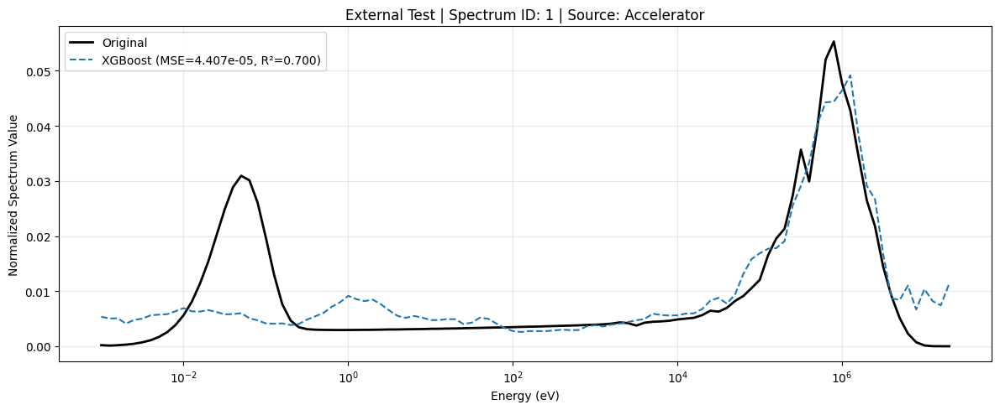

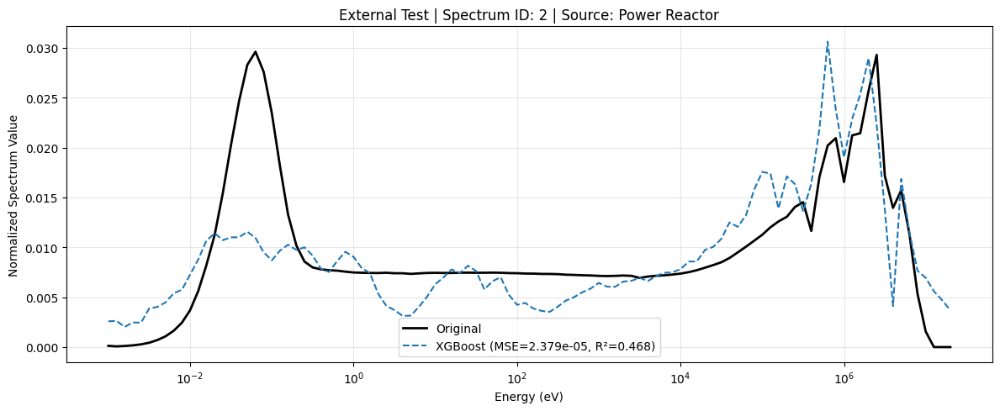

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/Dataset_modified.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

X_train = train_df[count_cols + ["Energy_Source_Code"]].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODELS (METHOD 3 ONLY)
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, tree_method="hist",
            n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training XGBoost...")
xgb_models = train_xgb_multioutput(X_train, Y_train)



print("✅ XGBoost trained successfully.")

# --------------------------
# 3) LOAD TEST DATA + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)
test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --------------------------
# 4) PREDICT + PLOT
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols + ["Energy_Source_Code"]].values.reshape(1, -1)
    y_true = row[spectrum_cols].values

    y_pred_xgb = predict_xgb_multioutput(xgb_models, x_test)[0]


    mse_xgb = mean_squared_error(y_true, y_pred_xgb)
    r2_xgb = r2_score(y_true, y_pred_xgb)

    plt.figure(figsize=(12,5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred_xgb, label=f"XGBoost (MSE={mse_xgb:.3e}, R²={r2_xgb:.3f})", linestyle="--")


    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']} | Source: {row['Energy_Source']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-282769488.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


🔧 Training Extra Trees...
✅ Training done.


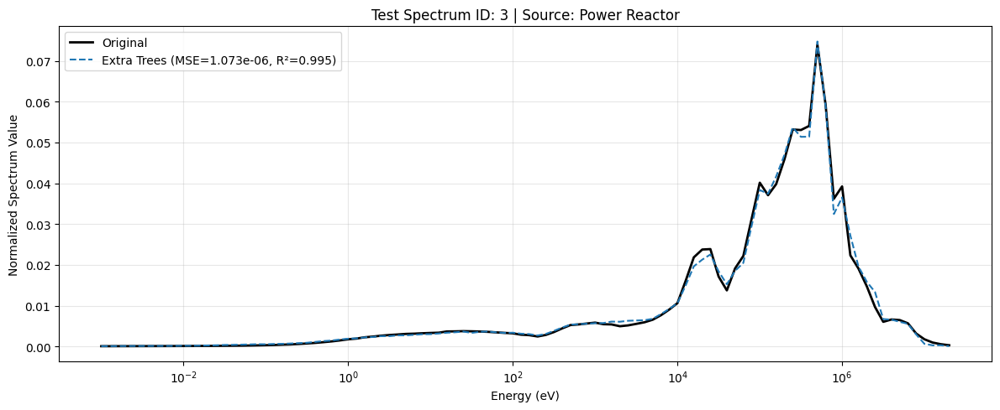

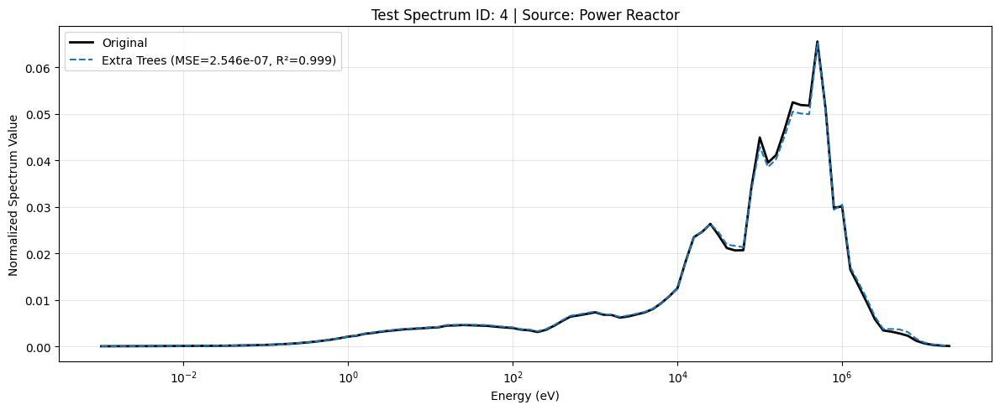

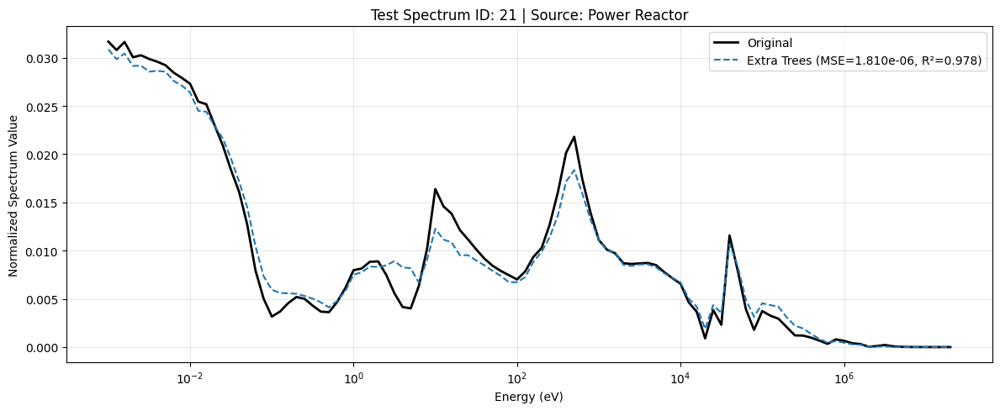

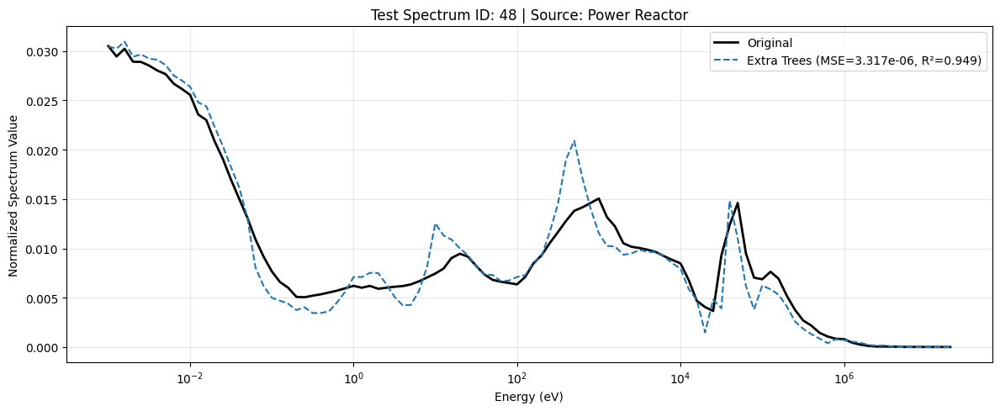

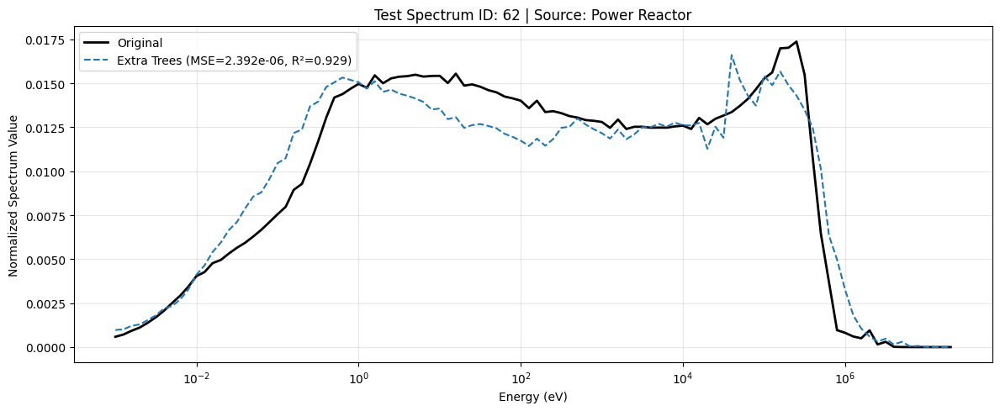

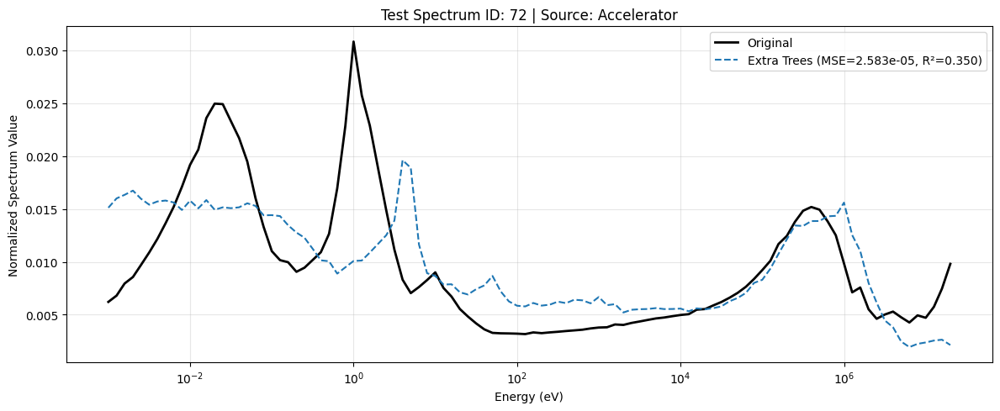

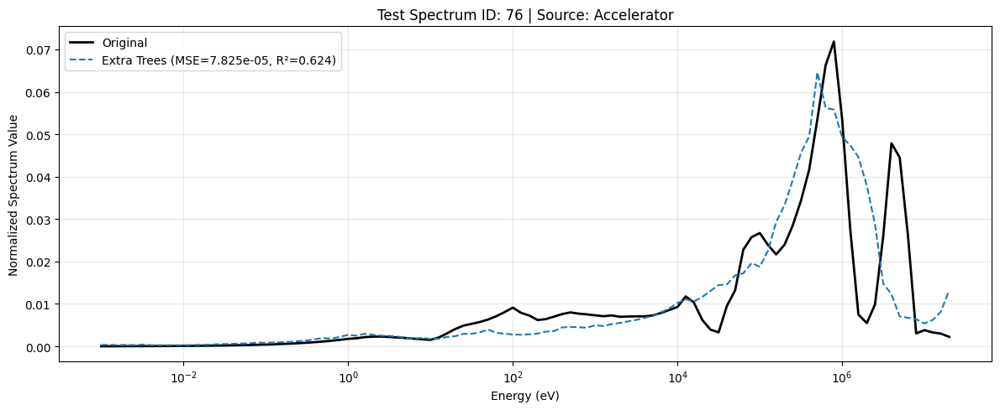

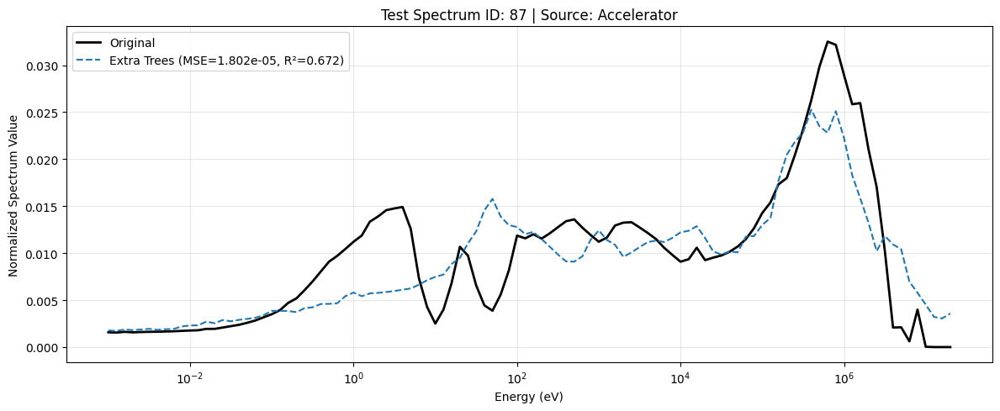

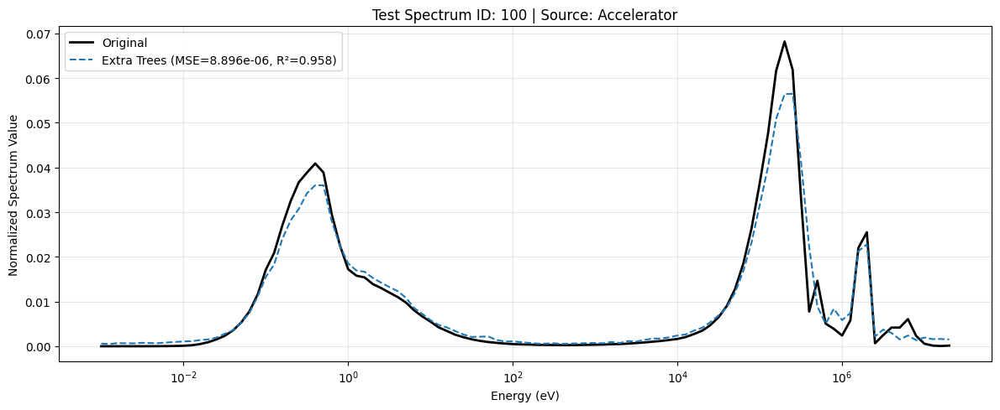

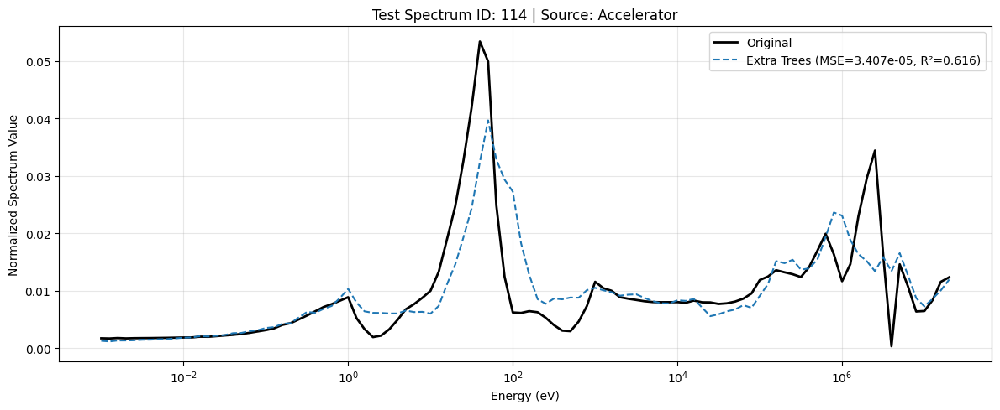

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD DATA + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/Dataset_modified.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --------------------------
# 2) SPLIT INTO TRAIN / TEST BY IDS
# --------------------------
reactor_test_ids = {3, 4, 21, 62, 48}
accelerator_test_ids = {87, 72, 76, 114, 100}
test_ids = reactor_test_ids.union(accelerator_test_ids)

test_df = train_df[train_df["spectrum_id"].isin(test_ids)].copy()
train_df_ = train_df[~train_df["spectrum_id"].isin(test_ids)].copy()

X_train = train_df_[count_cols + ["Energy_Source_Code"]].values
Y_train = train_df_[spectrum_cols].values

X_test = test_df[count_cols + ["Energy_Source_Code"]].values
Y_test = test_df[spectrum_cols].values

# --------------------------
# 3) TRAIN EXTRA TREES (multioutput wrapper)
# --------------------------
def train_extratrees_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = ExtraTreesRegressor(
            n_estimators=300, max_depth=None, min_samples_split=2,
            n_jobs=-1, random_state=42, verbose=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_extratrees_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training Extra Trees...")
et_models = train_extratrees_multioutput(X_train, Y_train)
print("✅ Training done.")

# --------------------------
# 4) PREDICT + PLOT TEST IDS
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols + ["Energy_Source_Code"]].values.reshape(1, -1)
    y_true = row[spectrum_cols].values
    y_pred = predict_extratrees_multioutput(et_models, x_test)[0]

    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    plt.figure(figsize=(12, 5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred, label=f"Extra Trees (MSE={mse:.3e}, R²={r2:.3f})", linestyle="--")

    plt.title(f"Test Spectrum ID: {row['spectrum_id']} | Source: {row['Energy_Source']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


#plotiing the dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# -----------------------
# Load dataset
# -----------------------
df = pd.read_csv("/content/Dataset_modified.csv")

# Spectrum columns
spectrum_cols = [f"spectrum_value_{i}" for i in range(1, 105)]
y = df[spectrum_cols].values
energy_sources = df["Energy_Source"].values
spectrum_ids=df['spectrum_id']

# Energy bins (same as your original code)
energy_bins = np.array([
    1.00E-03, 1.26E-03, 1.58E-03, 2.00E-03, 2.51E-03, 3.16E-03, 3.98E-03, 5.01E-03, 6.31E-03, 7.94E-03,
    1.00E-02, 1.26E-02, 1.58E-02, 2.00E-02, 2.51E-02, 3.16E-02, 3.98E-02, 5.01E-02, 6.31E-02, 7.94E-02,
    1.00E-01, 1.26E-01, 1.58E-01, 2.00E-01, 2.51E-01, 3.16E-01, 3.98E-01, 5.01E-01, 6.31E-01, 7.94E-01,
    1.00E+00, 1.26E+00, 1.58E+00, 2.00E+00, 2.51E+00, 3.16E+00, 3.98E+00, 5.01E+00, 6.31E+00, 7.94E+00,
    1.00E+01, 1.26E+01, 1.58E+01, 2.00E+01, 2.51E+01, 3.16E+01, 3.98E+01, 5.01E+01, 6.31E+01, 7.94E+01,
    1.00E+02, 1.26E+02, 1.58E+02, 2.00E+02, 2.51E+02, 3.16E+02, 3.98E+02, 5.01E+02, 6.31E+02, 7.94E+02,
    1.00E+03, 1.26E+03, 1.58E+03, 2.00E+03, 2.51E+03, 3.16E+03, 3.98E+03, 5.01E+03, 6.31E+03, 7.94E+03,
    1.00E+04, 1.26E+04, 1.58E+04, 2.00E+04, 2.51E+04, 3.16E+04, 3.98E+04, 5.01E+04, 6.31E+04, 7.94E+04,
    1.00E+05, 1.26E+05, 1.58E+05, 2.00E+05, 2.51E+05, 3.16E+05, 3.98E+05, 5.01E+05, 6.31E+05, 7.94E+05,
    1.00E+06, 1.26E+06, 1.58E+06, 2.00E+06, 2.51E+06, 3.16E+06, 3.98E+06, 5.01E+06, 6.31E+06, 7.94E+06,
    1.00E+07, 1.26E+07, 1.58E+07, 2.00E+07
])

n_samples_to_plot = len(y)

# Create figure with one subplot per sample
fig, axes = plt.subplots(n_samples_to_plot, 1, figsize=(12, 3 * n_samples_to_plot))

if n_samples_to_plot == 1:
    axes = np.array([axes])  # ensure array-like for indexing

for i in range(n_samples_to_plot):
    y_true = y[i]
    ax = axes[i]

    ax.plot(energy_bins, y_true, 'k-', linewidth=2)
    ax.set_xscale("log")
    ax.set_ylabel("Spectrum Value")
    ax.set_title(f"id: {spectrum_ids[i]} ({energy_sources[i]})")
    ax.grid(True, which="both", alpha=0.3)

plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

/tmp/ipython-input-2541442285.py:29: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


🔧 Training XGBoost...
✅ XGBoost trained successfully.


/tmp/ipython-input-2541442285.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})


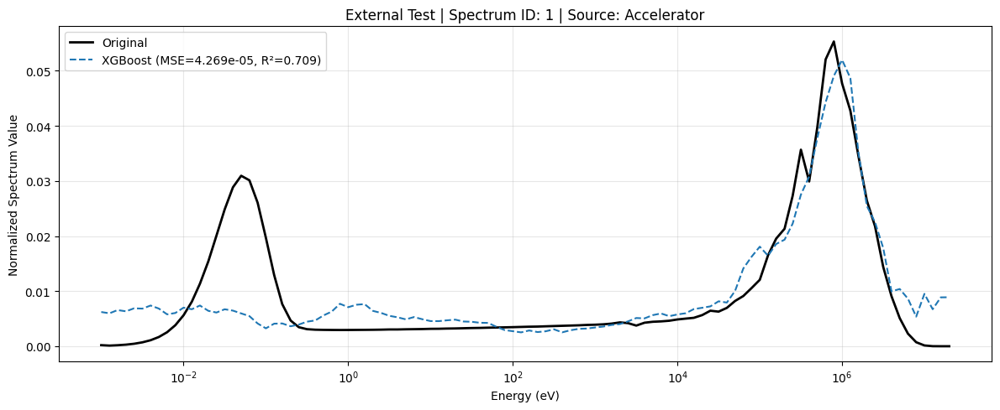

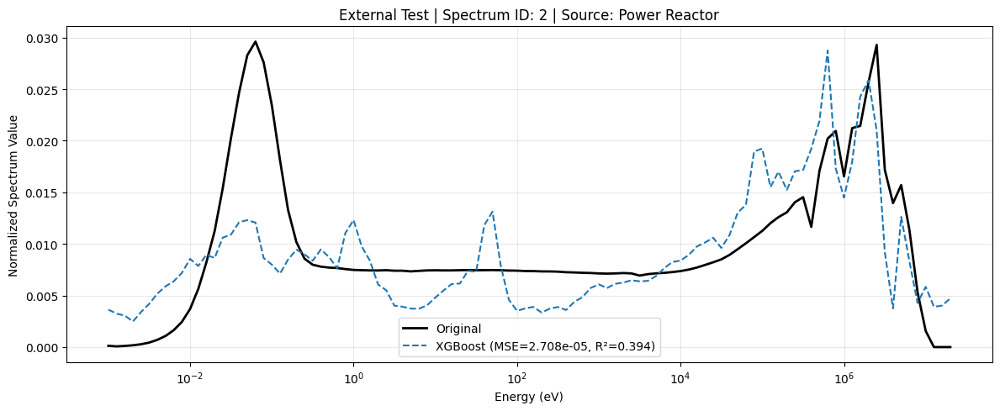

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + REMOVE BAD IDS + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/Dataset_modified.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# ❌ Remove specific bad spectrum IDs
remove_ids = {5,6,7,37,95,16,17,18,19,20,24,36,46,47,51,53,54,55,56,
              70,74,75,76,77,84,86,87,94,96,102,107,112}
train_df = train_df[~train_df["spectrum_id"].isin(remove_ids)].copy()

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

train_df["Energy_Source_Code"] = train_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

X_train = train_df[count_cols + ["Energy_Source_Code"]].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODELS (XGBoost only)
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, tree_method="hist",
            n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training XGBoost...")
xgb_models = train_xgb_multioutput(X_train, Y_train)
print("✅ XGBoost trained successfully.")

# --------------------------
# 3) LOAD TEST DATA + REMOVE BAD IDS + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# ❌ Remove same bad spectrum IDs
test_df = test_df[~test_df["spectrum_id"].isin(remove_ids)].copy()

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)
test_df["Energy_Source_Code"] = test_df["Energy_Source"].map({"Power Reactor": 0, "Accelerator": 1})

# --------------------------
# 4) PREDICT + PLOT
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols + ["Energy_Source_Code"]].values.reshape(1, -1)
    y_true = row[spectrum_cols].values
    y_pred_xgb = predict_xgb_multioutput(xgb_models, x_test)[0]

    mse_xgb = mean_squared_error(y_true, y_pred_xgb)
    r2_xgb = r2_score(y_true, y_pred_xgb)

    plt.figure(figsize=(12, 5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred_xgb, label=f"XGBoost (MSE={mse_xgb:.3e}, R²={r2_xgb:.3f})", linestyle="--")

    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']} | Source: {row['Energy_Source']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


🔧 Training XGBoost...
✅ XGBoost trained successfully.


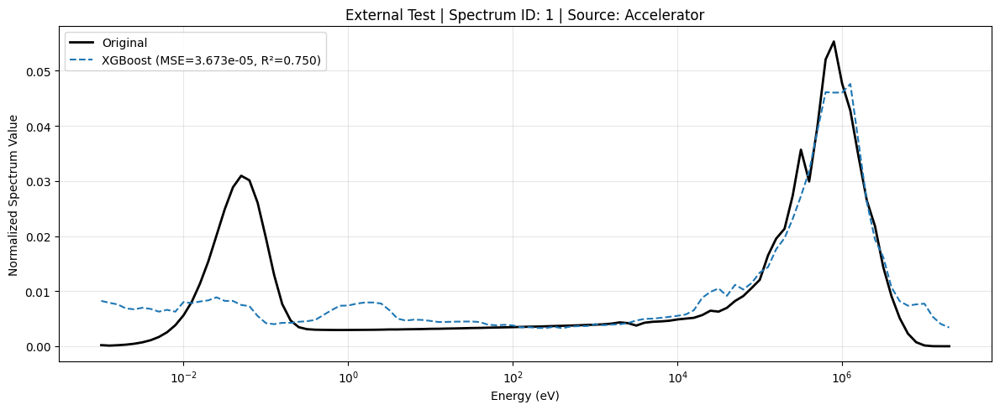

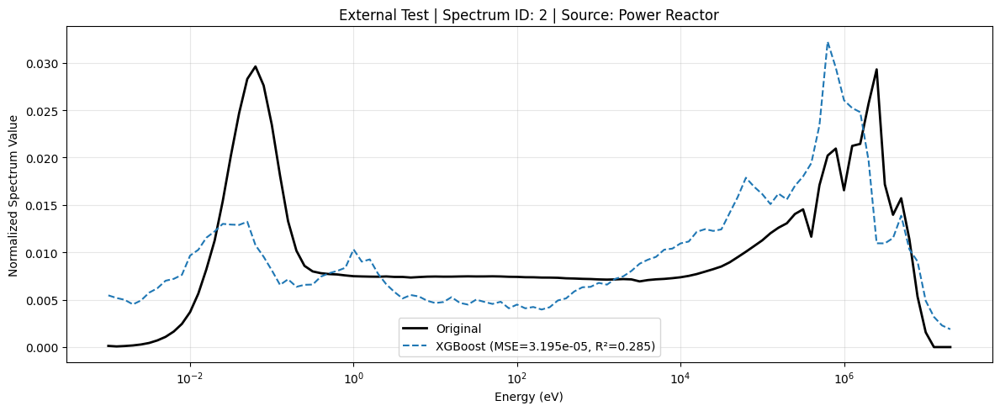

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + REMOVE BAD IDS + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/Dataset_modified.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# ❌ Remove specific bad spectrum IDs
remove_ids = {5,6,7,8,13,14,15,16,17,18,19,20,21,22,23,24,48,49,51,52,53,54,55,56,57,58,68,70,74,75,77,78,79,81,82,86,89,90,91,92,96,102,110,111,112,113,114,108,107,106,100,99,98,97}
train_df = train_df[~train_df["spectrum_id"].isin(remove_ids)].copy()

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

# ✅ Only counts used as features (NO Energy_Source)
X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODELS (XGBoost only)
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, tree_method="hist",
            n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training XGBoost...")
xgb_models = train_xgb_multioutput(X_train, Y_train)
print("✅ XGBoost trained successfully.")

# --------------------------
# 3) LOAD TEST DATA + REMOVE BAD IDS + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# ❌ Remove same bad spectrum IDs
test_df = test_df[~test_df["spectrum_id"].isin(remove_ids)].copy()

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)

# ✅ Only counts used as features (NO Energy_Source)
X_test_all = test_df[count_cols].values

# --------------------------
# 4) PREDICT + PLOT
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true = row[spectrum_cols].values
    y_pred_xgb = predict_xgb_multioutput(xgb_models, x_test)[0]

    mse_xgb = mean_squared_error(y_true, y_pred_xgb)
    r2_xgb = r2_score(y_true, y_pred_xgb)

    plt.figure(figsize=(12, 5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred_xgb, label=f"XGBoost (MSE={mse_xgb:.3e}, R²={r2_xgb:.3f})", linestyle="--")

    # ✅ Still show Energy_Source in title (for visualization only)
    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']} | Source: {row['Energy_Source']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


🔧 Training XGBoost...
✅ XGBoost trained successfully.


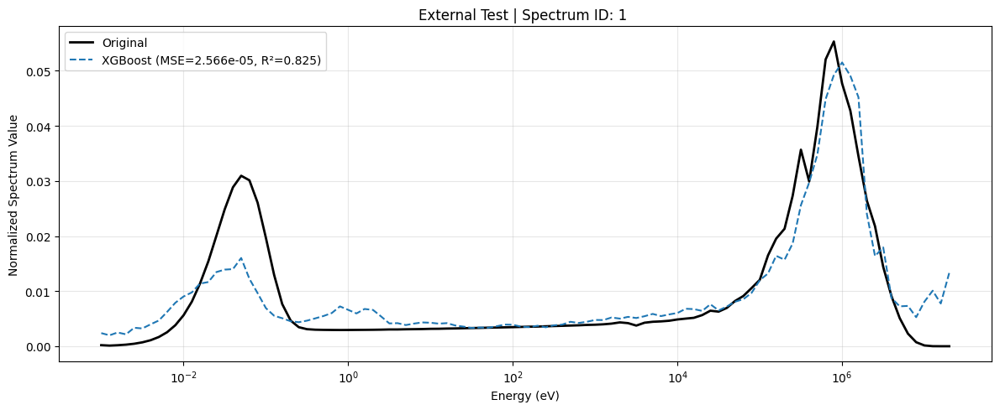

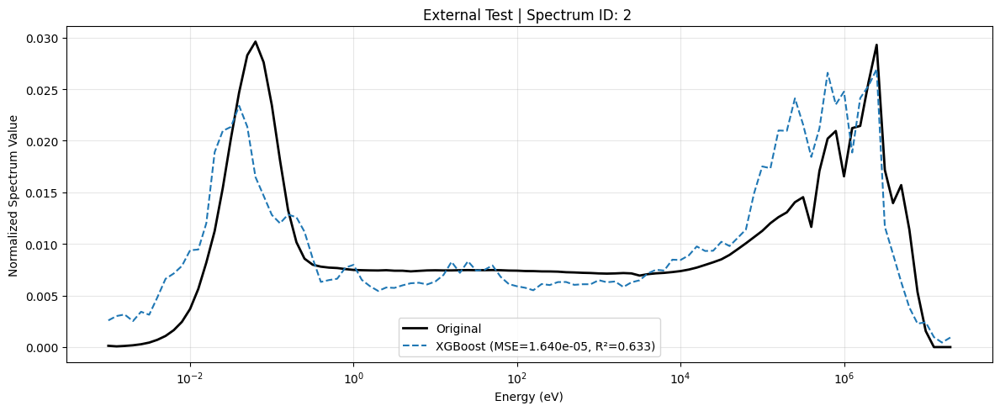

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + REMOVE BAD IDS + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/complete_dataset.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# ❌ Remove specific bad spectrum IDs
remove_ids = {5,6,7,37,95,16,17,18,19,20,24,36,46,47,51,53,54,55,56,
              70,74,75,76,77,84,86,87,94,96,102,107,112}
train_df = train_df[~train_df["spectrum_id"].isin(remove_ids)].copy()

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)



X_train = train_df[count_cols ].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODELS (XGBoost only)
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, tree_method="hist",
            n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training XGBoost...")
xgb_models = train_xgb_multioutput(X_train, Y_train)
print("✅ XGBoost trained successfully.")

# --------------------------
# 3) LOAD TEST DATA + REMOVE BAD IDS + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# ❌ Remove same bad spectrum IDs
test_df = test_df[~test_df["spectrum_id"].isin(remove_ids)].copy()

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)


# --------------------------
# 4) PREDICT + PLOT
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols ].values.reshape(1, -1)
    y_true = row[spectrum_cols].values
    y_pred_xgb = predict_xgb_multioutput(xgb_models, x_test)[0]

    mse_xgb = mean_squared_error(y_true, y_pred_xgb)
    r2_xgb = r2_score(y_true, y_pred_xgb)

    plt.figure(figsize=(12, 5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred_xgb, label=f"XGBoost (MSE={mse_xgb:.3e}, R²={r2_xgb:.3f})", linestyle="--")

    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']} ")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


🔧 Training models...
✅ All models trained successfully.


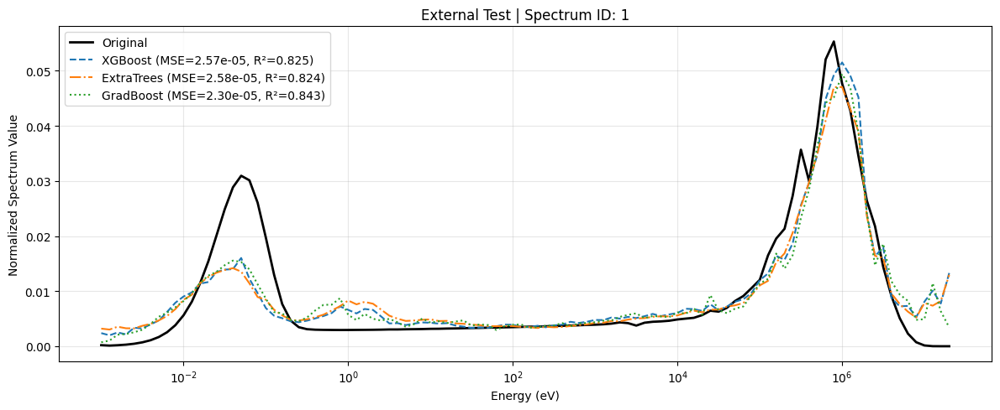

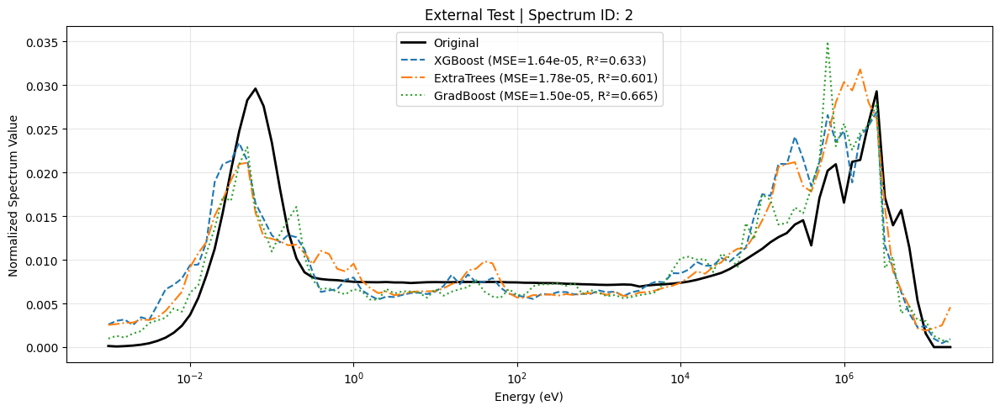

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.ensemble import ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + REMOVE BAD IDS + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/complete_dataset.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# ❌ Remove specific bad spectrum IDs
remove_ids = {5,6,7,37,95,16,17,18,19,20,24,36,46,47,51,53,54,55,56,
              70,74,75,76,77,84,86,87,94,96,102,107,112}
train_df = train_df[~train_df["spectrum_id"].isin(remove_ids)].copy()

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODELS (Multi-output Wrappers)
# --------------------------
def train_multioutput(model_class, X, Y, **kwargs):
    models = []
    for j in range(Y.shape[1]):
        model = model_class(**kwargs)
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training models...")
xgb_models = train_multioutput(
    XGBRegressor,
    X_train, Y_train,
    n_estimators=300, max_depth=6, learning_rate=0.05,
    subsample=0.8, colsample_bytree=0.8, tree_method="hist",
    n_jobs=-1, verbosity=0
)

et_models = train_multioutput(
    ExtraTreesRegressor,
    X_train, Y_train,
    n_estimators=300, max_depth=20, n_jobs=-1, random_state=42
)

gb_models = train_multioutput(
    GradientBoostingRegressor,
    X_train, Y_train,
    n_estimators=300, max_depth=5, learning_rate=0.05
)
print("✅ All models trained successfully.")

# --------------------------
# 3) LOAD TEST DATA + REMOVE BAD IDS + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_df = test_df[~test_df["spectrum_id"].isin(remove_ids)].copy()

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)

# --------------------------
# 4) PREDICT + PLOT COMPARISONS
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true = row[spectrum_cols].values

    y_pred_xgb = predict_multioutput(xgb_models, x_test)[0]
    y_pred_et  = predict_multioutput(et_models, x_test)[0]
    y_pred_gb  = predict_multioutput(gb_models, x_test)[0]

    mse_xgb = mean_squared_error(y_true, y_pred_xgb)
    r2_xgb = r2_score(y_true, y_pred_xgb)

    mse_et = mean_squared_error(y_true, y_pred_et)
    r2_et = r2_score(y_true, y_pred_et)

    mse_gb = mean_squared_error(y_true, y_pred_gb)
    r2_gb = r2_score(y_true, y_pred_gb)

    plt.figure(figsize=(12, 5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred_xgb, label=f"XGBoost (MSE={mse_xgb:.2e}, R²={r2_xgb:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred_et,  label=f"ExtraTrees (MSE={mse_et:.2e}, R²={r2_et:.3f})", linestyle="-.")
    plt.semilogx(energy_bins, y_pred_gb,  label=f"GradBoost (MSE={mse_gb:.2e}, R²={r2_gb:.3f})", linestyle=":")

    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


In [ ]:
pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.4 MB/s eta 0:00:00


#GRADIENT BOOSTING

🔧 Training Gradient Boosting...


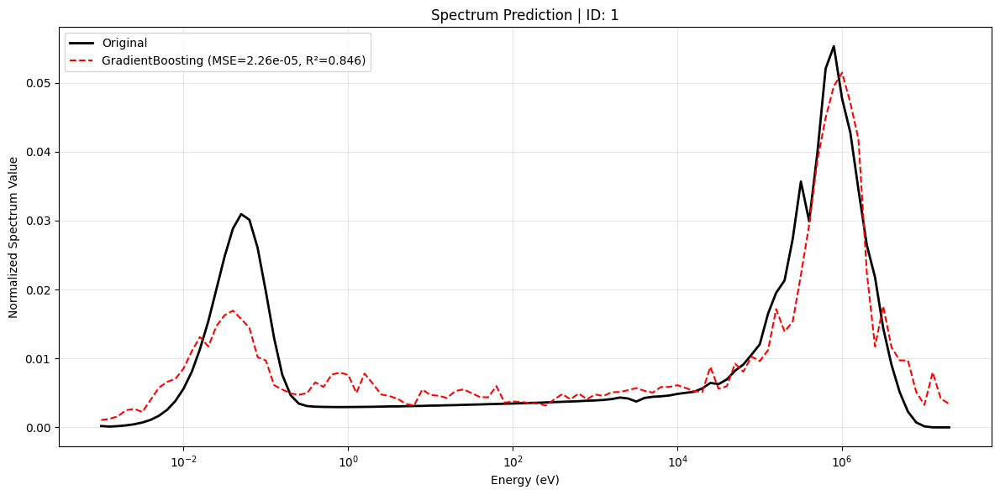

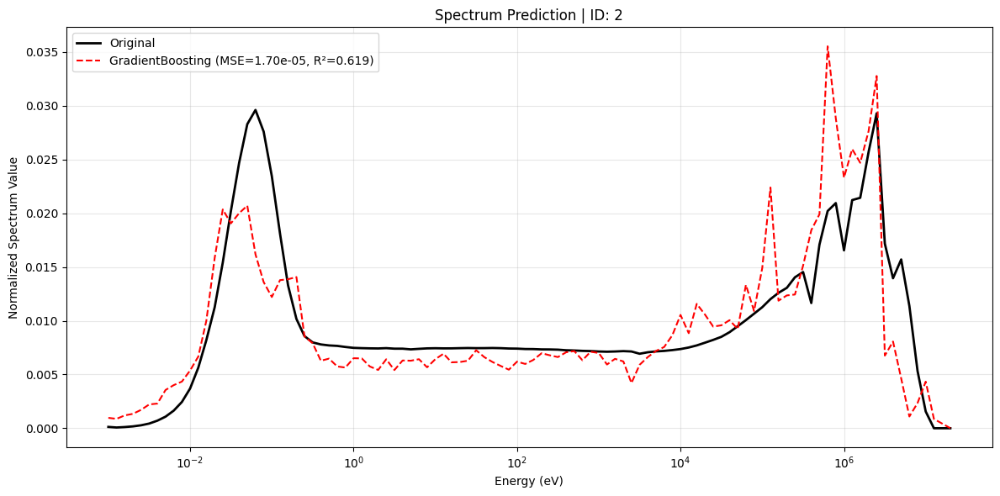

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor

from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# --------------------------
# 1) LOAD TRAINING DATA
# --------------------------
train_df = pd.read_csv("/content/complete_dataset.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# ❌ Remove specific bad spectrum IDs
remove_ids = {5,6,7,37,95,16,17,18,19,20,24,36,46,47,51,53,54,55,56,
              70,74,75,76,77,84,86,87,94,96,102,107,112}
train_df = train_df[~train_df["spectrum_id"].isin(remove_ids)].copy()

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) DEFINE TRAINING HELPERS
# --------------------------
def train_multioutput(model_class, X, Y, **kwargs):
    models = []
    for j in range(Y.shape[1]):
        model = model_class(**kwargs)
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

# --------------------------
# 3) TRAIN MODELS
# --------------------------
print("🔧 Training Gradient Boosting...")
gb_models = train_multioutput(GradientBoostingRegressor, X_train, Y_train,
                              n_estimators=300, max_depth=6, learning_rate=0.05)


XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, tree_method="hist", n_jobs=-1, verbosity=0
        )
# --------------------------
# 4) LOAD TEST DATA
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")
test_df = test_df[~test_df["spectrum_id"].isin(remove_ids)].copy()

# Normalize
ctotal = test_df[count_cols].sum(axis=1)
ctotal[ctotal == 0] = 1
stotal = test_df[spectrum_cols].sum(axis=1)
stotal[stotal == 0] = 1

test_df[count_cols] = test_df[count_cols].div(ctotal, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(stotal, axis=0)

# --------------------------
# 5) ENERGY BINS
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

# --------------------------
# 6) PREDICT & PLOT
# --------------------------
for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true = row[spectrum_cols].values

    preds = {
        "GradientBoosting": predict_multioutput(gb_models, x_test)[0]

    }

    plt.figure(figsize=(12, 6))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)

    for name, y_pred in preds.items():
        mse = mean_squared_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)
        plt.semilogx(energy_bins, y_pred, linestyle="--", label=f"{name} (MSE={mse:.2e}, R²={r2:.3f})", color='red')

    plt.title(f"Spectrum Prediction | ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()

🔧 Training Gradient Boosting...
✅ Training complete.


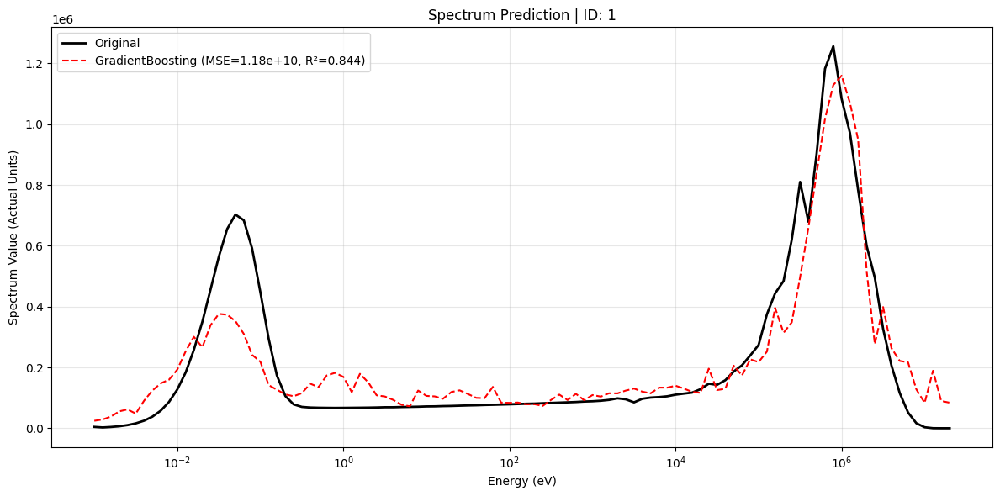

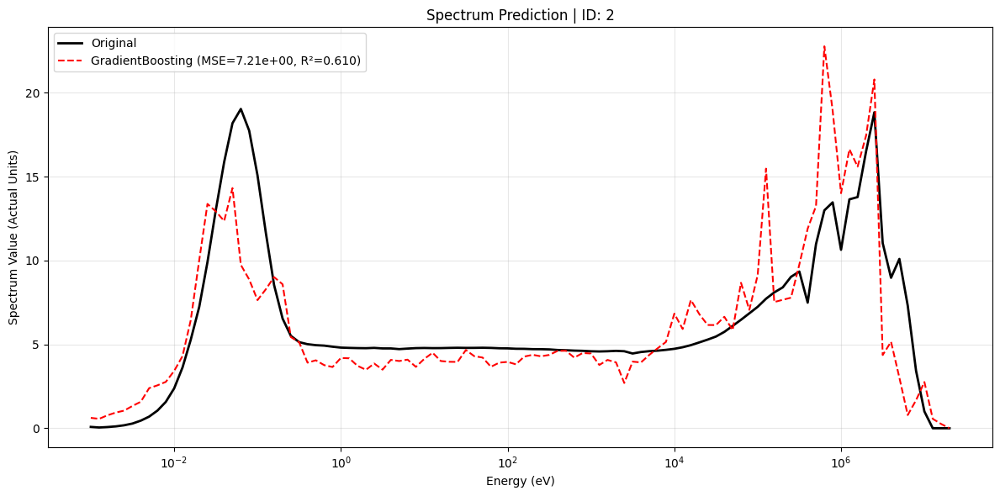

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor

# --------------------------
# 1) LOAD TRAINING DATA
# --------------------------
train_df = pd.read_csv("/content/complete_dataset.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# ❌ Remove bad spectrum IDs
remove_ids = {5,6,7,37,95,16,17,18,19,20,24,36,46,47,51,53,54,55,56,
              70,74,75,76,77,84,86,87,94,96,102,107,112}
train_df = train_df[~train_df["spectrum_id"].isin(remove_ids)].copy()

# Normalization factors
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

# Normalize
train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAINING HELPERS
# --------------------------
def train_multioutput(model_class, X, Y, **kwargs):
    models = []
    for j in range(Y.shape[1]):
        model = model_class(**kwargs)
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

# --------------------------
# 3) TRAIN MODEL
# --------------------------
print("🔧 Training Gradient Boosting...")
gb_models = train_multioutput(
    GradientBoostingRegressor,
    X_train, Y_train,
    n_estimators=300, max_depth=6, learning_rate=0.05
)
print("✅ Training complete.")

# --------------------------
# 4) LOAD TEST DATA
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")
test_df = test_df[~test_df["spectrum_id"].isin(remove_ids)].copy()

# Normalization factors
ctotal = test_df[count_cols].sum(axis=1)
ctotal[ctotal == 0] = 1
stotal = test_df[spectrum_cols].sum(axis=1)
stotal[stotal == 0] = 1

# Normalize for prediction
test_df[count_cols] = test_df[count_cols].div(ctotal, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(stotal, axis=0)

# --------------------------
# 5) ENERGY BINS
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

# --------------------------
# 6) PREDICT & PLOT (DENORMALIZED)
# --------------------------
for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true_norm = row[spectrum_cols].values

    # Predict normalized spectrum
    y_pred_norm = predict_multioutput(gb_models, x_test)[0]

    # Recover original scaling factor for this row
    spectrum_total = stotal.iloc[idx]

    # Denormalize to actual values
    y_true_actual = y_true_norm * spectrum_total
    y_pred_actual = y_pred_norm * spectrum_total

    # Metrics on actual values
    mse = mean_squared_error(y_true_actual, y_pred_actual)
    r2 = r2_score(y_true_actual, y_pred_actual)

    # Plot
    plt.figure(figsize=(12, 6))
    plt.semilogx(energy_bins, y_true_actual, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred_actual, linestyle="--",
                 label=f"GradientBoosting (MSE={mse:.2e}, R²={r2:.3f})", color='red')

    plt.title(f"Spectrum Prediction | ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Spectrum Value (Actual Units)")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


#XGBOOST

🔧 Training XGBoost (no augmentation)...
✅ Model trained successfully.


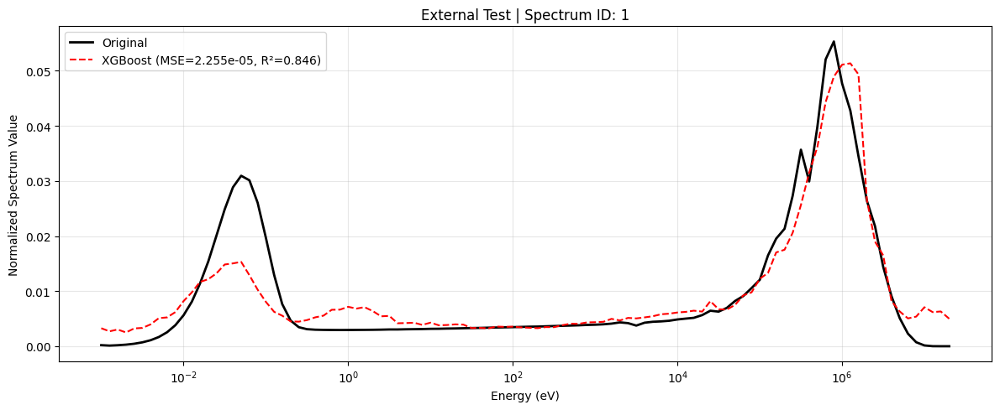

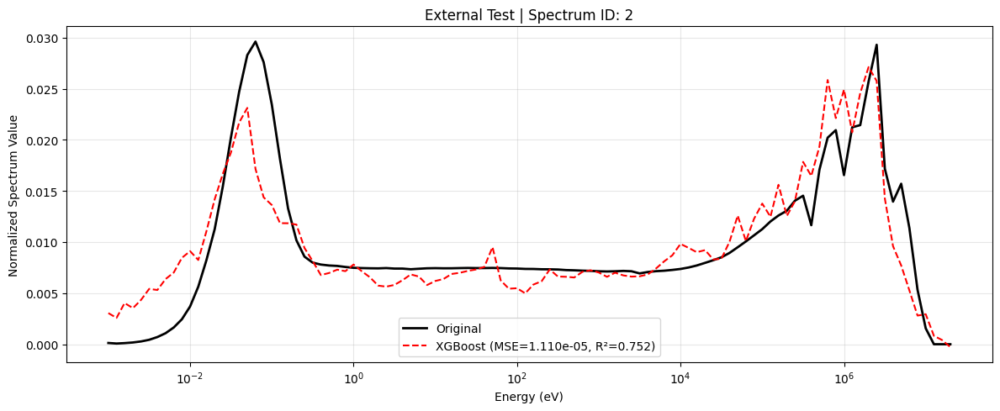

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/complete_dataset.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODEL (NO AUGMENTATION)
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8,
            tree_method="hist", n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training XGBoost (no augmentation)...")
xgb_models = train_xgb_multioutput(X_train, Y_train)
print("✅ Model trained successfully.")

# --------------------------
# 3) LOAD TEST DATA + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)

# --------------------------
# 4) ENERGY BINS
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

# --------------------------
# 5) PREDICT + PLOT
# --------------------------
for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true = row[spectrum_cols].values
    y_pred = predict_xgb_multioutput(xgb_models, x_test)[0]

    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    plt.figure(figsize=(12, 5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred, linestyle="--",
                 label=f"XGBoost (MSE={mse:.3e}, R²={r2:.3f})", color="red")

    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


🔧 Training XGBoost (no augmentation)...
✅ Model trained successfully.


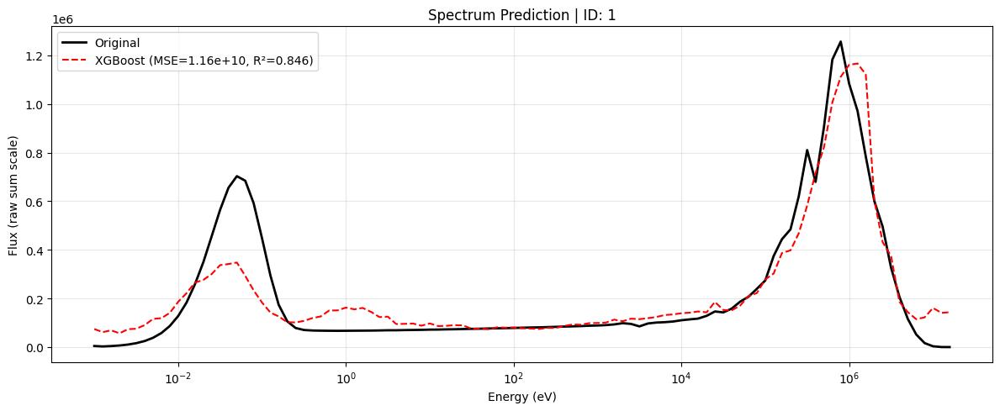

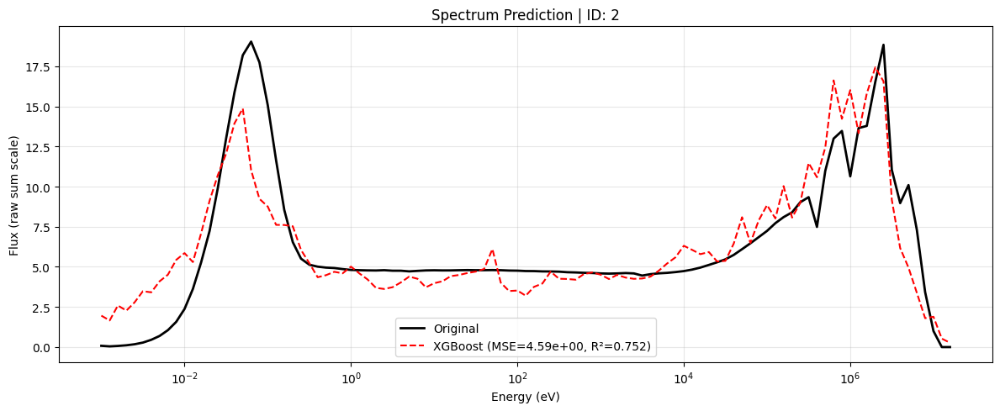

✅ Results saved to xgb_sums_results.csv


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/complete_dataset.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODEL (NO AUGMENTATION)
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8,
            tree_method="hist", n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training XGBoost (no augmentation)...")
xgb_models = train_xgb_multioutput(X_train, Y_train)
print("✅ Model trained successfully.")

# --------------------------
# 3) LOAD TEST DATA + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)

# --------------------------
# 4) ENERGY BINS
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

energy_centers = (energy_bins[:-1] + energy_bins[1:]) / 2

# --------------------------
# 5) PREDICT + EVALUATE (ONLY SUMS)
# --------------------------
results = []

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true_norm = row[spectrum_cols].values
    y_pred_norm = predict_xgb_multioutput(xgb_models, x_test)[0]

    # Restore actual values
    spectrum_total = test_spectrum_total.iloc[idx]
    y_true_actual = y_true_norm * spectrum_total
    y_pred_actual = y_pred_norm * spectrum_total

    mse = mean_squared_error(y_true_actual, y_pred_actual)
    r2 = r2_score(y_true_actual, y_pred_actual)

    # Compute raw sums
    regions = ["thermal", "epithermal", "fast", "total"]
    row_res = {"spectrum_id": row["spectrum_id"], "MSE": mse, "R2": r2}
    for region in regions:
        if region == "thermal":
            mask = energy_centers < 0.4
        elif region == "epithermal":
            mask = (energy_centers >= 0.4) & (energy_centers < 1e5)
        elif region == "fast":
            mask = energy_centers >= 1e5
        else:
            mask = np.ones_like(energy_centers, dtype=bool)

        phi_true_sum = np.sum(y_true_actual[:-1][mask])
        phi_pred_sum = np.sum(y_pred_actual[:-1][mask])
        rel_diff_sum = 100 * (phi_pred_sum - phi_true_sum) / (phi_true_sum if phi_true_sum != 0 else 1)

        row_res[f"{region}_sum_true"] = phi_true_sum
        row_res[f"{region}_sum_pred"] = phi_pred_sum
        row_res[f"{region}_sum_reldiff(%)"] = rel_diff_sum

    results.append(row_res)

    # Plot
    plt.figure(figsize=(12, 5))
    plt.semilogx(energy_bins[:-1], y_true_actual[:-1], label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins[:-1], y_pred_actual[:-1], linestyle="--",
                 label=f"XGBoost (MSE={mse:.2e}, R²={r2:.3f})", color="red")
    plt.title(f"Spectrum Prediction | ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Flux (raw sum scale)")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()

# --------------------------
# 6) SAVE RESULTS
# --------------------------
results_df = pd.DataFrame(results)
results_df.to_csv("xgb_sums_results.csv", index=False)
print("✅ Results saved to xgb_sums_results.csv")


🔧 Training XGBoost (no augmentation)...
✅ Model trained successfully.
Number of spectrum bins = 104
thermal: 27 bins
epithermal: 53 bins
fast: 24 bins
total: 104 bins


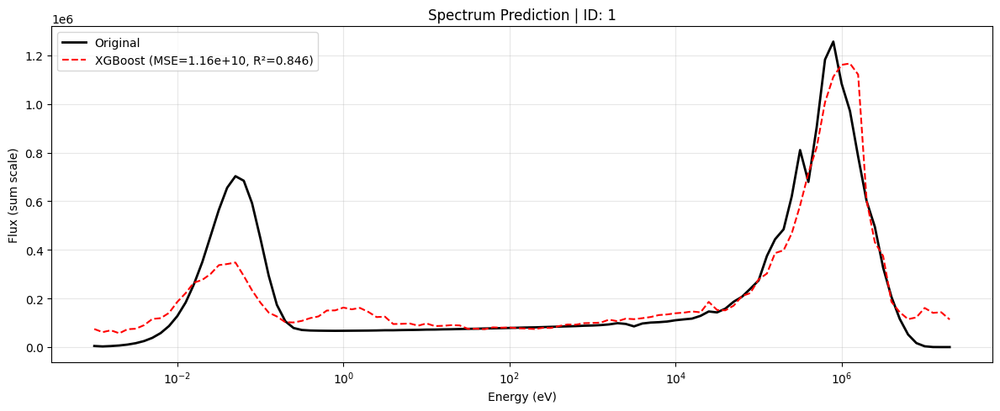

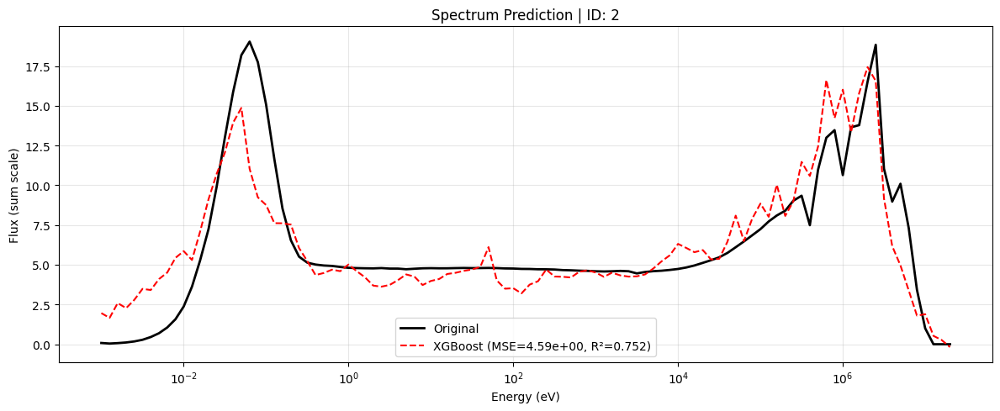

✅ Results saved to xgb_sums_results.csv


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
# Note: You'll need to replace the file paths with the actual location of your data.
try:
    train_df = pd.read_csv("complete_dataset.csv")
except FileNotFoundError:
    print("Error: 'complete_dataset.csv' not found. Please check the file path.")
    # Create dummy data to allow the script to run for demonstration
    print("Creating dummy training data...")
    num_samples_train = 100
    num_counts = 50
    num_spectrum = 104
    train_df = pd.DataFrame(np.random.rand(num_samples_train, num_counts + num_spectrum))
    train_df.columns = [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]


spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODEL (NO AUGMENTATION)
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8,
            tree_method="hist", n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training XGBoost (no augmentation)...")
xgb_models = train_xgb_multioutput(X_train, Y_train)
print("✅ Model trained successfully.")

# --------------------------
# 3) LOAD TEST DATA + NORMALIZE
# --------------------------
try:
    test_df = pd.read_csv("Test_Dataset_modified.csv")
except FileNotFoundError:
    print("Error: 'Test_Dataset_modified.csv' not found. Please check the file path.")
    # Create dummy data to allow the script to run for demonstration
    print("Creating dummy test data...")
    num_samples_test = 10
    test_df = pd.DataFrame(np.random.rand(num_samples_test, num_counts + num_spectrum + 1))
    test_df.columns = ["spectrum_id"] + [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]
    test_df["spectrum_id"] = [f"test_{i}" for i in range(num_samples_test)]


test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)

# --------------------------
# 4) ENERGY BINS (CORRECTED)
# --------------------------
bin_edges = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

# FIX 1: Correctly define n_bins. It should be the length of the energy points array.
n_bins = len(bin_edges) # This is 104, matching the number of spectrum columns.
print(f"Number of spectrum bins = {n_bins}")

# FIX 2: Define masks with length 104 by using the full `bin_edges` array.
thermal_mask    = bin_edges < 0.4
epithermal_mask = (bin_edges >= 0.4) & (bin_edges < 1e5)
fast_mask       = bin_edges >= 1e5
total_mask      = np.ones(n_bins, dtype=bool)

region_masks = {
    "thermal": thermal_mask,
    "epithermal": epithermal_mask,
    "fast": fast_mask,
    "total": total_mask,
}

# print region bin counts to confirm
for region, mask in region_masks.items():
    print(f"{region}: {np.sum(mask)} bins")


# --------------------------
# 5) PREDICT + EVALUATE (CORRECTED)
# --------------------------
results = []

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true_norm = row[spectrum_cols].values
    y_pred_norm = predict_xgb_multioutput(xgb_models, x_test)[0]

    # Restore actual values
    spectrum_total = test_spectrum_total.iloc[idx]
    y_true_actual = y_true_norm * spectrum_total
    y_pred_actual = y_pred_norm * spectrum_total

    mse = mean_squared_error(y_true_actual, y_pred_actual)
    r2 = r2_score(y_true_actual, y_pred_actual)

    # Compute sums in regions
    row_res = {"spectrum_id": row["spectrum_id"], "MSE": mse, "R2": r2}
    for region, mask in region_masks.items():
        # This will now work correctly as len(mask) == len(y_true_actual)
        phi_true_sum = np.sum(y_true_actual[mask])
        phi_pred_sum = np.sum(y_pred_actual[mask])
        rel_diff_sum = 100 * (phi_pred_sum - phi_true_sum) / (phi_true_sum if phi_true_sum != 0 else 1)

        row_res[f"{region}_sum_true"] = phi_true_sum
        row_res[f"{region}_sum_pred"] = phi_pred_sum
        row_res[f"{region}_sum_reldiff(%)"] = rel_diff_sum

    results.append(row_res)

    # Plot spectrum comparison
    plt.figure(figsize=(12, 5))
    # FIX 3: Use the full `bin_edges` array for plotting.
    plt.semilogx(bin_edges, y_true_actual, label="Original", color="black", linewidth=2)
    plt.semilogx(bin_edges, y_pred_actual, linestyle="--",
                 label=f"XGBoost (MSE={mse:.2e}, R²={r2:.3f})", color="red")
    plt.title(f"Spectrum Prediction | ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Flux (sum scale)")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()

# --------------------------
# 6) SAVE RESULTS
# --------------------------
results_df = pd.DataFrame(results)
results_df.to_csv("xgb_sums_results.csv", index=False)
print("✅ Results saved to xgb_sums_results.csv")

# The Four Methods For The Best Model

✅ All 4 XGBoost-based models trained successfully.


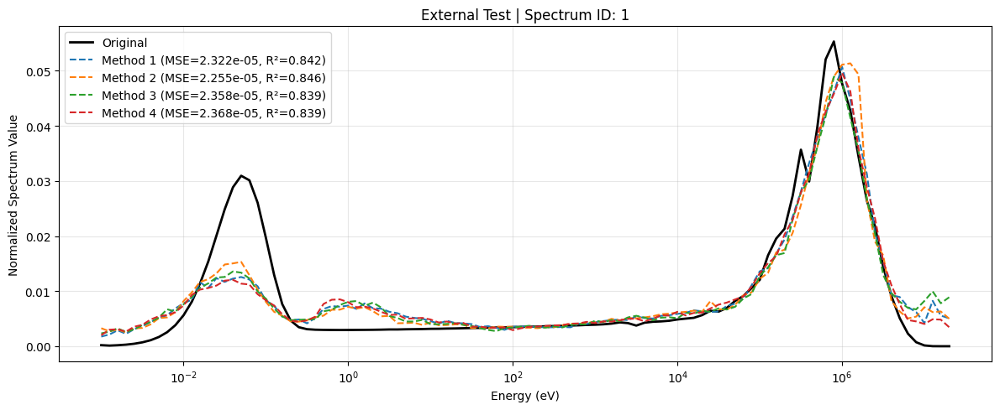

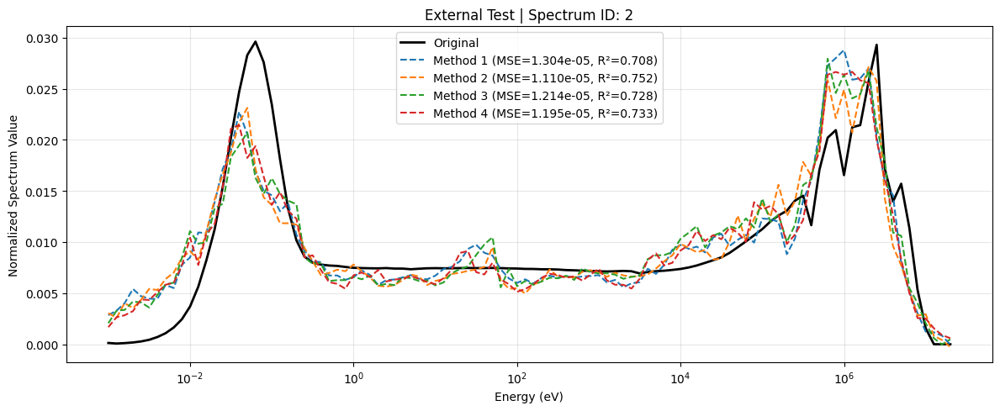

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
from scipy.signal import find_peaks

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
train_df = pd.read_csv("/content/complete_dataset.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Response matrix for augmentation
resp_df = pd.read_csv("/content/response_matrix_modified.csv")
response_matrix = resp_df.select_dtypes(include=[np.number]).values
if response_matrix.shape[1] != len(spectrum_cols):
    response_matrix = response_matrix.T

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

# --------------------------
# 2) DATA AUGMENTATION
# --------------------------
def add_gaussian_noise(spectrum, noise_level=0.05):
    noise = np.random.normal(0, noise_level * np.maximum(spectrum, 0.01), size=spectrum.shape)
    return np.clip(spectrum + noise, 0, None)

def multiplicative_noise(spectrum, scale_range=(0.95, 1.05)):
    return spectrum * np.random.uniform(*scale_range)

def smooth_spectrum(spectrum, window_size=5):
    kernel = np.ones(window_size) / window_size
    return np.convolve(spectrum, kernel, mode="same")

def random_peak_scaling(spectrum, prominence=0.05, scale_range=(0.8, 1.3)):
    peaks, _ = find_peaks(spectrum, prominence=prominence * np.max(spectrum))
    if len(peaks) == 0: return spectrum
    aug = spectrum.copy()
    selected_peaks = np.random.choice(peaks, size=np.random.randint(1, min(len(peaks), 3)+1), replace=False)
    for p in selected_peaks:
        scale = np.random.uniform(*scale_range)
        aug[p] *= scale
        if p > 0: aug[p-1] *= (scale+1)/2
        if p < len(aug)-1: aug[p+1] *= (scale+1)/2
    return np.clip(aug, 0, None)

def augment_sequentially(spectrum):
    aug = random_peak_scaling(spectrum)
    aug = smooth_spectrum(aug)
    aug = multiplicative_noise(aug)
    aug = add_gaussian_noise(aug)
    return np.clip(aug, 0, None)

def augment_training_data(train_df, n_augments=3):
    augmented_rows = []
    for _, row in train_df.iterrows():
        spectrum = row[spectrum_cols].values.astype(float)
        for _ in range(n_augments):
            augmented_row = row.copy()
            new_spectrum = augment_sequentially(spectrum)
            augmented_row[spectrum_cols] = new_spectrum
            new_counts = response_matrix @ new_spectrum
            new_counts /= new_counts.sum() if new_counts.sum() != 0 else 1
            augmented_row[count_cols] = new_counts
            augmented_rows.append(augmented_row)
    return pd.concat([train_df, pd.DataFrame(augmented_rows)], ignore_index=True)

# --------------------------
# 3) TRAIN MODELS (4 METHODS) - Using XGBoost
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, tree_method="hist", n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

# Method 1 (Augmentation)
train_aug1 = augment_training_data(train_df, n_augments=5)
model1 = train_xgb_multioutput(train_aug1[count_cols].values, train_aug1[spectrum_cols].values)

# Method 2 (No Augmentation)
model2 = train_xgb_multioutput(train_df[count_cols].values, train_df[spectrum_cols].values)

# Method 3 (Augmentation with fewer augmentations)
train_aug3 = augment_training_data(train_df, n_augments=2)
model3 = train_xgb_multioutput(train_aug3[count_cols].values, train_aug3[spectrum_cols].values)

# Method 4 (Heavy Augmentation)
train_aug4 = augment_training_data(train_df, n_augments=10)
model4 = train_xgb_multioutput(train_aug4[count_cols].values, train_aug4[spectrum_cols].values)

print("✅ All 4 XGBoost-based models trained successfully.")

# --------------------------
# 4) LOAD TEST DATA + NORMALIZE
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)

# --------------------------
# 5) PREDICT + PLOT
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true = row[spectrum_cols].values

    y_pred1 = predict_xgb_multioutput(model1, x_test)[0]
    y_pred2 = predict_xgb_multioutput(model2, x_test)[0]
    y_pred3 = predict_xgb_multioutput(model3, x_test)[0]
    y_pred4 = predict_xgb_multioutput(model4, x_test)[0]

    mse_vals = [
        mean_squared_error(y_true, y_pred1),
        mean_squared_error(y_true, y_pred2),
        mean_squared_error(y_true, y_pred3),
        mean_squared_error(y_true, y_pred4)
    ]
    r2_vals = [
        r2_score(y_true, y_pred1),
        r2_score(y_true, y_pred2),
        r2_score(y_true, y_pred3),
        r2_score(y_true, y_pred4)
    ]

    plt.figure(figsize=(12,5))
    plt.semilogx(energy_bins, y_true, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins, y_pred1, label=f"Method 1 (MSE={mse_vals[0]:.3e}, R²={r2_vals[0]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred2, label=f"Method 2 (MSE={mse_vals[1]:.3e}, R²={r2_vals[1]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred3, label=f"Method 3 (MSE={mse_vals[2]:.3e}, R²={r2_vals[2]:.3f})", linestyle="--")
    plt.semilogx(energy_bins, y_pred4, label=f"Method 4 (MSE={mse_vals[3]:.3e}, R²={r2_vals[3]:.3f})", linestyle="--")

    plt.title(f"External Test | Spectrum ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized Spectrum Value")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()


🔧 Training Gradient Boosting...
✅ Training complete.


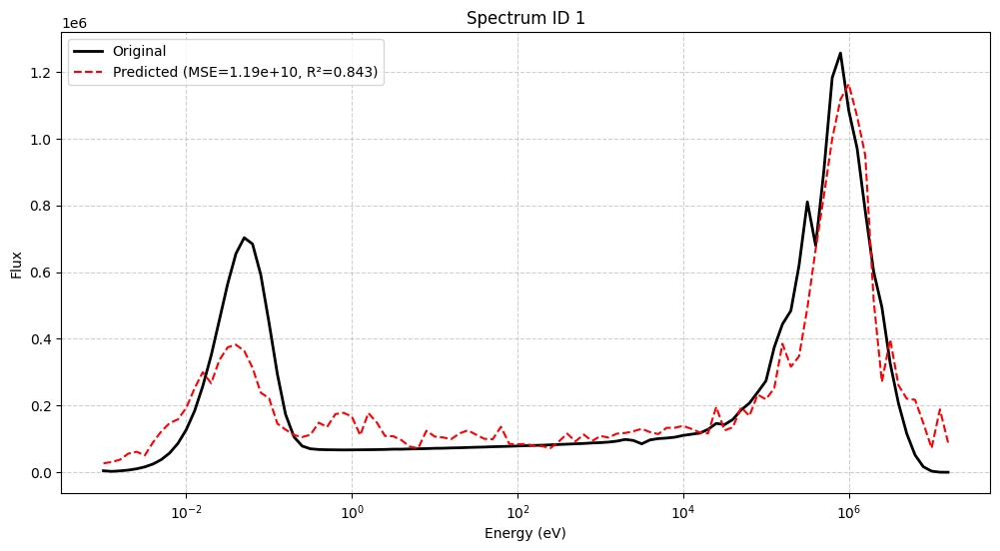

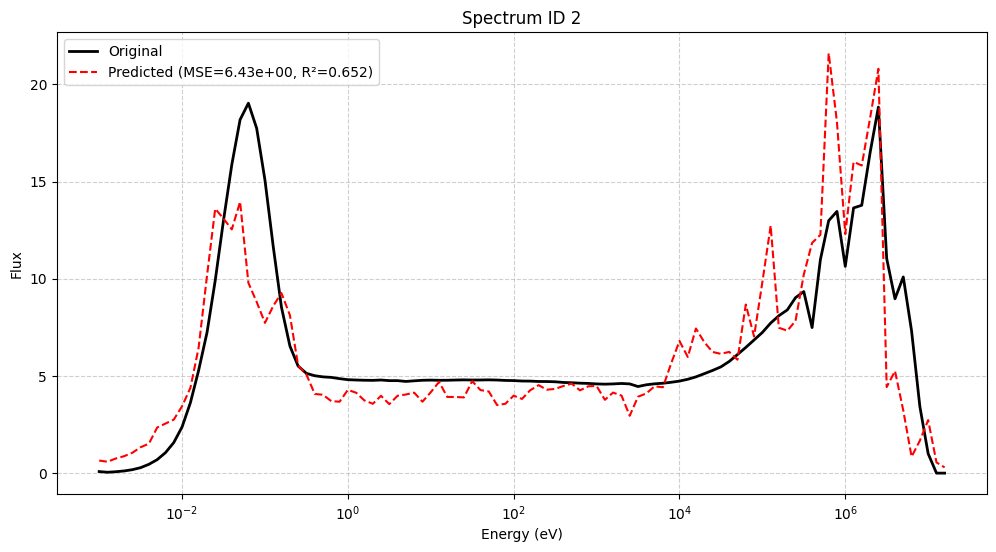

✅ Results saved to fluence_results.csv


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor

# --------------------------
# 1) LOAD TRAINING DATA
# --------------------------
train_df = pd.read_csv("/content/complete_dataset.csv")
spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

remove_ids = {5,6,7,37,95,16,17,18,19,20,24,36,46,47,51,53,54,55,56,
              70,74,75,76,77,84,86,87,94,96,102,107,112}
train_df = train_df[~train_df["spectrum_id"].isin(remove_ids)].copy()

train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAINING HELPERS
# --------------------------
def train_multioutput(model_class, X, Y, **kwargs):
    models = []
    for j in range(Y.shape[1]):
        model = model_class(**kwargs)
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

# --------------------------
# 3) TRAIN MODEL
# --------------------------
print("🔧 Training Gradient Boosting...")
gb_models = train_multioutput(
    GradientBoostingRegressor,
    X_train, Y_train,
    n_estimators=300, max_depth=6, learning_rate=0.05
)
print("✅ Training complete.")

# --------------------------
# 4) LOAD TEST DATA
# --------------------------
test_df = pd.read_csv("/content/Test_Dataset_modified.csv")
test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")
test_df = test_df[~test_df["spectrum_id"].isin(remove_ids)].copy()

ctotal = test_df[count_cols].sum(axis=1)
ctotal[ctotal == 0] = 1
stotal = test_df[spectrum_cols].sum(axis=1)
stotal[stotal == 0] = 1

test_df[count_cols] = test_df[count_cols].div(ctotal, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(stotal, axis=0)

# --------------------------
# 5) ENERGY BINS
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

bin_widths = np.diff(energy_bins)
energy_centers = (energy_bins[:-1] + energy_bins[1:]) / 2

# --------------------------
# 6) FUNCTIONS FOR FLUENCE
# --------------------------
def integrate_region(energy_centers, spectrum, bin_widths, region):
    """Integrate spectrum over specified energy region."""
    if region == "thermal":
        mask = energy_centers < 0.4
    elif region == "epithermal":
        mask = (energy_centers >= 0.4) & (energy_centers < 1e5)
    elif region == "fast":
        mask = energy_centers >= 1e5
    elif region == "total":
        mask = np.ones_like(energy_centers, dtype=bool)  # all bins
    else:
        raise ValueError("Region must be thermal, epithermal, fast, or total")
    return np.sum(spectrum[mask] * bin_widths[mask])

# --------------------------
# 7) PREDICT, PLOT & EVALUATE
# --------------------------
results = []

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true_norm = row[spectrum_cols].values
    y_pred_norm = predict_multioutput(gb_models, x_test)[0]

    spectrum_total = stotal.iloc[idx]
    y_true_actual = y_true_norm * spectrum_total
    y_pred_actual = y_pred_norm * spectrum_total

    mse = mean_squared_error(y_true_actual, y_pred_actual)
    r2 = r2_score(y_true_actual, y_pred_actual)

    # Integrals in 3 regions + total
    regions = ["thermal", "epithermal", "fast", "total"]
    row_res = {"spectrum_id": row["spectrum_id"], "MSE": mse, "R2": r2}

    for region in regions:
        phi_true = integrate_region(energy_centers, y_true_actual[:-1], bin_widths, region)
        phi_pred = integrate_region(energy_centers, y_pred_actual[:-1], bin_widths, region)
        rel_diff = 100 * (phi_pred - phi_true) / (phi_true if phi_true != 0 else 1)
        row_res[f"{region}_true"] = phi_true
        row_res[f"{region}_pred"] = phi_pred
        row_res[f"{region}_reldiff(%)"] = rel_diff

    results.append(row_res)

    # Plot spectrum
    plt.figure(figsize=(12, 6))
    plt.semilogx(energy_bins[:-1], y_true_actual[:-1], label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins[:-1], y_pred_actual[:-1], linestyle="--",
                 label=f"Predicted (MSE={mse:.2e}, R²={r2:.3f})", color='red')
    plt.xlabel("Energy (eV)")
    plt.ylabel("Flux")
    plt.title(f"Spectrum ID {row['spectrum_id']}")
    plt.legend()
    plt.grid(True, which="both", ls="--", alpha=0.6)
    plt.show()

# --------------------------
# 8) SAVE RESULTS
# --------------------------
results_df = pd.DataFrame(results)
results_df.to_csv("fluence_results.csv", index=False)
print("✅ Results saved to fluence_results.csv")


🔧 Training XGBoost (no augmentation)...
✅ Model trained successfully.
Number of spectrum bins = 104
thermal: 27 bins
epithermal: 53 bins
fast: 24 bins
total: 104 bins


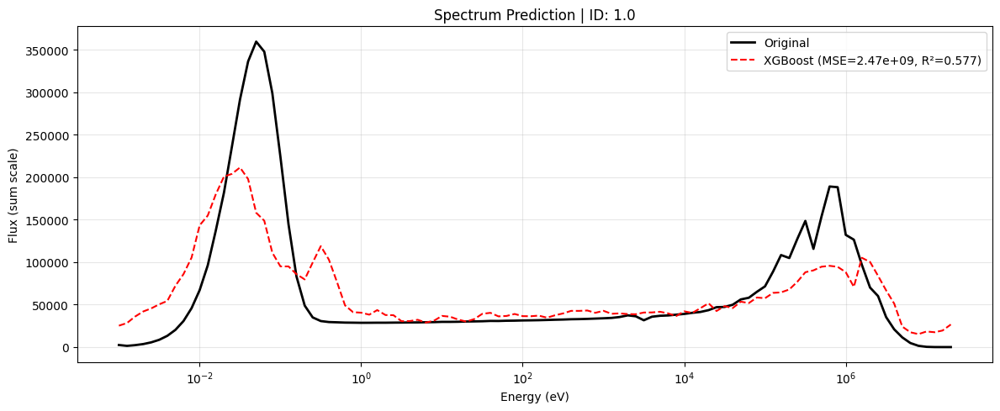

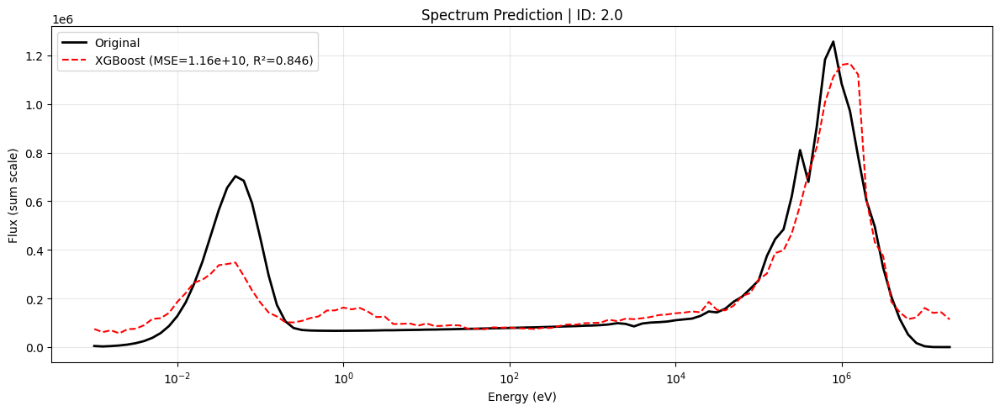

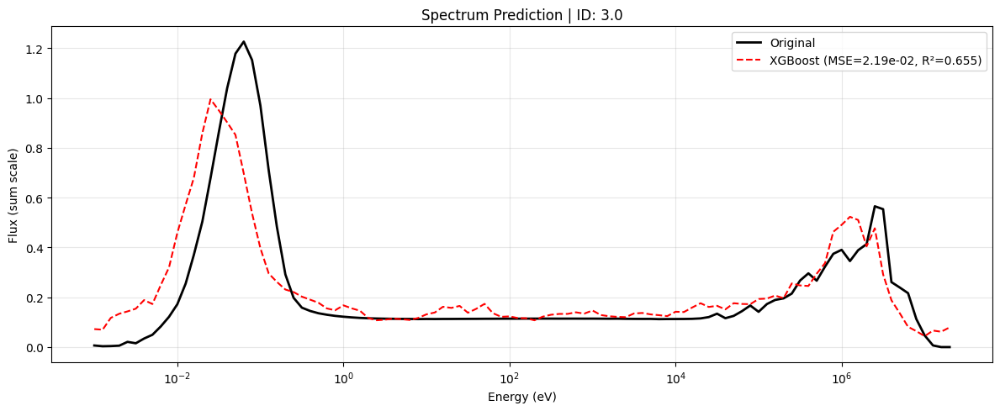

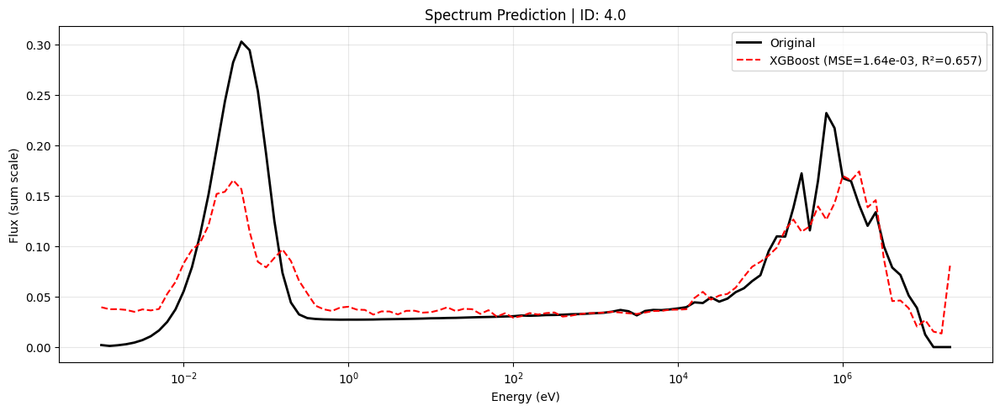

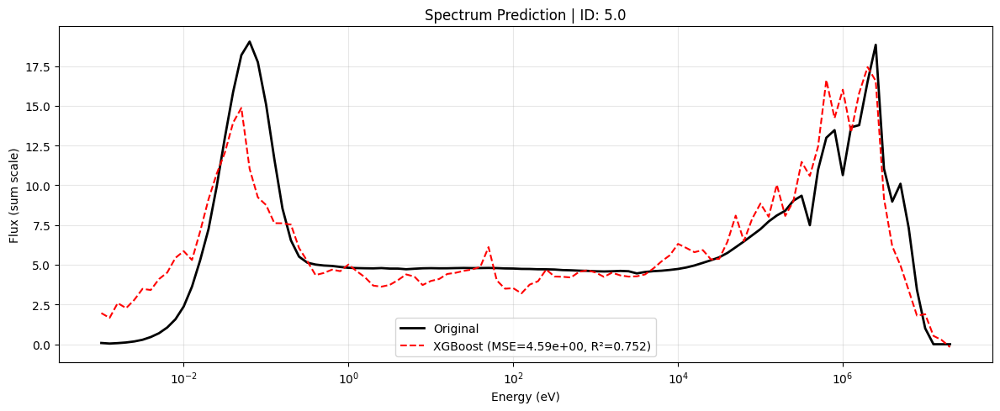

✅ Results saved to xgb_sums_results.csv


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
# Note: You'll need to replace the file paths with the actual location of your data.
try:
    train_df = pd.read_csv("complete_dataset.csv")
except FileNotFoundError:
    print("Error: 'complete_dataset.csv' not found. Please check the file path.")
    # Create dummy data to allow the script to run for demonstration
    print("Creating dummy training data...")
    num_samples_train = 100
    num_counts = 50
    num_spectrum = 104
    train_df = pd.DataFrame(np.random.rand(num_samples_train, num_counts + num_spectrum))
    train_df.columns = [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]


spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODEL (NO AUGMENTATION)
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8,
            tree_method="hist", n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training XGBoost (no augmentation)...")
xgb_models = train_xgb_multioutput(X_train, Y_train)
print("✅ Model trained successfully.")

# --------------------------
# 3) LOAD TEST DATA + NORMALIZE
# --------------------------
try:
    test_df = pd.read_csv("Test_Dataset_modified.csv")
except FileNotFoundError:
    print("Error: 'Test_Dataset_modified.csv' not found. Please check the file path.")
    # Create dummy data to allow the script to run for demonstration
    print("Creating dummy test data...")
    num_samples_test = 10
    test_df = pd.DataFrame(np.random.rand(num_samples_test, num_counts + num_spectrum + 1))
    test_df.columns = ["spectrum_id"] + [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]
    test_df["spectrum_id"] = [f"test_{i}" for i in range(num_samples_test)]


test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)

# --------------------------
# 4) ENERGY BINS (CORRECTED)
# --------------------------
bin_edges = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

# FIX 1: Correctly define n_bins. It should be the length of the energy points array.
n_bins = len(bin_edges) # This is 104, matching the number of spectrum columns.
print(f"Number of spectrum bins = {n_bins}")

# FIX 2: Define masks with length 104 by using the full `bin_edges` array.
thermal_mask    = bin_edges < 0.4
epithermal_mask = (bin_edges >= 0.4) & (bin_edges < 1e5)
fast_mask       = bin_edges >= 1e5
total_mask      = np.ones(n_bins, dtype=bool)

region_masks = {
    "thermal": thermal_mask,
    "epithermal": epithermal_mask,
    "fast": fast_mask,
    "total": total_mask,
}

# print region bin counts to confirm
for region, mask in region_masks.items():
    print(f"{region}: {np.sum(mask)} bins")


# --------------------------
# 5) PREDICT + EVALUATE (CORRECTED)
# --------------------------
results = []

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true_norm = row[spectrum_cols].values
    y_pred_norm = predict_xgb_multioutput(xgb_models, x_test)[0]

    # Restore actual values
    spectrum_total = test_spectrum_total.iloc[idx]
    y_true_actual = y_true_norm * spectrum_total
    y_pred_actual = y_pred_norm * spectrum_total

    mse = mean_squared_error(y_true_actual, y_pred_actual)
    r2 = r2_score(y_true_actual, y_pred_actual)

    # Compute sums in regions
    row_res = {"spectrum_id": row["spectrum_id"], "MSE": mse, "R2": r2}
    for region, mask in region_masks.items():
        # This will now work correctly as len(mask) == len(y_true_actual)
        phi_true_sum = np.sum(y_true_actual[mask])
        phi_pred_sum = np.sum(y_pred_actual[mask])
        rel_diff_sum = 100 * (phi_pred_sum - phi_true_sum) / (phi_true_sum if phi_true_sum != 0 else 1)

        row_res[f"{region}_sum_true"] = phi_true_sum
        row_res[f"{region}_sum_pred"] = phi_pred_sum
        row_res[f"{region}_sum_reldiff(%)"] = rel_diff_sum

    results.append(row_res)

    # Plot spectrum comparison
    plt.figure(figsize=(12, 5))
    # FIX 3: Use the full `bin_edges` array for plotting.
    plt.semilogx(bin_edges, y_true_actual, label="Original", color="black", linewidth=2)
    plt.semilogx(bin_edges, y_pred_actual, linestyle="--",
                 label=f"XGBoost (MSE={mse:.2e}, R²={r2:.3f})", color="red")
    plt.title(f"Spectrum Prediction | ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Flux (sum scale)")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()

# --------------------------
# 6) SAVE RESULTS
# --------------------------
results_df = pd.DataFrame(results)
results_df.to_csv("xgb_sums_results.csv", index=False)
print("✅ Results saved to xgb_sums_results.csv")

train Data 87
test Data 10
🔧 Training Gradient Boosting...
✅ Training complete.


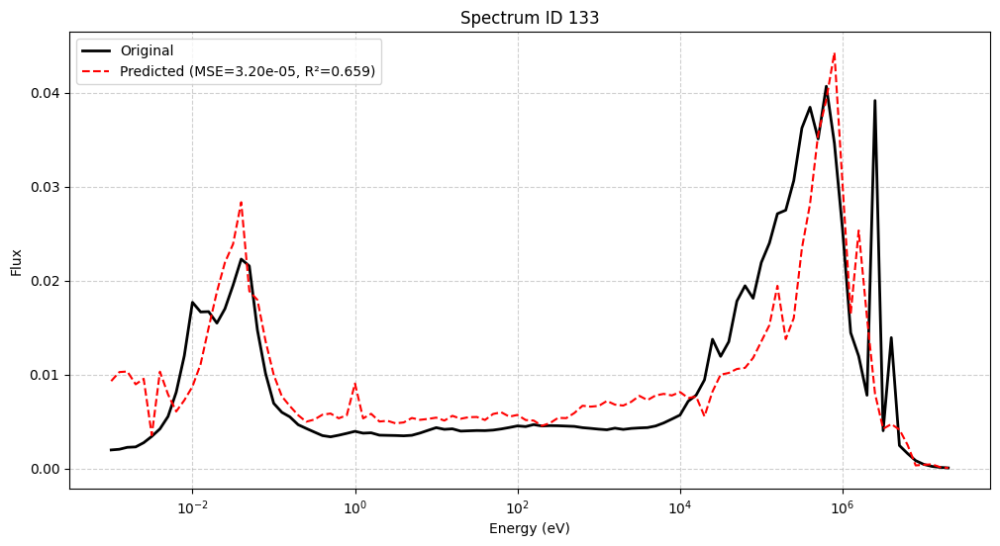

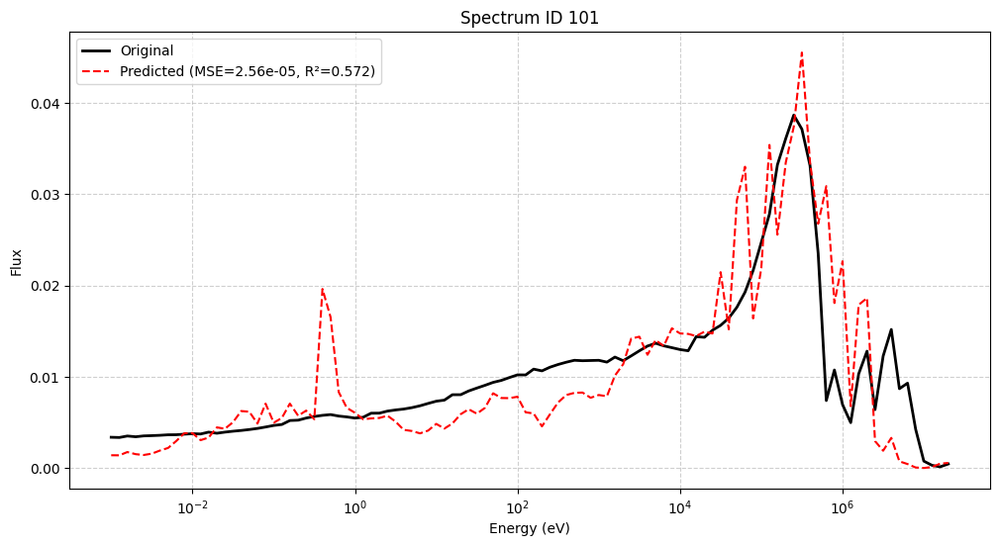

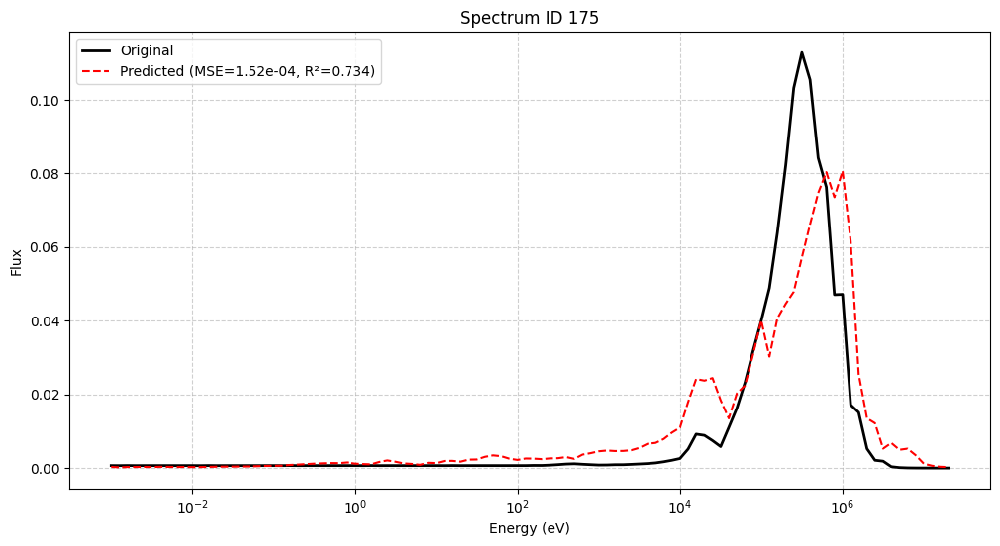

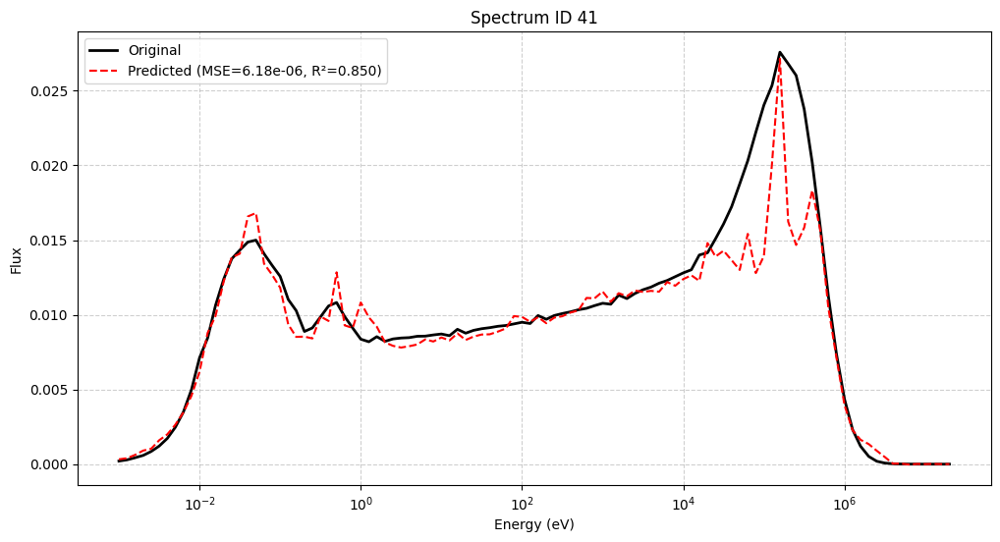

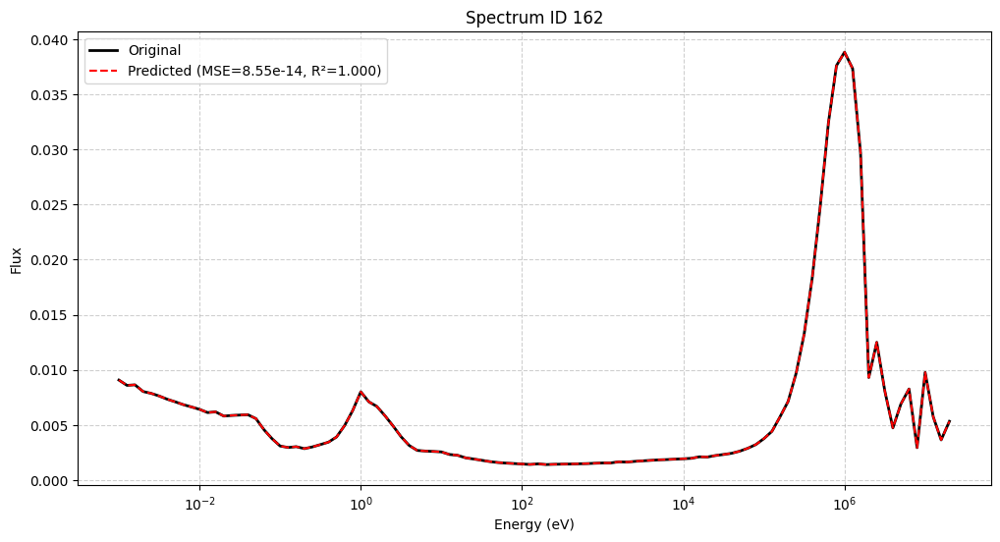

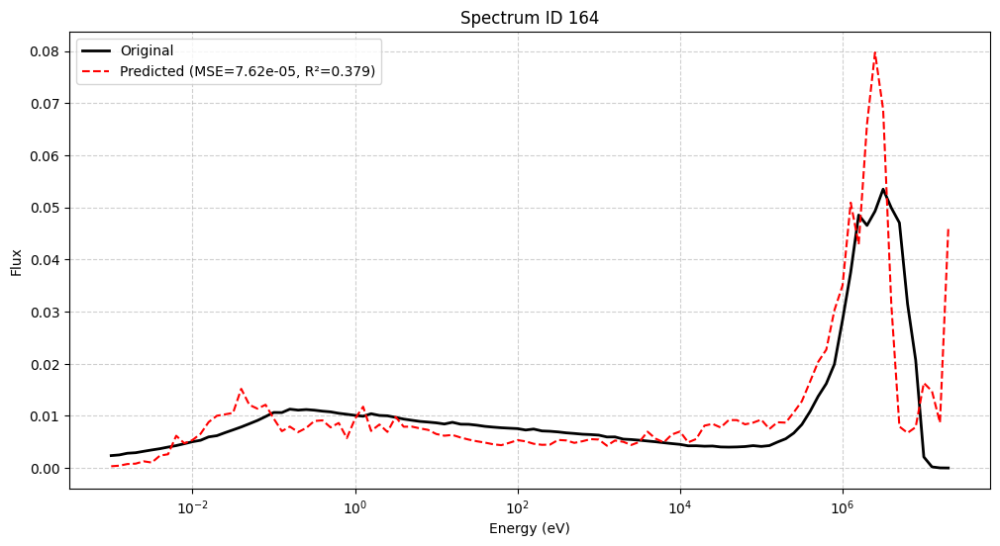

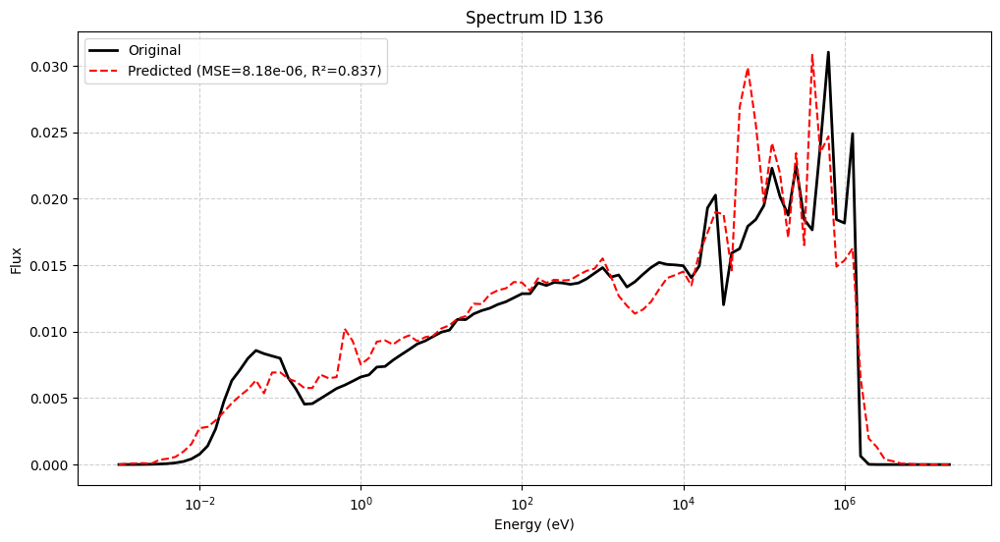

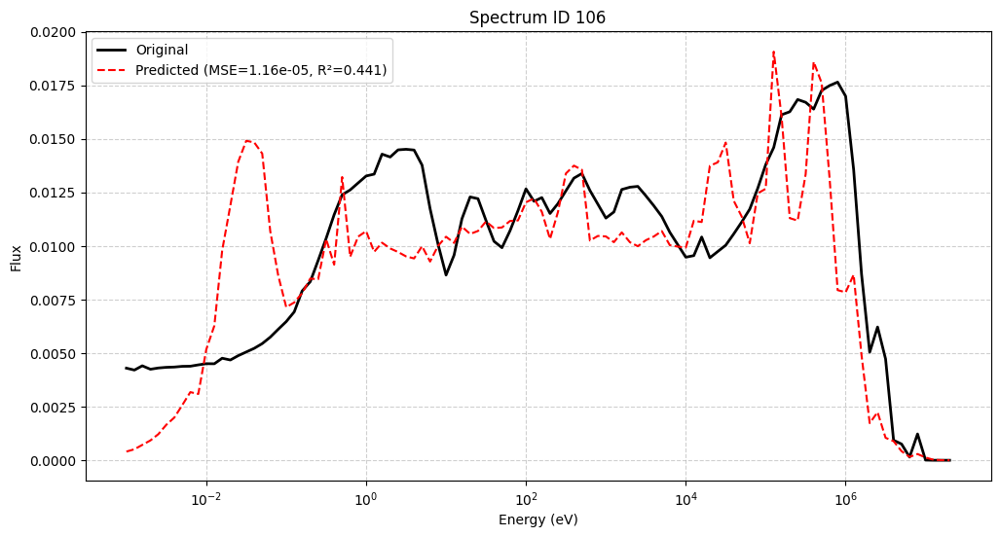

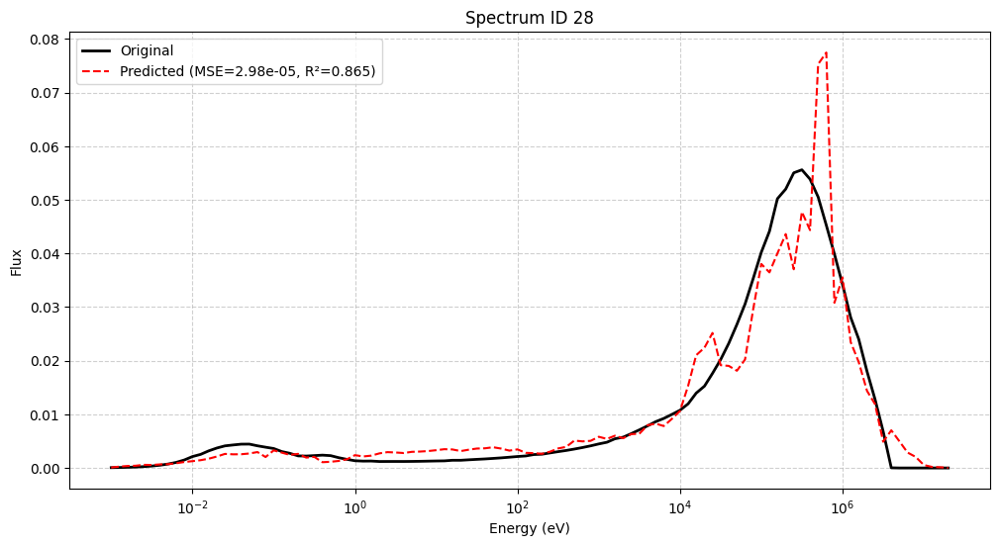

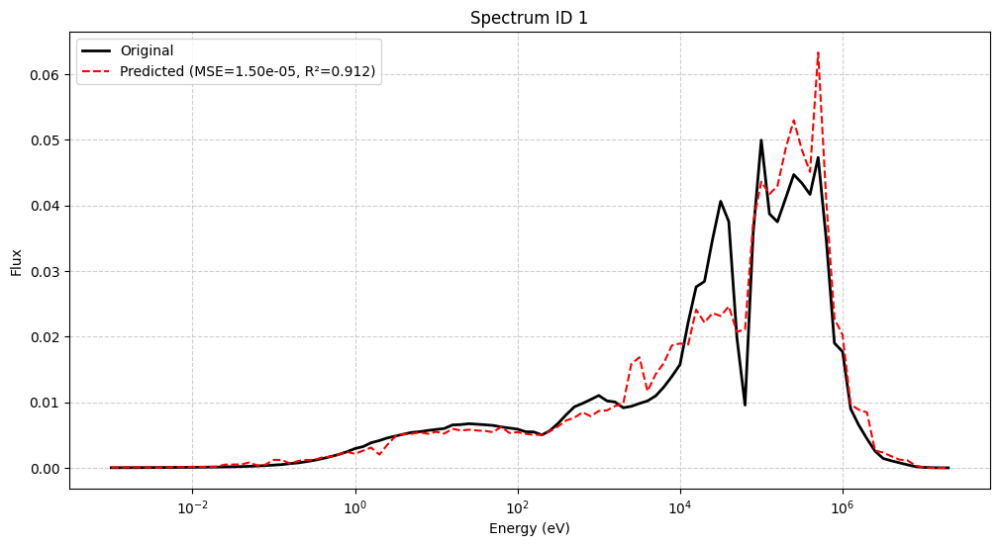

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split

# --------------------------
# 1) LOAD & CLEAN DATA
# --------------------------
df = pd.read_csv("/content/complete_dataset.csv")
spectrum_cols = [c for c in df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in df.columns if c.startswith("count_")]
df[spectrum_cols] = df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

remove_ids = {5,6,7,37,95,16,17,18,19,20,24,36,46,47,51,53,54,55,56,
              70,74,75,76,77,84,86,87,94,96,102,107,112,8,13,14,15,21,22,23,33,34,35,48,49,50,52,57,58,68,71,72,73,78,79,81,82,89,90,91,92,104,105,111,113,114,148,155,159,179,27,85,110,121,134,150,146,147,149,156,157,165}
df = df[~df["spectrum_id"].isin(remove_ids)].copy()

# Normalization
counts_total = df[count_cols].sum(axis=1)
counts_total[counts_total == 0] = 1
spectrum_total = df[spectrum_cols].sum(axis=1)
spectrum_total[spectrum_total == 0] = 1

df[count_cols] = df[count_cols].div(counts_total, axis=0)
df[spectrum_cols] = df[spectrum_cols].div(spectrum_total, axis=0)

# --------------------------
# 2) SPLIT DATA 80/20
# --------------------------
X = df[count_cols].values
Y = df[spectrum_cols].values
ids = df["spectrum_id"].values
stotals = spectrum_total.values

X_train, X_test, Y_train, Y_test, ids_train, ids_test, stotals_train, stotals_test = train_test_split(
    X, Y, ids, stotals, test_size=0.1, random_state=42
)
print(f"train Data {len(X_train)}")
print(f"test Data {len(X_test)}")

# --------------------------
# 3) MULTIOUTPUT TRAINING
# --------------------------
def train_multioutput(model_class, X, Y, **kwargs):
    models = []
    for j in range(Y.shape[1]):
        model = model_class(**kwargs)
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training Gradient Boosting...")
gb_models = train_multioutput(
    GradientBoostingRegressor,
    X_train, Y_train,
    n_estimators=300, max_depth=6, learning_rate=0.05
)
print("✅ Training complete.")

# --------------------------
# 4) ENERGY BINS
# --------------------------
energy_bins = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

# --------------------------
# 5) PREDICT & EVALUATE
# --------------------------
results = []

for i in range(len(X_test)):
    x_test = X_test[i].reshape(1, -1)
    y_true_norm = Y_test[i]
    y_pred_norm = predict_multioutput(gb_models, x_test)[0]

    spectrum_total = stotals_test[i]
    y_true_actual = y_true_norm * spectrum_total
    y_pred_actual = y_pred_norm * spectrum_total

    mse = mean_squared_error(y_true_actual, y_pred_actual)
    r2 = r2_score(y_true_actual, y_pred_actual)

    row_res = {"spectrum_id": ids_test[i], "MSE": mse, "R2": r2}
    results.append(row_res)

    # Plot spectrum
    # Plot spectrum
    plt.figure(figsize=(12, 6))
    plt.semilogx(energy_bins[:], y_true_actual, label="Original", color="black", linewidth=2)
    plt.semilogx(energy_bins[:], y_pred_actual, linestyle="--",
                label=f"Predicted (MSE={mse:.2e}, R²={r2:.3f})", color='red')
    plt.xlabel("Energy (eV)")
    plt.ylabel("Flux")
    plt.title(f"Spectrum ID {ids_test[i]}")
    plt.legend()
    plt.grid(True, which="both", ls="--", alpha=0.6)
    plt.show()





In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# -----------------------
# Load dataset
# -----------------------
df = pd.read_csv("/content/complete_dataset.csv")

remove_ids = {5,6,7,37,95,16,17,18,19,20,24,36,46,47,51,53,54,55,56,
              70,74,75,76,77,84,86,87,94,96,102,107,112,8,13,14,15,21,22,23,33,34,35,48,49,50,52,57,58,68,71,72,73,78,79,81,82,89,90,91,92,104,105,111,113,114,148,155,159,179,27,85,110,121,134,150,146,147,149,156,157,165}
df = df[~df["spectrum_id"].isin(remove_ids)].copy()

# Spectrum columns
spectrum_cols = [f"spectrum_value_{i}" for i in range(1, 105)]
y = df[spectrum_cols].values

spectrum_ids=df['spectrum_id']

# Energy bins (same as your original code)
energy_bins = np.array([
    1.00E-03, 1.26E-03, 1.58E-03, 2.00E-03, 2.51E-03, 3.16E-03, 3.98E-03, 5.01E-03, 6.31E-03, 7.94E-03,
    1.00E-02, 1.26E-02, 1.58E-02, 2.00E-02, 2.51E-02, 3.16E-02, 3.98E-02, 5.01E-02, 6.31E-02, 7.94E-02,
    1.00E-01, 1.26E-01, 1.58E-01, 2.00E-01, 2.51E-01, 3.16E-01, 3.98E-01, 5.01E-01, 6.31E-01, 7.94E-01,
    1.00E+00, 1.26E+00, 1.58E+00, 2.00E+00, 2.51E+00, 3.16E+00, 3.98E+00, 5.01E+00, 6.31E+00, 7.94E+00,
    1.00E+01, 1.26E+01, 1.58E+01, 2.00E+01, 2.51E+01, 3.16E+01, 3.98E+01, 5.01E+01, 6.31E+01, 7.94E+01,
    1.00E+02, 1.26E+02, 1.58E+02, 2.00E+02, 2.51E+02, 3.16E+02, 3.98E+02, 5.01E+02, 6.31E+02, 7.94E+02,
    1.00E+03, 1.26E+03, 1.58E+03, 2.00E+03, 2.51E+03, 3.16E+03, 3.98E+03, 5.01E+03, 6.31E+03, 7.94E+03,
    1.00E+04, 1.26E+04, 1.58E+04, 2.00E+04, 2.51E+04, 3.16E+04, 3.98E+04, 5.01E+04, 6.31E+04, 7.94E+04,
    1.00E+05, 1.26E+05, 1.58E+05, 2.00E+05, 2.51E+05, 3.16E+05, 3.98E+05, 5.01E+05, 6.31E+05, 7.94E+05,
    1.00E+06, 1.26E+06, 1.58E+06, 2.00E+06, 2.51E+06, 3.16E+06, 3.98E+06, 5.01E+06, 6.31E+06, 7.94E+06,
    1.00E+07, 1.26E+07, 1.58E+07, 2.00E+07
])

n_samples_to_plot = len(y)

# Create figure with one subplot per sample
fig, axes = plt.subplots(n_samples_to_plot, 1, figsize=(12, 3 * n_samples_to_plot))

if n_samples_to_plot == 1:
    axes = np.array([axes])  # ensure array-like for indexing

for i in range(n_samples_to_plot):
    y_true = y[i]
    ax = axes[i]

    ax.plot(energy_bins, y_true, 'k-', linewidth=2)
    ax.set_xscale("log")
    ax.set_ylabel("Spectrum Value")
    ax.set_title(f"id: {spectrum_ids.iloc[i]}")  # <-- FIXED
    ax.grid(True, which="both", alpha=0.3)


plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

# The Website Thing

🔧 Training XGBoost (no augmentation)...
✅ Model trained successfully.
💾 Trained model saved to xgb_models.pkl
Number of spectrum bins = 104
thermal: 27 bins
epithermal: 53 bins
fast: 24 bins
total: 104 bins


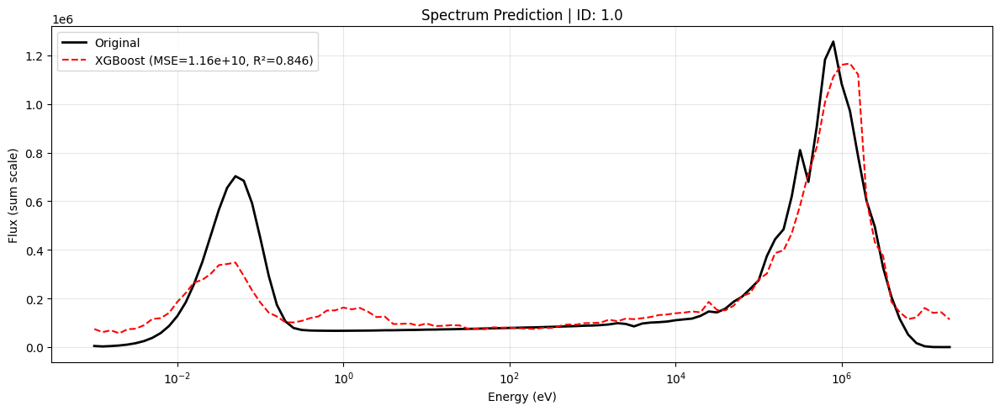

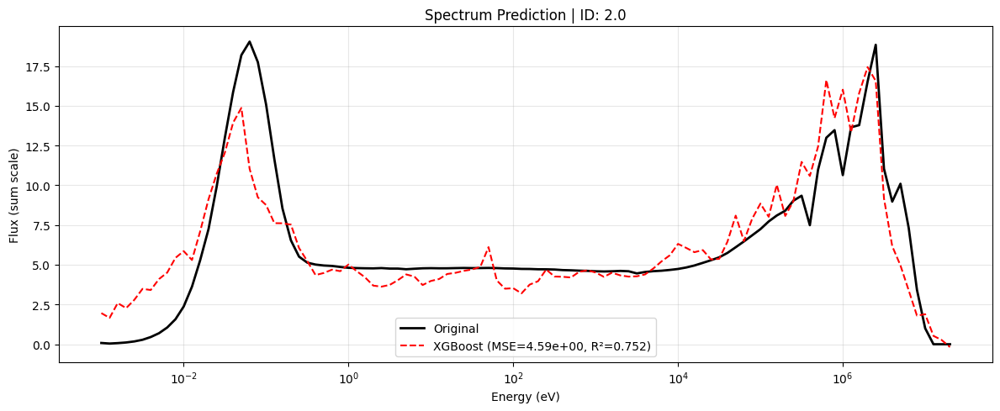

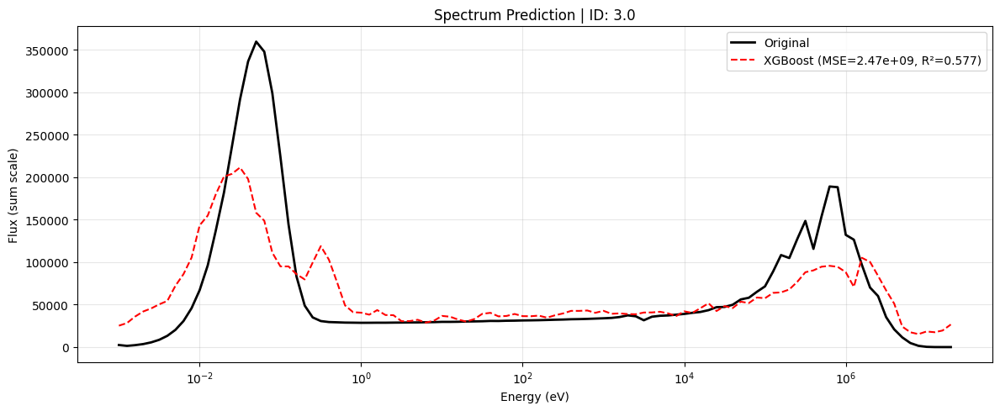

✅ Results saved to xgb_sums_results.csv
✅ Predicted spectra saved to xgb_predicted_spectra.csv


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle  # NEW
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
try:
    train_df = pd.read_csv("complete_dataset.csv")
except FileNotFoundError:
    print("Error: 'complete_dataset.csv' not found. Please check the file path.")
    print("Creating dummy training data...")
    num_samples_train = 100
    num_counts = 50
    num_spectrum = 104
    train_df = pd.DataFrame(np.random.rand(num_samples_train, num_counts + num_spectrum))
    train_df.columns = [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]

spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# --------------------------
# 2) TRAIN MODEL (NO AUGMENTATION)
# --------------------------
def train_xgb_multioutput(X, Y):
    models = []
    for j in range(Y.shape[1]):
        model = XGBRegressor(
            n_estimators=300, max_depth=6, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8,
            tree_method="hist", n_jobs=-1, verbosity=0
        )
        model.fit(X, Y[:, j])
        models.append(model)
    return models

def predict_xgb_multioutput(models, X):
    preds = [model.predict(X) for model in models]
    return np.column_stack(preds)

print("🔧 Training XGBoost (no augmentation)...")
xgb_models = train_xgb_multioutput(X_train, Y_train)
print("✅ Model trained successfully.")

# NEW: Save trained models to pkl
with open("xgb_models.pkl", "wb") as f:
    pickle.dump(xgb_models, f)
print("💾 Trained model saved to xgb_models.pkl")

# --------------------------
# 3) LOAD TEST DATA + NORMALIZE
# --------------------------
try:
    test_df = pd.read_csv("Test_Dataset_modified.csv")
except FileNotFoundError:
    print("Error: 'Test_Dataset_modified.csv' not found. Please check the file path.")
    print("Creating dummy test data...")
    num_samples_test = 10
    test_df = pd.DataFrame(np.random.rand(num_samples_test, num_counts + num_spectrum + 1))
    test_df.columns = ["spectrum_id"] + [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]
    test_df["spectrum_id"] = [f"test_{i}" for i in range(num_samples_test)]

test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)

# --------------------------
# 4) ENERGY BINS (CORRECTED)
# --------------------------
bin_edges = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])
n_bins = len(bin_edges)  # 104
print(f"Number of spectrum bins = {n_bins}")

thermal_mask    = bin_edges < 0.4
epithermal_mask = (bin_edges >= 0.4) & (bin_edges < 1e5)
fast_mask       = bin_edges >= 1e5
total_mask      = np.ones(n_bins, dtype=bool)

region_masks = {
    "thermal": thermal_mask,
    "epithermal": epithermal_mask,
    "fast": fast_mask,
    "total": total_mask,
}

for region, mask in region_masks.items():
    print(f"{region}: {np.sum(mask)} bins")

# --------------------------
# 5) PREDICT + EVALUATE
# --------------------------
results = []
predicted_spectra = []  # NEW: store full predicted spectra

for idx, row in test_df.iterrows():
    x_test = row[count_cols].values.reshape(1, -1)
    y_true_norm = row[spectrum_cols].values
    y_pred_norm = predict_xgb_multioutput(xgb_models, x_test)[0]

    spectrum_total = test_spectrum_total.iloc[idx]
    y_true_actual = y_true_norm * spectrum_total
    y_pred_actual = y_pred_norm * spectrum_total

    mse = mean_squared_error(y_true_actual, y_pred_actual)
    r2 = r2_score(y_true_actual, y_pred_actual)

    row_res = {"spectrum_id": row["spectrum_id"], "MSE": mse, "R2": r2}
    for region, mask in region_masks.items():
        phi_true_sum = np.sum(y_true_actual[mask])
        phi_pred_sum = np.sum(y_pred_actual[mask])
        rel_diff_sum = 100 * (phi_pred_sum - phi_true_sum) / (phi_true_sum if phi_true_sum != 0 else 1)

        row_res[f"{region}_sum_true"] = phi_true_sum
        row_res[f"{region}_sum_pred"] = phi_pred_sum
        row_res[f"{region}_sum_reldiff(%)"] = rel_diff_sum

    results.append(row_res)

    # NEW: save predicted spectrum with ID
    pred_dict = {"spectrum_id": row["spectrum_id"]}
    for j, val in enumerate(y_pred_actual):
        pred_dict[f"spectrum_value_{j}"] = val
    predicted_spectra.append(pred_dict)

    # Plot spectrum
    plt.figure(figsize=(12, 5))
    plt.semilogx(bin_edges, y_true_actual, label="Original", color="black", linewidth=2)
    plt.semilogx(bin_edges, y_pred_actual, linestyle="--",
                 label=f"XGBoost (MSE={mse:.2e}, R²={r2:.3f})", color="red")
    plt.title(f"Spectrum Prediction | ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Flux (sum scale)")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()

# --------------------------
# 6) SAVE RESULTS
# --------------------------
results_df = pd.DataFrame(results)
results_df.to_csv("xgb_sums_results.csv", index=False)
print("✅ Results saved to xgb_sums_results.csv")

# NEW: Save predicted spectra to CSV
predicted_spectra_df = pd.DataFrame(predicted_spectra)
predicted_spectra_df.to_csv("xgb_predicted_spectra.csv", index=False)
print("✅ Predicted spectra saved to xgb_predicted_spectra.csv")


In [ ]:
import numpy as np
import pandas as pd
from xgboost import XGBRegressor
import os
import zipfile

# --------------------------
# 1) LOAD DATA
# --------------------------
try:
    df = pd.read_csv("complete_dataset.csv")
except FileNotFoundError:
    print("⚠️ complete_dataset.csv not found. Using dummy data...")
    num_samples = 200
    num_counts = 50
    num_spectrum = 104
    df = pd.DataFrame(np.random.rand(num_samples, num_counts + num_spectrum))
    df.columns = [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]

spectrum_cols = [c for c in df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in df.columns if c.startswith("count_")]

# --------------------------
# 2) NORMALIZE
# --------------------------
df[spectrum_cols] = df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

counts_total = df[count_cols].sum(axis=1)
counts_total[counts_total == 0] = 1
spectrum_total = df[spectrum_cols].sum(axis=1)
spectrum_total[spectrum_total == 0] = 1

df[count_cols] = df[count_cols].div(counts_total, axis=0)
df[spectrum_cols] = df[spectrum_cols].div(spectrum_total, axis=0)

X = df[count_cols].values
Y = df[spectrum_cols].values

# --------------------------
# 3) TRAIN MODELS
# --------------------------
os.makedirs("models", exist_ok=True)
models = []

for j in range(Y.shape[1]):
    print(f"🔧 Training model for spectrum bin {j+1}/{Y.shape[1]}...")
    model = XGBRegressor(
        n_estimators=300,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        tree_method="hist",
        n_jobs=-1,
        verbosity=0
    )
    model.fit(X, Y[:, j])

    # Save model
    model_path = f"models/xgb_model_{j}.json"
    model.save_model(model_path)
    models.append(model)

print(f"✅ Training complete. {len(models)} models saved in /models folder.")

# --------------------------
# 4) ZIP MODELS
# --------------------------
zip_filename = "xgb_models.zip"
with zipfile.ZipFile(zip_filename, "w") as zipf:
    for j in range(len(models)):
        file_path = f"models/xgb_model_{j}.json"
        zipf.write(file_path, os.path.basename(file_path))

print(f"📦 All models zipped into {zip_filename}")


🔧 Training model for spectrum bin 1/104...
🔧 Training model for spectrum bin 2/104...
🔧 Training model for spectrum bin 3/104...
🔧 Training model for spectrum bin 4/104...
🔧 Training model for spectrum bin 5/104...
🔧 Training model for spectrum bin 6/104...
🔧 Training model for spectrum bin 7/104...
🔧 Training model for spectrum bin 8/104...
🔧 Training model for spectrum bin 9/104...
🔧 Training model for spectrum bin 10/104...
🔧 Training model for spectrum bin 11/104...
🔧 Training model for spectrum bin 12/104...
🔧 Training model for spectrum bin 13/104...
🔧 Training model for spectrum bin 14/104...
🔧 Training model for spectrum bin 15/104...
🔧 Training model for spectrum bin 16/104...
🔧 Training model for spectrum bin 17/104...
🔧 Training model for spectrum bin 18/104...
🔧 Training model for spectrum bin 19/104...
🔧 Training model for spectrum bin 20/104...
🔧 Training model for spectrum bin 21/104...
🔧 Training model for spectrum bin 22/104...
🔧 Training model for spectrum bin 23/104.

#ANN

Training data shape: X=(178, 12), Y=(178, 104)
🔧 Training Neural Network...
Using device: cuda
Epoch [50/500], Loss: 0.448748
Epoch [100/500], Loss: 0.492444
Epoch [150/500], Loss: 0.365756
Epoch [200/500], Loss: 0.371455
Epoch [250/500], Loss: 0.393625
Epoch [300/500], Loss: 0.313456
Epoch [350/500], Loss: 0.322092
Epoch [400/500], Loss: 0.307456
Epoch [450/500], Loss: 0.316243
Epoch [500/500], Loss: 0.297968
Training complete. Final loss: 0.297968
✅ Neural Network trained successfully.


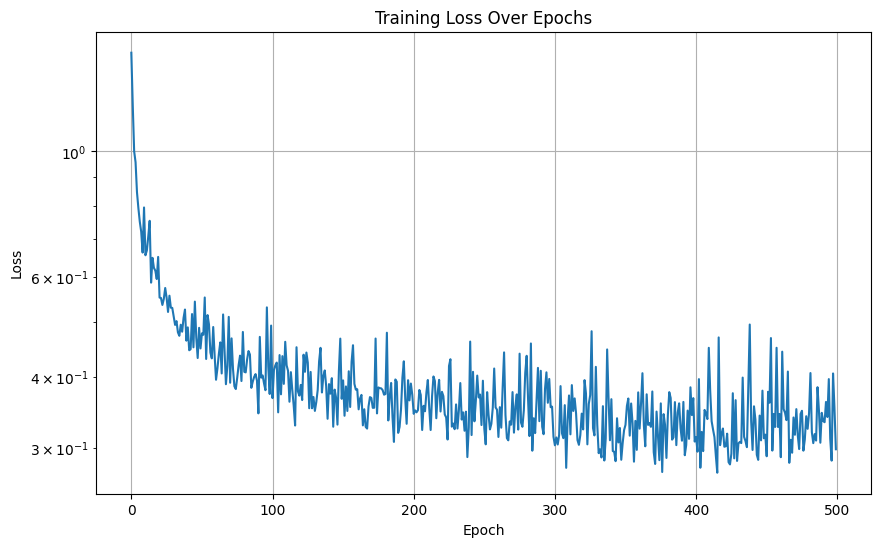

Number of spectrum bins = 104
thermal: 27 bins
epithermal: 53 bins
fast: 24 bins
total: 104 bins


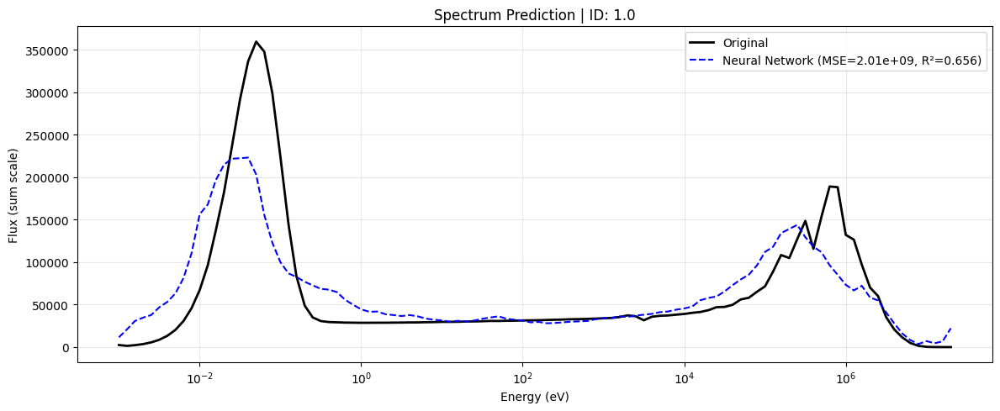

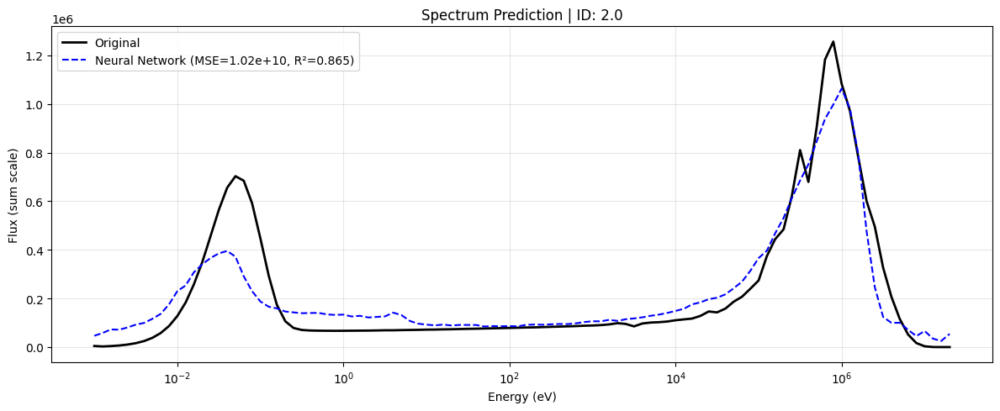

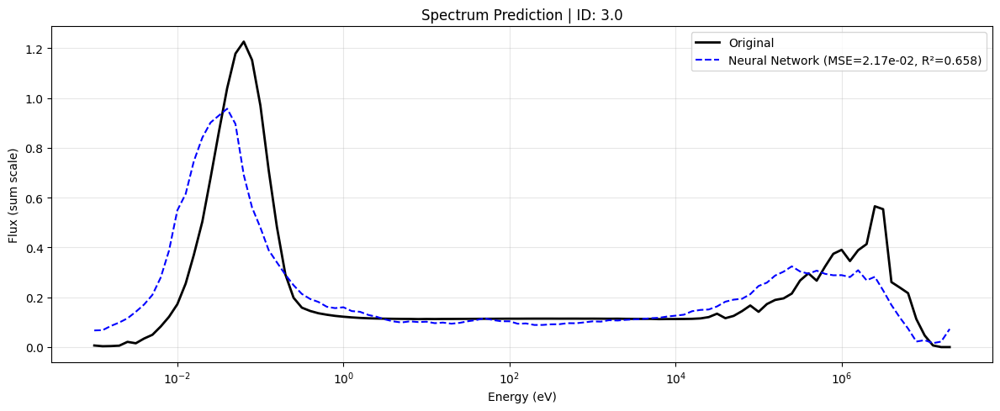

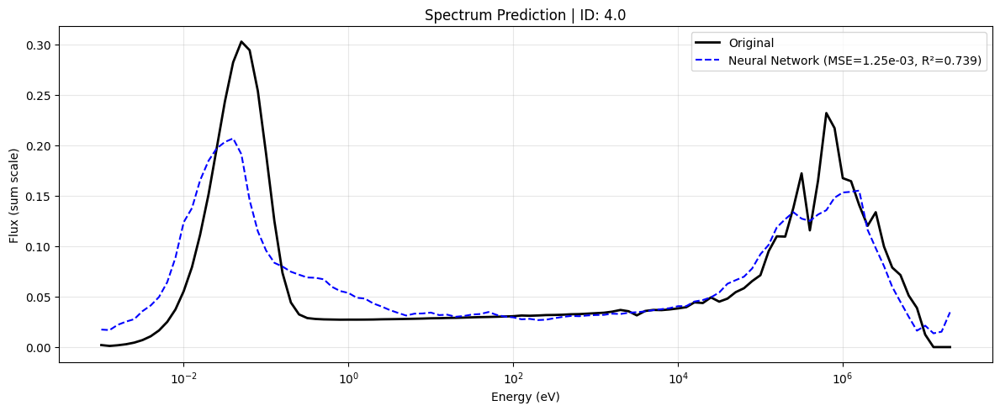

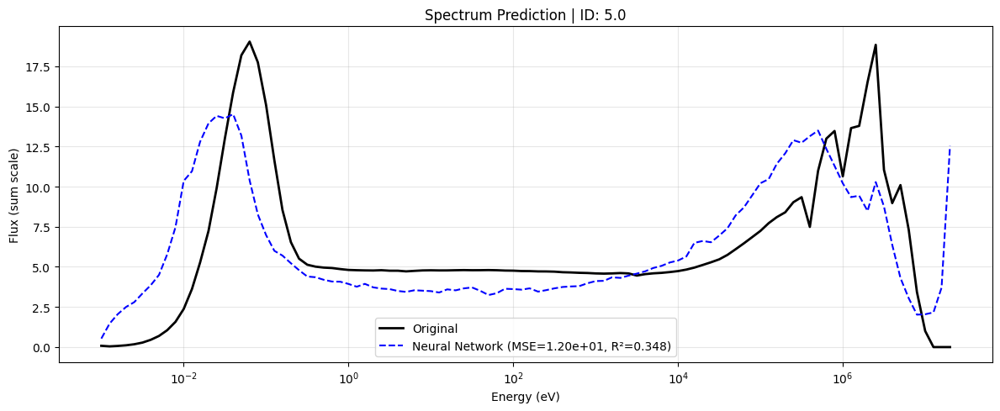

✅ Results saved to nn_results.csv

📊 Summary Statistics:
Mean R²: 0.6532 ± 0.1907
Mean MSE: 2.44e+09 ± 4.43e+09

Regional Prediction Accuracy (Mean Relative Difference %):
Thermal: -0.12% ± 10.13%
Epithermal: 13.56% ± 16.71%
Fast: -8.68% ± 6.14%
Total: 0.24% ± 0.13%


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
import torch.nn.functional as F

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

# --------------------------
# 1) LOAD TRAINING DATA + NORMALIZE
# --------------------------
try:
    train_df = pd.read_csv("complete_dataset.csv")
except FileNotFoundError:
    print("Error: 'complete_dataset.csv' not found. Please check the file path.")
    # Create dummy data to allow the script to run for demonstration
    print("Creating dummy training data...")
    num_samples_train = 130  # Your actual dataset size
    num_counts = 50
    num_spectrum = 104
    train_df = pd.DataFrame(np.random.rand(num_samples_train, num_counts + num_spectrum))
    train_df.columns = [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]

spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# Additional standardization for neural network
scaler_X = StandardScaler()
scaler_Y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
Y_train_scaled = scaler_Y.fit_transform(Y_train)

print(f"Training data shape: X={X_train_scaled.shape}, Y={Y_train_scaled.shape}")

# --------------------------
# 2) NEURAL NETWORK MODEL FOR SMALL DATASETS
# --------------------------
class SmallDatasetNN(nn.Module):
    def __init__(self, input_dim, output_dim, dropout_rate=0.3):
        super(SmallDatasetNN, self).__init__()

        # Smaller network to prevent overfitting with small dataset
        self.fc1 = nn.Linear(input_dim, 128)
        self.bn1 = nn.BatchNorm1d(128)
        self.dropout1 = nn.Dropout(dropout_rate)

        self.fc2 = nn.Linear(128, 256)
        self.bn2 = nn.BatchNorm1d(256)
        self.dropout2 = nn.Dropout(dropout_rate)

        self.fc3 = nn.Linear(256, 128)
        self.bn3 = nn.BatchNorm1d(128)
        self.dropout3 = nn.Dropout(dropout_rate)

        self.fc4 = nn.Linear(128, output_dim)

        # Initialize weights
        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        x = F.relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)

        x = F.relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)

        x = F.relu(self.bn3(self.fc3(x)))
        x = self.dropout3(x)

        x = self.fc4(x)
        return x

# --------------------------
# 3) TRAINING NEURAL NETWORK
# --------------------------
def train_neural_network(X, Y, epochs=500, batch_size=16, lr=0.001):
    """
    Train neural network for small datasets
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Convert to tensors
    X_tensor = torch.FloatTensor(X).to(device)
    Y_tensor = torch.FloatTensor(Y).to(device)

    # Create data loader
    train_dataset = TensorDataset(X_tensor, Y_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    # Initialize model
    model = SmallDatasetNN(X.shape[1], Y.shape[1]).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=30, factor=0.5)

    # Training loop
    train_losses = []

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        num_batches = 0

        for batch_X, batch_Y in train_loader:
            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion(outputs, batch_Y)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            num_batches += 1

        avg_loss = epoch_loss / num_batches
        train_losses.append(avg_loss)
        scheduler.step(avg_loss)

        # Print progress
        if (epoch + 1) % 50 == 0:
            print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.6f}")

    print(f"Training complete. Final loss: {train_losses[-1]:.6f}")
    return model, train_losses

# --------------------------
# 4) PREDICTION FUNCTION
# --------------------------
def predict_neural_network(model, X, scaler_Y):
    """
    Make predictions using trained neural network
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    X_tensor = torch.FloatTensor(X).to(device)

    model.eval()
    with torch.no_grad():
        pred = model(X_tensor).cpu().numpy()

    # Inverse transform to original scale
    pred_original = scaler_Y.inverse_transform(pred)
    return pred_original

# Train the model
print("🔧 Training Neural Network...")
nn_model, training_losses = train_neural_network(X_train_scaled, Y_train_scaled)
print("✅ Neural Network trained successfully.")

# Plot training loss
plt.figure(figsize=(10, 6))
plt.plot(training_losses)
plt.title('Training Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.yscale('log')
plt.grid(True)
plt.show()

# --------------------------
# 5) LOAD TEST DATA + NORMALIZE
# --------------------------
try:
    test_df = pd.read_csv("Test_Dataset_modified.csv")
except FileNotFoundError:
    print("Error: 'Test_Dataset_modified.csv' not found. Please check the file path.")
    # Create dummy data to allow the script to run for demonstration
    print("Creating dummy test data...")
    num_samples_test = 10
    test_df = pd.DataFrame(np.random.rand(num_samples_test, num_counts + num_spectrum + 1))
    test_df.columns = ["spectrum_id"] + [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]
    test_df["spectrum_id"] = [f"test_{i}" for i in range(num_samples_test)]

test_df[spectrum_cols] = test_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

test_counts_total = test_df[count_cols].sum(axis=1)
test_counts_total[test_counts_total == 0] = 1
test_spectrum_total = test_df[spectrum_cols].sum(axis=1)
test_spectrum_total[test_spectrum_total == 0] = 1

test_df[count_cols] = test_df[count_cols].div(test_counts_total, axis=0)
test_df[spectrum_cols] = test_df[spectrum_cols].div(test_spectrum_total, axis=0)

# --------------------------
# 6) ENERGY BINS (CORRECTED)
# --------------------------
bin_edges = np.array([
    0.001, 0.00126, 0.00158, 0.002, 0.00251, 0.00316, 0.00398, 0.00501, 0.00631, 0.00794,
    0.01, 0.0126, 0.0158, 0.02, 0.0251, 0.0316, 0.0398, 0.0501, 0.0631, 0.0794,
    0.1, 0.126, 0.158, 0.2, 0.251, 0.316, 0.398, 0.501, 0.631, 0.794,
    1, 1.26, 1.58, 2, 2.51, 3.16, 3.98, 5.01, 6.31, 7.94,
    10, 12.6, 15.8, 20, 25.1, 31.6, 39.8, 50.1, 63.1, 79.4,
    100, 126, 158, 200, 251, 316, 398, 501, 631, 794,
    1000, 1260, 1580, 2000, 2510, 3160, 3980, 5010, 6310, 7940,
    10000, 12600, 15800, 20000, 25100, 31600, 39800, 50100, 63100, 79400,
    100000, 126000, 158000, 200000, 251000, 316000, 398000, 501000, 631000, 794000,
    1000000, 1260000, 1580000, 2000000, 2510000, 3160000, 3980000, 5010000, 6310000, 7940000,
    10000000, 12600000, 15800000, 20000000
])

n_bins = len(bin_edges)
print(f"Number of spectrum bins = {n_bins}")

# Define masks
thermal_mask    = bin_edges < 0.4
epithermal_mask = (bin_edges >= 0.4) & (bin_edges < 1e5)
fast_mask       = bin_edges >= 1e5
total_mask      = np.ones(n_bins, dtype=bool)

region_masks = {
    "thermal": thermal_mask,
    "epithermal": epithermal_mask,
    "fast": fast_mask,
    "total": total_mask,
}

# print region bin counts to confirm
for region, mask in region_masks.items():
    print(f"{region}: {np.sum(mask)} bins")

# --------------------------
# 7) PREDICT + EVALUATE
# --------------------------
results = []

for idx, row in test_df.iterrows():
    # Prepare test input
    x_test = row[count_cols].values.reshape(1, -1)
    x_test_scaled = scaler_X.transform(x_test)
    y_true_norm = row[spectrum_cols].values

    # Make prediction
    y_pred_norm_scaled = predict_neural_network(nn_model, x_test_scaled, scaler_Y)[0]

    # Restore actual values
    spectrum_total = test_spectrum_total.iloc[idx]
    y_true_actual = y_true_norm * spectrum_total
    y_pred_actual = y_pred_norm_scaled * spectrum_total

    mse = mean_squared_error(y_true_actual, y_pred_actual)
    r2 = r2_score(y_true_actual, y_pred_actual)

    # Compute sums in regions
    row_res = {"spectrum_id": row["spectrum_id"], "MSE": mse, "R2": r2}
    for region, mask in region_masks.items():
        phi_true_sum = np.sum(y_true_actual[mask])
        phi_pred_sum = np.sum(y_pred_actual[mask])
        rel_diff_sum = 100 * (phi_pred_sum - phi_true_sum) / (phi_true_sum if phi_true_sum != 0 else 1)

        row_res[f"{region}_sum_true"] = phi_true_sum
        row_res[f"{region}_sum_pred"] = phi_pred_sum
        row_res[f"{region}_sum_reldiff(%)"] = rel_diff_sum

    results.append(row_res)

    # Plot spectrum comparison
    plt.figure(figsize=(12, 5))
    plt.semilogx(bin_edges, y_true_actual, label="Original", color="black", linewidth=2)
    plt.semilogx(bin_edges, y_pred_actual, linestyle="--",
                 label=f"Neural Network (MSE={mse:.2e}, R²={r2:.3f})", color="blue")
    plt.title(f"Spectrum Prediction | ID: {row['spectrum_id']}")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Flux (sum scale)")
    plt.legend()
    plt.grid(alpha=0.3, which="both")
    plt.tight_layout()
    plt.show()

# --------------------------
# 8) SAVE RESULTS
# --------------------------
results_df = pd.DataFrame(results)
results_df.to_csv("nn_results.csv", index=False)
print("✅ Results saved to nn_results.csv")

# Display summary statistics
print("\n📊 Summary Statistics:")
print(f"Mean R²: {results_df['R2'].mean():.4f} ± {results_df['R2'].std():.4f}")
print(f"Mean MSE: {results_df['MSE'].mean():.2e} ± {results_df['MSE'].std():.2e}")

print("\nRegional Prediction Accuracy (Mean Relative Difference %):")
for region in ["thermal", "epithermal", "fast", "total"]:
    col = f"{region}_sum_reldiff(%)"
    if col in results_df.columns:
        mean_diff = results_df[col].mean()
        std_diff = results_df[col].std()
        print(f"{region.capitalize()}: {mean_diff:.2f}% ± {std_diff:.2f}%")

Training data shape: X=(178, 12), Y=(178, 104)
🔍 Starting architecture search...

[1/144] Testing architecture: [64], dropout: 0.2, lr: 0.001
   R² = 0.7332 ± 0.0098 (Time: 12.8s)

[2/144] Testing architecture: [64], dropout: 0.2, lr: 0.005
   R² = 0.7406 ± 0.0140 (Time: 11.8s)

[3/144] Testing architecture: [64], dropout: 0.3, lr: 0.001
   R² = 0.7103 ± 0.0186 (Time: 12.4s)

[4/144] Testing architecture: [64], dropout: 0.3, lr: 0.005
   R² = 0.7283 ± 0.0238 (Time: 8.2s)

[5/144] Testing architecture: [64], dropout: 0.4, lr: 0.001
   R² = 0.6976 ± 0.0234 (Time: 8.3s)

[6/144] Testing architecture: [64], dropout: 0.4, lr: 0.005
   R² = 0.7081 ± 0.0169 (Time: 8.3s)

[7/144] Testing architecture: [128], dropout: 0.2, lr: 0.001
   R² = 0.7513 ± 0.0165 (Time: 8.6s)

[8/144] Testing architecture: [128], dropout: 0.2, lr: 0.005
   R² = 0.7391 ± 0.0300 (Time: 6.8s)

[9/144] Testing architecture: [128], dropout: 0.3, lr: 0.001
   R² = 0.7373 ± 0.0227 (Time: 8.7s)

[10/144] Testing architecture:

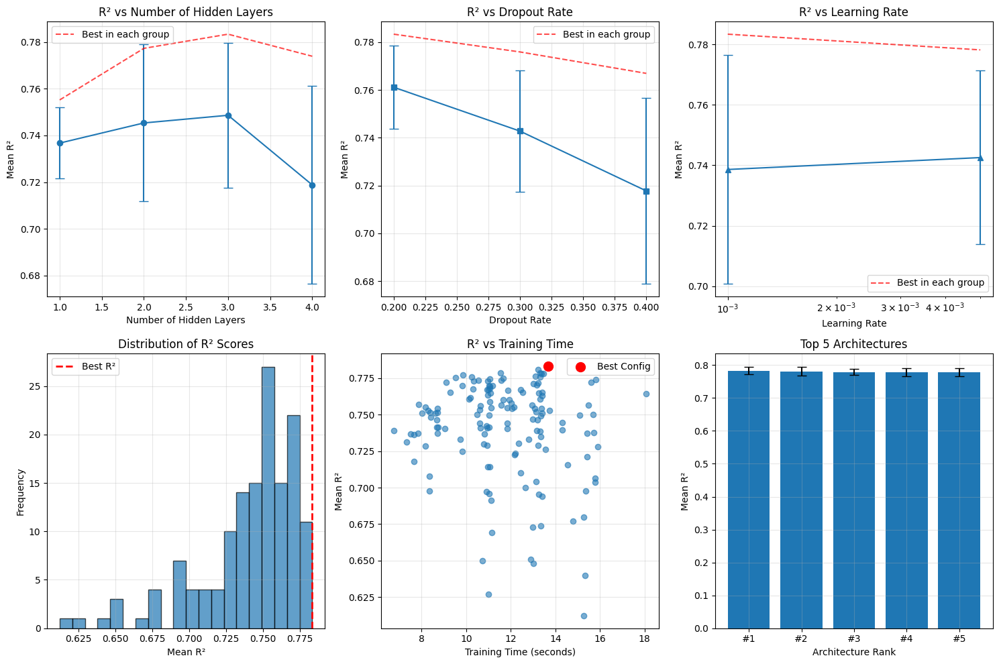


📊 Full results saved to 'architecture_search_results.csv'

📋 RECOMMENDATIONS

Simple architectures (≤2 layers): Mean R² = 0.7425
Complex architectures (≥3 layers): Mean R² = 0.7387
💡 Recommendation: Simpler architectures perform better (less overfitting)

⚡ Most efficient high-performing config:
   Architecture: [256, 256, 256]
   R²: 0.7787, Time: 11.5s

🎯 For your dataset of 130 samples, the optimal architecture is:
   Hidden layers: [256, 512, 256]
   Dropout: 0.2
   Learning rate: 0.001
   Expected R²: 0.7834 ± 0.0120


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
import torch.nn.functional as F
from itertools import product
import time
import seaborn as sns

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

# --------------------------
# 1) LOAD AND PREPARE DATA (Same as before)
# --------------------------
try:
    train_df = pd.read_csv("complete_dataset.csv")
except FileNotFoundError:
    print("Error: 'complete_dataset.csv' not found. Creating dummy data...")
    num_samples_train = 130
    num_counts = 50
    num_spectrum = 104
    train_df = pd.DataFrame(np.random.rand(num_samples_train, num_counts + num_spectrum))
    train_df.columns = [f"count_{i}" for i in range(num_counts)] + [f"spectrum_value_{i}" for i in range(num_spectrum)]

spectrum_cols = [c for c in train_df.columns if c.startswith("spectrum_value_")]
count_cols = [c for c in train_df.columns if c.startswith("count_")]
train_df[spectrum_cols] = train_df[spectrum_cols].apply(pd.to_numeric, errors="coerce")

# Normalization
train_counts_total = train_df[count_cols].sum(axis=1)
train_counts_total[train_counts_total == 0] = 1
train_spectrum_total = train_df[spectrum_cols].sum(axis=1)
train_spectrum_total[train_spectrum_total == 0] = 1

train_df[count_cols] = train_df[count_cols].div(train_counts_total, axis=0)
train_df[spectrum_cols] = train_df[spectrum_cols].div(train_spectrum_total, axis=0)

X_train = train_df[count_cols].values
Y_train = train_df[spectrum_cols].values

# Standardization
scaler_X = StandardScaler()
scaler_Y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
Y_train_scaled = scaler_Y.fit_transform(Y_train)

print(f"Training data shape: X={X_train_scaled.shape}, Y={Y_train_scaled.shape}")

# --------------------------
# 2) FLEXIBLE NEURAL NETWORK CLASS
# --------------------------
class FlexibleNN(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_layers, dropout_rate=0.3):
        super(FlexibleNN, self).__init__()

        self.layers = nn.ModuleList()
        self.batch_norms = nn.ModuleList()
        self.dropouts = nn.ModuleList()

        # Input layer
        prev_dim = input_dim

        # Hidden layers
        for hidden_dim in hidden_layers:
            self.layers.append(nn.Linear(prev_dim, hidden_dim))
            self.batch_norms.append(nn.BatchNorm1d(hidden_dim))
            self.dropouts.append(nn.Dropout(dropout_rate))
            prev_dim = hidden_dim

        # Output layer
        self.output_layer = nn.Linear(prev_dim, output_dim)

        # Initialize weights
        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        for i, (layer, bn, dropout) in enumerate(zip(self.layers, self.batch_norms, self.dropouts)):
            x = F.relu(bn(layer(x)))
            x = dropout(x)

        x = self.output_layer(x)
        return x

# --------------------------
# 3) ARCHITECTURE EVALUATION WITH CROSS-VALIDATION
# --------------------------
def evaluate_architecture(X, Y, hidden_layers, n_splits=3, epochs=300, batch_size=16, lr=0.001, dropout_rate=0.3):
    """
    Evaluate a neural network architecture using cross-validation
    Returns mean R2 score across folds
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    kfold = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    r2_scores = []

    for fold, (train_idx, val_idx) in enumerate(kfold.split(X)):
        # Split data
        X_fold_train, X_fold_val = X[train_idx], X[val_idx]
        Y_fold_train, Y_fold_val = Y[train_idx], Y[val_idx]

        # Convert to tensors
        X_fold_train_tensor = torch.FloatTensor(X_fold_train).to(device)
        Y_fold_train_tensor = torch.FloatTensor(Y_fold_train).to(device)
        X_fold_val_tensor = torch.FloatTensor(X_fold_val).to(device)
        Y_fold_val_tensor = torch.FloatTensor(Y_fold_val).to(device)

        # Create data loader
        train_dataset = TensorDataset(X_fold_train_tensor, Y_fold_train_tensor)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

        # Initialize model
        model = FlexibleNN(X.shape[1], Y.shape[1], hidden_layers, dropout_rate).to(device)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=20, factor=0.7)

        # Training loop with early stopping
        best_val_r2 = -float('inf')
        patience = 40
        patience_counter = 0

        for epoch in range(epochs):
            # Training
            model.train()
            for batch_X, batch_Y in train_loader:
                optimizer.zero_grad()
                outputs = model(batch_X)
                loss = criterion(outputs, batch_Y)
                loss.backward()
                optimizer.step()

            # Validation
            model.eval()
            with torch.no_grad():
                val_outputs = model(X_fold_val_tensor)
                val_loss = criterion(val_outputs, Y_fold_val_tensor).item()

                # Calculate R2 score
                y_true = Y_fold_val
                y_pred = val_outputs.cpu().numpy()
                val_r2 = r2_score(y_true, y_pred)

            scheduler.step(val_loss)

            # Early stopping based on R2
            if val_r2 > best_val_r2:
                best_val_r2 = val_r2
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    break

        r2_scores.append(best_val_r2)

    mean_r2 = np.mean(r2_scores)
    std_r2 = np.std(r2_scores)
    return mean_r2, std_r2

# --------------------------
# 4) HYPERPARAMETER SEARCH
# --------------------------
def architecture_search(X, Y):
    """
    Search for the best neural network architecture
    """
    print("🔍 Starting architecture search...")

    # Define search space
    architectures = [
        # Single hidden layer
        [64], [128], [256], [512],

        # Two hidden layers
        [64, 32], [128, 64], [256, 128], [512, 256],
        [128, 128], [256, 256],
        [64, 128], [128, 256],

        # Three hidden layers
        [128, 256, 128], [256, 512, 256], [512, 256, 128],
        [64, 128, 64], [128, 128, 128], [256, 256, 256],
        [128, 256, 512], [256, 128, 64],

        # Four hidden layers
        [128, 256, 256, 128], [256, 512, 256, 128],
        [64, 128, 128, 64], [128, 256, 128, 64],
    ]

    # Additional hyperparameters to test
    dropout_rates = [0.2, 0.3, 0.4]
    learning_rates = [0.001, 0.005]

    results = []
    best_r2 = -float('inf')
    best_config = None

    total_configs = len(architectures) * len(dropout_rates) * len(learning_rates)
    current_config = 0

    for arch in architectures:
        for dropout in dropout_rates:
            for lr in learning_rates:
                current_config += 1
                print(f"\n[{current_config}/{total_configs}] Testing architecture: {arch}, dropout: {dropout}, lr: {lr}")

                start_time = time.time()
                mean_r2, std_r2 = evaluate_architecture(
                    X, Y, arch, n_splits=3, epochs=200,
                    dropout_rate=dropout, lr=lr
                )
                end_time = time.time()

                # Store results
                result = {
                    'architecture': str(arch),
                    'num_layers': len(arch),
                    'total_params': sum(arch) + arch[0],  # Approximate
                    'dropout_rate': dropout,
                    'learning_rate': lr,
                    'mean_r2': mean_r2,
                    'std_r2': std_r2,
                    'training_time': end_time - start_time
                }
                results.append(result)

                print(f"   R² = {mean_r2:.4f} ± {std_r2:.4f} (Time: {end_time-start_time:.1f}s)")

                # Track best configuration
                if mean_r2 > best_r2:
                    best_r2 = mean_r2
                    best_config = result

    return pd.DataFrame(results), best_config

# --------------------------
# 5) RUN ARCHITECTURE SEARCH
# --------------------------
results_df, best_config = architecture_search(X_train_scaled, Y_train_scaled)

# --------------------------
# 6) ANALYZE RESULTS
# --------------------------
print("\n" + "="*60)
print("🏆 ARCHITECTURE SEARCH RESULTS")
print("="*60)

# Display top 10 architectures
print("\nTop 10 Architectures by R² Score:")
top_10 = results_df.nlargest(10, 'mean_r2')
print(top_10[['architecture', 'dropout_rate', 'learning_rate', 'mean_r2', 'std_r2', 'training_time']].to_string(index=False))

print(f"\n🥇 Best Configuration:")
print(f"   Architecture: {best_config['architecture']}")
print(f"   Dropout Rate: {best_config['dropout_rate']}")
print(f"   Learning Rate: {best_config['learning_rate']}")
print(f"   Mean R²: {best_config['mean_r2']:.4f} ± {best_config['std_r2']:.4f}")
print(f"   Training Time: {best_config['training_time']:.1f}s")

# --------------------------
# 7) VISUALIZATION
# --------------------------
# Plot 1: R² vs Number of Layers
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
layer_performance = results_df.groupby('num_layers')['mean_r2'].agg(['mean', 'std', 'max'])
plt.errorbar(layer_performance.index, layer_performance['mean'],
             yerr=layer_performance['std'], marker='o', capsize=5)
plt.plot(layer_performance.index, layer_performance['max'], 'r--', alpha=0.7, label='Best in each group')
plt.xlabel('Number of Hidden Layers')
plt.ylabel('Mean R²')
plt.title('R² vs Number of Hidden Layers')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 2: R² vs Dropout Rate
plt.subplot(2, 3, 2)
dropout_performance = results_df.groupby('dropout_rate')['mean_r2'].agg(['mean', 'std', 'max'])
plt.errorbar(dropout_performance.index, dropout_performance['mean'],
             yerr=dropout_performance['std'], marker='s', capsize=5)
plt.plot(dropout_performance.index, dropout_performance['max'], 'r--', alpha=0.7, label='Best in each group')
plt.xlabel('Dropout Rate')
plt.ylabel('Mean R²')
plt.title('R² vs Dropout Rate')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 3: R² vs Learning Rate
plt.subplot(2, 3, 3)
lr_performance = results_df.groupby('learning_rate')['mean_r2'].agg(['mean', 'std', 'max'])
plt.errorbar(lr_performance.index, lr_performance['mean'],
             yerr=lr_performance['std'], marker='^', capsize=5)
plt.plot(lr_performance.index, lr_performance['max'], 'r--', alpha=0.7, label='Best in each group')
plt.xlabel('Learning Rate')
plt.ylabel('Mean R²')
plt.title('R² vs Learning Rate')
plt.xscale('log')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 4: R² Distribution
plt.subplot(2, 3, 4)
plt.hist(results_df['mean_r2'], bins=20, alpha=0.7, edgecolor='black')
plt.axvline(best_config['mean_r2'], color='red', linestyle='--', linewidth=2, label='Best R²')
plt.xlabel('Mean R²')
plt.ylabel('Frequency')
plt.title('Distribution of R² Scores')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 5: R² vs Training Time
plt.subplot(2, 3, 5)
plt.scatter(results_df['training_time'], results_df['mean_r2'], alpha=0.6)
plt.scatter(best_config['training_time'], best_config['mean_r2'],
           color='red', s=100, label='Best Config', zorder=5)
plt.xlabel('Training Time (seconds)')
plt.ylabel('Mean R²')
plt.title('R² vs Training Time')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 6: Top architectures comparison
plt.subplot(2, 3, 6)
top_5 = results_df.nlargest(5, 'mean_r2')
x_pos = range(len(top_5))
plt.bar(x_pos, top_5['mean_r2'], yerr=top_5['std_r2'], capsize=5)
plt.xlabel('Architecture Rank')
plt.ylabel('Mean R²')
plt.title('Top 5 Architectures')
plt.xticks(x_pos, [f"#{i+1}" for i in x_pos])
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --------------------------
# 8) SAVE RESULTS
# --------------------------
results_df.to_csv('architecture_search_results.csv', index=False)
print(f"\n📊 Full results saved to 'architecture_search_results.csv'")

# --------------------------
# 9) RECOMMENDATIONS
# --------------------------
print("\n" + "="*60)
print("📋 RECOMMENDATIONS")
print("="*60)

# Architecture complexity analysis
simple_archs = results_df[results_df['num_layers'] <= 2]
complex_archs = results_df[results_df['num_layers'] >= 3]

print(f"\nSimple architectures (≤2 layers): Mean R² = {simple_archs['mean_r2'].mean():.4f}")
print(f"Complex architectures (≥3 layers): Mean R² = {complex_archs['mean_r2'].mean():.4f}")

if simple_archs['mean_r2'].mean() > complex_archs['mean_r2'].mean():
    print("💡 Recommendation: Simpler architectures perform better (less overfitting)")
else:
    print("💡 Recommendation: More complex architectures capture better patterns")

# Efficiency analysis
efficient_configs = results_df[(results_df['mean_r2'] >= results_df['mean_r2'].quantile(0.8)) &
                              (results_df['training_time'] <= results_df['training_time'].median())]

if not efficient_configs.empty:
    print(f"\n⚡ Most efficient high-performing config:")
    best_efficient = efficient_configs.loc[efficient_configs['mean_r2'].idxmax()]
    print(f"   Architecture: {best_efficient['architecture']}")
    print(f"   R²: {best_efficient['mean_r2']:.4f}, Time: {best_efficient['training_time']:.1f}s")

print(f"\n🎯 For your dataset of 130 samples, the optimal architecture is:")
print(f"   Hidden layers: {best_config['architecture']}")
print(f"   Dropout: {best_config['dropout_rate']}")
print(f"   Learning rate: {best_config['learning_rate']}")
print(f"   Expected R²: {best_config['mean_r2']:.4f} ± {best_config['std_r2']:.4f}")